In [ ]:
from google.colab import drive
import torchvision
import torchvision.transforms as transforms
import torch
from torch.utils import data
import torch.nn as nn
import math
import matplotlib.pyplot as plt
import torch.optim as optim
import numpy as np
import time
import gc
import torch.nn.functional as F
import helper
from sklearn import metrics
from sklearn.metrics import accuracy_score
from torchsummary import summary
from torch.utils.data import ConcatDataset
import os
from sklearn import metrics
import seaborn as sn
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter
from torch import autograd
from torch import nn
from torch.autograd import Variable

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


## Data Loader

In [ ]:
# Because the dataset is extremely unbalanced, so I am doing a stratified split here 
# https://discuss.pytorch.org/t/how-to-do-a-stratified-split/62290
# https://stackoverflow.com/questions/40829137/stratified-train-validation-test-split-in-scikit-learn

torch.manual_seed(66)
np.random.seed(66)

# Rescale Everything to 50X50 px
transform_function = transforms.Compose(
        [
         transforms.Resize((50,50)),
         transforms.ToTensor(),
         ])

# Ref:https://discuss.pytorch.org/t/attributeerror-subset-object-has-no-attribute-targets/66564/4
class Custom_Subset(data.Dataset):
    """
    Subset of a dataset at specified indices.

    Arguments:
        dataset (Dataset): The whole Dataset
        indices (sequence): Indices in the whole set selected for subset
        labels(sequence) : targets as required for the indices. will be the same length as indices
    """
    def __init__(self, dataset, indices, labels):
        self.dataset = data.Subset(dataset, indices)
        self.targets = labels
    def __getitem__(self, idx):
        image = self.dataset[idx][0]
        target = self.targets[idx]
        return (image, target)
    def __len__(self):
        return len(self.targets)


def get_data_loader(batch_size):
  full_training_data = torchvision.datasets.ImageFolder(
    root="/content/drive/My Drive/MIE424 Final Project/cropped_img",
    transform=transform_function)
  
  # run train_test_split twice to stratified split dataset into train,validation and testing
  targets = full_training_data.targets
  # print(dict(Counter(targets)))
  train_idx, valid_test_idx= train_test_split(np.arange(len(targets)),test_size=0.2,shuffle=True,stratify=targets)
  train_targets = [targets[i] for i in train_idx]
  # print(dict(Counter(train_targets)))
  train_data = Custom_Subset(full_training_data,train_idx,train_targets)
  valid_test_targets = [targets[i] for i in valid_test_idx]
  # print(dict(Counter(valid_test_targets)))
  valid_test_data = Custom_Subset(full_training_data,valid_test_idx,valid_test_targets)

  valid_idx, test_idx= train_test_split(np.arange(len(valid_test_targets)),test_size=0.5,shuffle=True,stratify=valid_test_targets)
  valid_targets = [valid_test_targets[i] for i in valid_idx]
  
  test_targets = [valid_test_targets[i] for i in test_idx]
  valid_data = Custom_Subset(valid_test_data,valid_idx,valid_targets)
  test_data = Custom_Subset(valid_test_data,test_idx,test_targets)

  print("There are " + str(len(train_data)) + " training images, and the corresponding data distribution is: ")
  print(dict(Counter(train_data.targets)))
  print("There are " + str(len(valid_data)) + " validation images, and the corresponding data distribution is: ")
  print(dict(Counter(valid_data.targets)))
  print("There are " + str(len(test_data)) + " test images, and the corresponding data distribution is: ")
  print(dict(Counter(test_data.targets)))
  
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,num_workers=2)
  
  val_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size,num_workers=2)

  test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size,num_workers=2)
  
  return train_loader, val_loader, test_loader

In [ ]:
train_loader, val_loader, test_loader = get_data_loader(batch_size=400)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}


tensor(1)
tensor(1)
tensor(2)
tensor(2)
tensor(0)
tensor(0)


<Figure size 432x288 with 0 Axes>

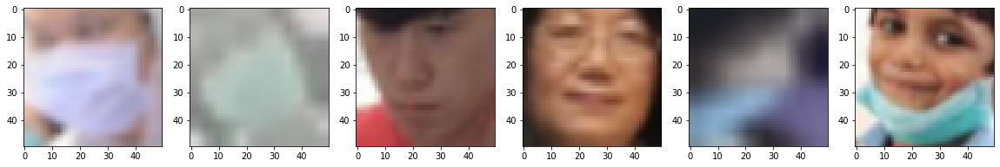

In [ ]:
# Training_dataset
plt.figure()
_, sp = plt.subplots(1,6,figsize=(20,20)) 
images, labels = next(iter(train_loader))
# Add this so I can get 2 samples from each class
image_counter = {0:0,1:0,2:0}
index_counter = 0
for i in range(400):
  temp_index = i
  temp_img = images[temp_index].numpy().transpose((1, 2, 0))
  if image_counter[labels[temp_index].item()] < 2:
    print(labels[temp_index])
    sp[index_counter].imshow(temp_img)
    image_counter[labels[temp_index].item()] += 1
    index_counter+=1
  
  if sum(image_counter.values()) == 6:
    break

tensor(1)
tensor(1)
tensor(2)
tensor(2)
tensor(0)
tensor(0)


<Figure size 432x288 with 0 Axes>

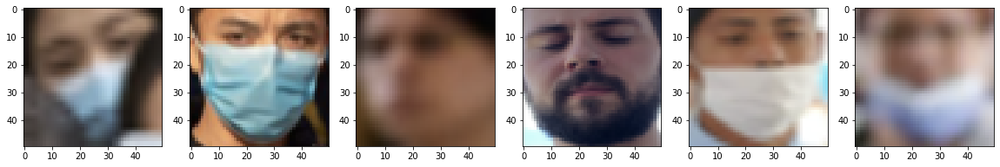

In [ ]:
# Validation_dataset
plt.figure()
_, sp = plt.subplots(1,6,figsize=(20,20)) 
images, labels = next(iter(val_loader))
# Add this so I can get 2 samples from each class
image_counter = {0:0,1:0,2:0}
index_counter = 0
for i in range(400):
  temp_index = i
  temp_img = images[temp_index].numpy().transpose((1, 2, 0))
  if image_counter[labels[temp_index].item()] < 2:
    print(labels[temp_index])
    sp[index_counter].imshow(temp_img)
    image_counter[labels[temp_index].item()] += 1
    index_counter+=1
  
  if sum(image_counter.values()) == 6:
    break

tensor(1)
tensor(1)
tensor(2)
tensor(2)
tensor(0)
tensor(0)


<Figure size 432x288 with 0 Axes>

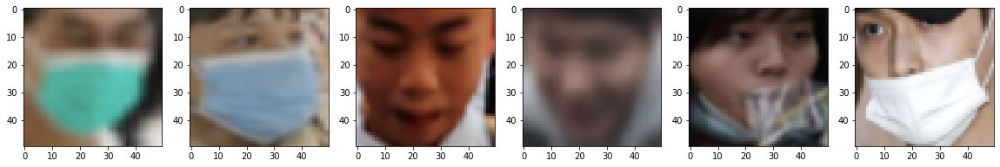

In [ ]:
# Testing_dataset
plt.figure()
_, sp = plt.subplots(1,6,figsize=(20,20)) 
images, labels = next(iter(test_loader))
# Add this so I can get 2 samples from each class
image_counter = {0:0,1:0,2:0}
index_counter = 0
for i in range(400):
  temp_index = i
  temp_img = images[temp_index].numpy().transpose((1, 2, 0))
  if image_counter[labels[temp_index].item()] < 2:
    print(labels[temp_index])
    sp[index_counter].imshow(temp_img)
    image_counter[labels[temp_index].item()] += 1
    index_counter+=1
  
  if sum(image_counter.values()) == 6:
    break

## Model Building

In [ ]:
# Base Model Code Ref: https://github.com/bollakarthikeya/LeNet-5-PyTorch/blob/master/lenet5_gpu.py
# Note Here: In the original LeNet, they used Tanh. But we used a modified LeNet 5 with Relu as activation function to accelerate the convergence during training. 
# Ref for this: https://sh-tsang.medium.com/paper-brief-review-of-lenet-1-lenet-4-lenet-5-boosted-lenet-4-image-classification-1f5f809dbf17

class LeNet5(torch.nn.Module):          
  def __init__(self,num_class=3):     
    super(LeNet5, self).__init__()
    # [(W−K+2P)/S]+1
    self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5, stride=1, padding=2, bias=True)
    self.avg_pool = torch.nn.AvgPool2d(kernel_size = 2, stride = 2, padding = 0)
    self.conv2 = torch.nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5, stride=1, padding=0, bias=True)
    self.fc1 = torch.nn.Linear(16*10*10, 240)   
    self.fc2 = torch.nn.Linear(240, 120)       
    self.fc3 = torch.nn.Linear(120, num_class)
      
  def forward(self, x):
    # first conv with ReLU non-linearity
    # print(x.shape)
    x = torch.nn.functional.relu(self.conv1(x))  
    # 2x2 avg_pool
    # print(x.shape)
    x = self.avg_pool(x)
    # print(x.shape) 
    # second conv with ReLU non-linearity
    x = torch.nn.functional.relu(self.conv2(x))
    # print(x.shape)
    # 2x2 avg_pool
    x = self.avg_pool(x)
    # print(x.shape)
    # flatten out the output
    x = x.view(-1, 16*10*10)
    # first fc with ReLU non-linearity
    x = torch.nn.functional.relu(self.fc1(x))
    # second fc with ReLU non-linearity
    x = torch.nn.functional.relu(self.fc2(x))
    # output result 
    x = self.fc3(x)
    
    return x

##Training Code

In [ ]:
# REF https://www.cs.toronto.edu/~lczhang/aps360_20191/hw/a2/a2code.py

def get_model_name(name, batch_size, learning_rate, epoch):
    path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(name,
                                                   batch_size,
                                                   learning_rate,
                                                   epoch)
    return path

def plot_training_curve(path):
    # Plots the training curve for a model run, given the csv files containing the train/validation error/loss.
    train_err = np.loadtxt("{}_train_err.csv".format(path))
    val_err = np.loadtxt("{}_val_err.csv".format(path))
    train_loss = np.loadtxt("{}_train_loss.csv".format(path))
    val_loss = np.loadtxt("{}_val_loss.csv".format(path))
    plt.title("Train vs Validation Error")
    plt.style.use('default')
    n = len(train_err) # number of epochs
    plt.plot(range(1,n+1), train_err, label="Train")
    plt.plot(range(1,n+1), val_err, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Error")
    plt.legend(loc='best')
    plt.show()
    plt.title("Train vs Validation Loss")
    plt.plot(range(1,n+1), train_loss, label="Train")
    plt.plot(range(1,n+1), val_loss, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()

def evaluate(net, loader, criterion):
  total_loss = 0.0
  total_err = 0.0
  total_epoch = 0
  for i, data in enumerate(loader, 0):
      inputs, labels = data
      inputs = inputs.cuda()
      labels = labels.cuda()
      outputs = net(inputs)
      loss = criterion(outputs, labels.long())
      _, predicted = torch.max(outputs.data, 1)
      error_count = (predicted != labels).sum().item()
      total_err += int(error_count)
      total_loss += loss.item()
      total_epoch += labels.size(0)

  err = float(total_err) / total_epoch
  loss = float(total_loss) / (i + 1)
  return err, loss

def train_model(net, model_name, loss_function, batch_size=32, learning_rate=0.0001, num_epochs=30, print_stack_trace=True,save_output=False, output_path="/content/drive/My Drive/MIE424 Final Project/model_output/", using_cifar = False):
  torch.manual_seed(1000)
  if using_cifar:
    train_loader, val_loader, test_loader = get_data_loader_cifar_10_LT(batch_size=batch_size)
  else:
    train_loader, val_loader, test_loader = get_data_loader(batch_size=batch_size)
  # Keep Track of Best Performed Model:
  performance_dict = dict()
  performance_dict["best_val_err"] = ["model_name", 10000, 10000]
  performance_dict["best_val_loss"] = ["model_name", 10000, 10000]

  criterion = loss_function.cuda()
  optimizer = optim.Adam(net.parameters(), lr=learning_rate)
  train_err = np.zeros(num_epochs)
  train_loss = np.zeros(num_epochs)
  val_err = np.zeros(num_epochs)
  val_loss = np.zeros(num_epochs)

  # Train the network
  start_time = time.time()
  for epoch in range(num_epochs):
      total_train_loss = 0.0
      total_train_err = 0.0
      total_epoch = 0
      for i, data in enumerate(train_loader, 0):
        gc.collect()
        torch.cuda.empty_cache()
        inputs, labels = data
        inputs = inputs.cuda()
        labels = labels.cuda()
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        _, predicted = torch.max(outputs.data, 1)
        error_count = (predicted != labels).sum().item()
        total_train_err += int(error_count)


        total_train_loss += loss.item()
        total_epoch += labels.size(0)
        # print('Finished 1 batch')

        torch.cuda.empty_cache()

      train_err[epoch] = float(total_train_err) / total_epoch
      train_loss[epoch] = float(total_train_loss) / (i+1)
      val_err[epoch], val_loss[epoch] = evaluate(net, val_loader, criterion)
      if print_stack_trace:
        print(("Epoch {}: Train err: {}, Train loss: {} |"+
                "Validation err: {}, Validation loss: {}").format(
                    epoch + 1,
                    train_err[epoch],
                    train_loss[epoch],
                    val_err[epoch],
                    val_loss[epoch]))
      model_path = get_model_name(model_name, batch_size, learning_rate, epoch)
      
      if val_err[epoch] < performance_dict["best_val_err"][1]:
        performance_dict["best_val_err"] = [model_path, val_err[epoch], val_loss[epoch]]
        model_file_name = output_path + model_name + "best_val_err"
        if save_output:
          torch.save(net.state_dict(), model_file_name)
      if val_loss[epoch] < performance_dict["best_val_loss"][2]:
        performance_dict["best_val_loss"] = [model_path, val_err[epoch], val_loss[epoch]]
        model_file_name = output_path +  model_name + "best_val_loss"
        if save_output:
          torch.save(net.state_dict(), model_file_name)

  print('Finished Training: {}'.format(model_name))
  end_time = time.time()
  elapsed_time = end_time - start_time
  print("Total time elapsed: {:.2f} seconds".format(elapsed_time))
  print("The best model based on validation err is {}, its val_error is {} and val_loss is {}".format(performance_dict["best_val_err"][0],performance_dict["best_val_err"][1],performance_dict["best_val_err"][2]))
  print("The best model based on validation loss is {}, its val_error is {} and val_loss is {}".format(performance_dict["best_val_loss"][0],performance_dict["best_val_loss"][1],performance_dict["best_val_loss"][2]))
  torch.cuda.empty_cache()

  plt.title("Train vs Validation Error")
  n = len(train_err) # number of epochs
  plt.plot(range(1,n+1), train_err, label="Train")
  plt.plot(range(1,n+1), val_err, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Error")
  plt.legend(loc='best')
  plt.style.use('default')
  plt.show()
  plt.title("Train vs Validation Loss")
  plt.plot(range(1,n+1), train_loss, label="Train")
  plt.plot(range(1,n+1), val_loss, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.style.use('default')
  plt.show()

  train_err_file_name = output_path + "{}_train_err.csv"
  train_loss_file_name = output_path + "{}_train_loss.csv"  
  val_err_file_name = output_path + "{}_val_err.csv"
  val_loss_file_name = output_path + "{}_val_loss.csv"

  if save_output:
    np.savetxt(train_err_file_name.format(model_path), train_err)
    np.savetxt(train_loss_file_name.format(model_path), train_loss)
    np.savetxt(val_err_file_name.format(model_path), val_err)
    np.savetxt(val_loss_file_name.format(model_path), val_loss)

##Hyperparameter Tuning
To have a reasonable hyperparameter setup for loss function evaluation


There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_LR_Tuning_1e-06
Total time elapsed: 405.77 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_1e-06_bs32_lr1e-06_epoch0, its val_error is 0.20638820638820637 and val_loss is 1.0719043199832623
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_1e-06_bs32_lr1e-06_epoch49, its val_error is 0.20638820638820637 and val_loss is 0.5790363527261294


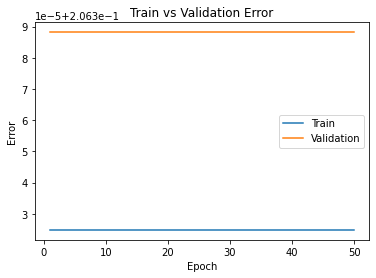

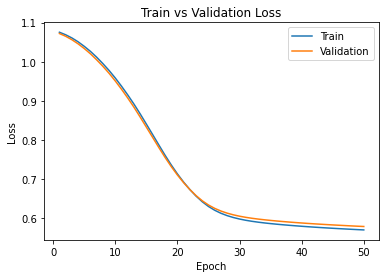

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Default_LeNet5_LR_Tuning_1e-05
Total time elapsed: 403.36 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_1e-05_bs32_lr1e-05_epoch49, its val_error is 0.0687960687960688 and val_loss is 0.21326655951830056
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_1e-05_bs32_lr1e-05_epoch49, its val_error is 0.0687960687960688 and val_loss is 0.21326655951830056


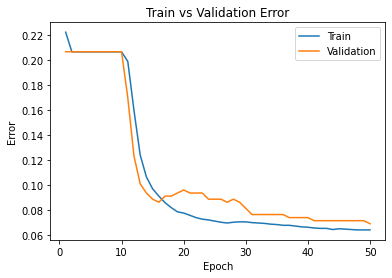

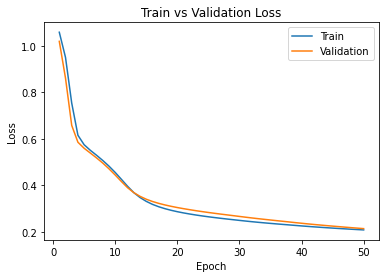

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_LR_Tuning_0.0001
Total time elapsed: 433.33 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_0.0001_bs32_lr0.0001_epoch44, its val_error is 0.051597051597051594 and val_loss is 0.16973835344497973
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_0.0001_bs32_lr0.0001_epoch29, its val_error is 0.056511056511056514 and val_loss is 0.16569130022365314


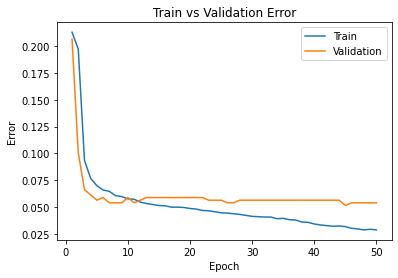

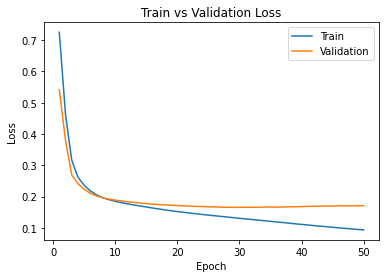

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_LR_Tuning_0.001
Total time elapsed: 489.38 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_0.001_bs32_lr0.001_epoch44, its val_error is 0.03931203931203931 and val_loss is 0.34418835445943
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_0.001_bs32_lr0.001_epoch12, its val_error is 0.05405405405405406 and val_loss is 0.19672705691594344


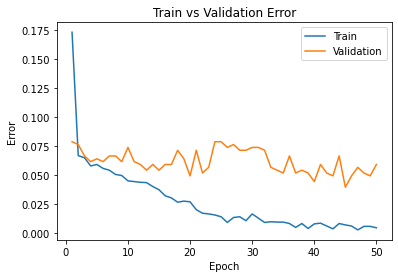

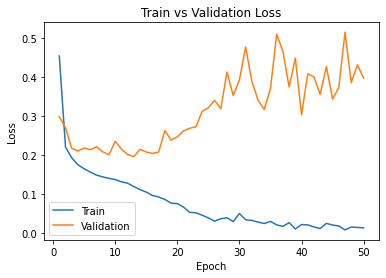

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Default_LeNet5_LR_Tuning_0.005
Total time elapsed: 499.59 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_0.005_bs32_lr0.005_epoch14, its val_error is 0.051597051597051594 and val_loss is 0.1762346401810646
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_0.005_bs32_lr0.005_epoch14, its val_error is 0.051597051597051594 and val_loss is 0.1762346401810646


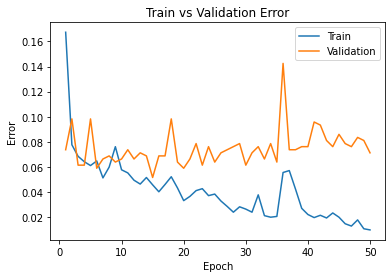

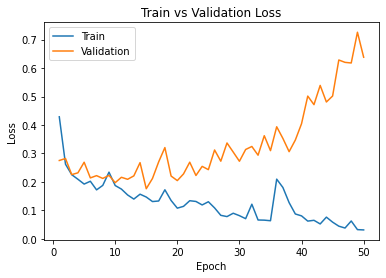

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Default_LeNet5_LR_Tuning_0.01
Total time elapsed: 498.64 seconds
The best model based on validation err is model_Default_LeNet5_LR_Tuning_0.01_bs32_lr0.01_epoch0, its val_error is 0.20638820638820637 and val_loss is 0.6019250704691961
The best model based on validation loss is model_Default_LeNet5_LR_Tuning_0.01_bs32_lr0.01_epoch3, its val_error is 0.20638820638820637 and val_loss is 0.5994411982022799


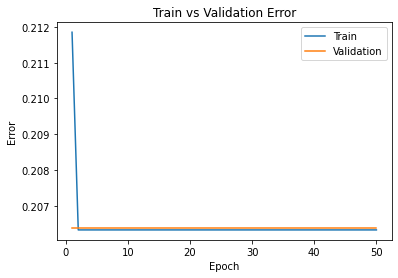

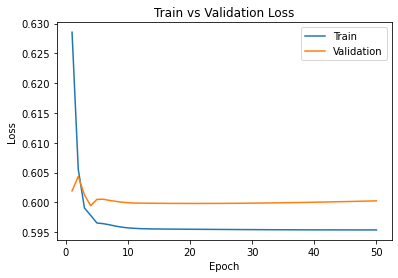

In [ ]:
# Check the impact of different learning rate on the Default_LeNet5 model:
learning_rate_to_try = [0.000001,0.00001,0.0001,0.001,0.005,0.01]
for i in learning_rate_to_try:
  model_name = "Default_LeNet5_LR_Tuning_" + str(i)
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = nn.CrossEntropyLoss()
  train_model(lenet,model_name,batch_size=32, num_epochs=50, learning_rate=i,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_8
Total time elapsed: 1807.23 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_8_bs8_lr0.0001_epoch38, its val_error is 0.05405405405405406 and val_loss is 0.2439183779993875
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_8_bs8_lr0.0001_epoch16, its val_error is 0.07125307125307126 and val_loss is 0.18739409412385202


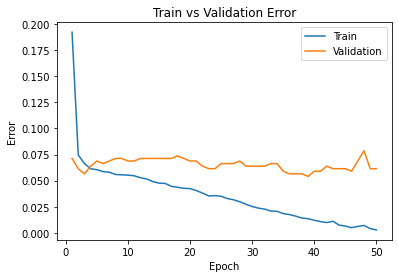

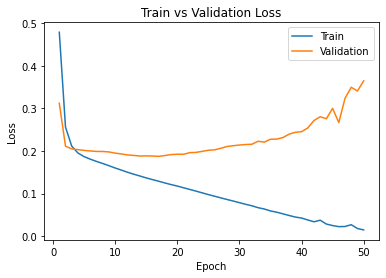

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_16
Total time elapsed: 714.30 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_16_bs16_lr0.0001_epoch6, its val_error is 0.06633906633906633 and val_loss is 0.1999281715028561
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_16_bs16_lr0.0001_epoch8, its val_error is 0.0687960687960688 and val_loss is 0.19926899542602208


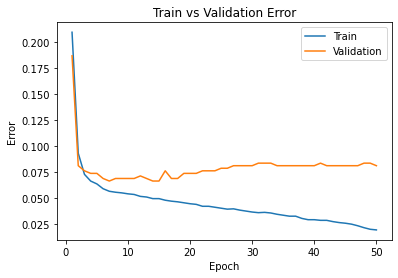

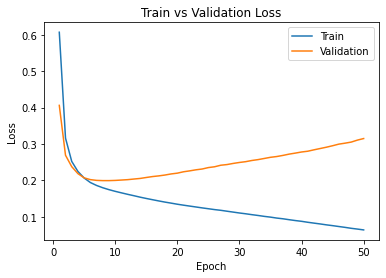

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_32
Total time elapsed: 404.88 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_32_bs32_lr0.0001_epoch45, its val_error is 0.04914004914004914 and val_loss is 0.15340476798323485
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_32_bs32_lr0.0001_epoch32, its val_error is 0.051597051597051594 and val_loss is 0.1468384902064617


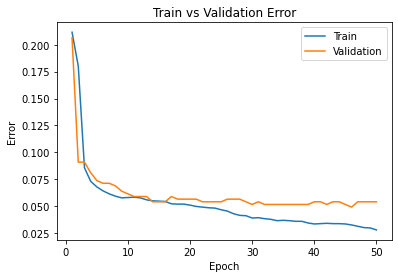

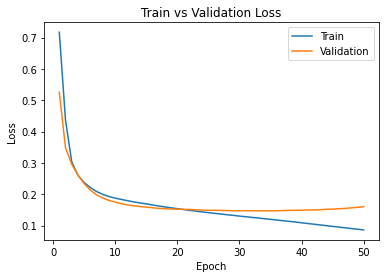

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_64
Total time elapsed: 268.40 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_64_bs64_lr0.0001_epoch47, its val_error is 0.04668304668304668 and val_loss is 0.15125858251537597
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_64_bs64_lr0.0001_epoch45, its val_error is 0.04914004914004914 and val_loss is 0.1505260124270405


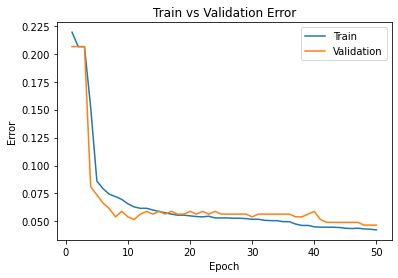

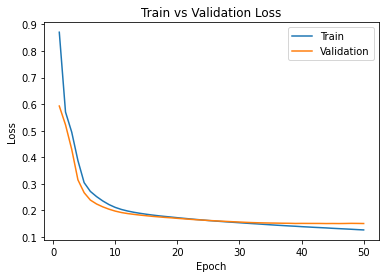

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_128
Total time elapsed: 237.82 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_128_bs128_lr0.0001_epoch22, its val_error is 0.051597051597051594 and val_loss is 0.20695574581623077
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_128_bs128_lr0.0001_epoch49, its val_error is 0.06142506142506143 and val_loss is 0.18291980028152466


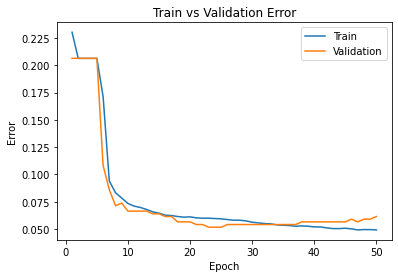

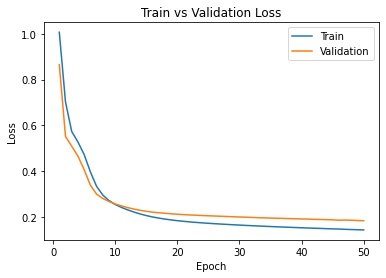

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Default_LeNet5_BS_Tuning_256
Total time elapsed: 231.56 seconds
The best model based on validation err is model_Default_LeNet5_BS_Tuning_256_bs256_lr0.0001_epoch44, its val_error is 0.05405405405405406 and val_loss is 0.21897824108600616
The best model based on validation loss is model_Default_LeNet5_BS_Tuning_256_bs256_lr0.0001_epoch49, its val_error is 0.05405405405405406 and val_loss is 0.21640968322753906


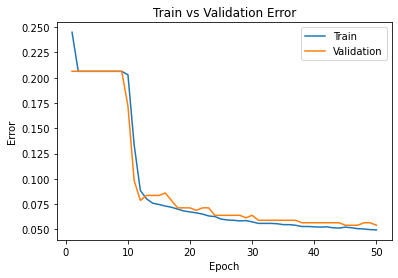

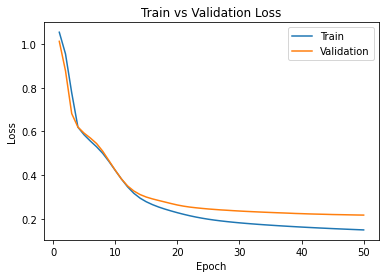

In [ ]:
# Check the impact of different batch number on the Default_LeNet5 model with lr=0.0001:
batch_size_to_try = [8,16,32,64,128,256]
for i in batch_size_to_try:
  model_name = "Default_LeNet5_BS_Tuning_" + str(i)
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = nn.CrossEntropyLoss()
  train_model(lenet,model_name,batch_size=i, num_epochs=50, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Default_LeNet5_With_Larger_Epochs_256
Total time elapsed: 2746.70 seconds
The best model based on validation err is model_Default_LeNet5_With_Larger_Epochs_256_bs64_lr0.0001_epoch118, its val_error is 0.04668304668304668 and val_loss is 0.27604682384324924
The best model based on validation loss is model_Default_LeNet5_With_Larger_Epochs_256_bs64_lr0.0001_epoch63, its val_error is 0.056511056511056514 and val_loss is 0.22256463021039963


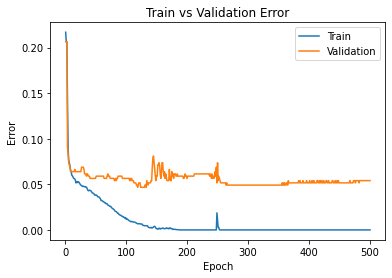

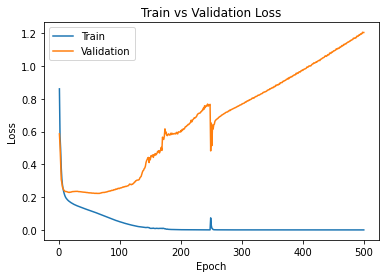

In [ ]:
# To investigate if we need more epochs to stablize the result, and the output will not be saved here
model_name = "Default_LeNet5_With_Larger_Epochs_"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = nn.CrossEntropyLoss()
train_model(lenet,model_name,batch_size=64, num_epochs=500, learning_rate=0.0001,loss_function=loss_function,save_output=False,print_stack_trace=False)

In this case, batch_size=64, learning_rate=0.0001, will become our final setup for loss function evaluation

## Loss Function

#### Cross Entropy Loss

In [ ]:
class CrossEntropyLoss_IMP(nn.Module):

  def __init__(self):
    super().__init__()

  def forward(self, inputs, targets):
    # Convert output to prob through softmax
    softmax_prob = inputs.exp() / (inputs.exp().sum(-1)).unsqueeze(-1)
    # Math calculation
    loss = -softmax_prob[range(targets.shape[0]), targets].log().mean()
    return loss

#### Weighted Cross Entropy Loss

In [ ]:
class Weighted_CrossEntropyLoss_IMP(nn.Module):

  def __init__(self, weights):
      super().__init__()
      self.weights = weights

  def forward(self, inputs, targets):
      softmax_prob = inputs.exp() / (inputs.exp().sum(-1)).unsqueeze(-1)
      weight = torch.FloatTensor([self.weights]*len(inputs)).cuda()
      loss = -torch.mul(softmax_prob[range(targets.shape[0]), targets].log(), weight[range(targets.shape[0]), targets]).mean()
      return loss

#### Focal Loss

In [ ]:
# Paper Ref:
class FocalLoss_IMP(nn.Module):
    def __init__(self, gamma=2):
        super(FocalLoss_IMP, self).__init__()
        self.gamma = gamma
        
    def forward(self, inputs, targets):
        # print(targets)
        d_0 = inputs.size(0) 
        d_1 = inputs.size(1)
        P = inputs.exp() / (inputs.exp().sum(-1)).unsqueeze(-1)

        # convert the label to 0 1
        #Ref https://github.com/laughtervv/Deeplab-Pytorch/tree/master/models
        class_mask = inputs.data.new(d_0, d_1).fill_(0)
        class_mask = Variable(class_mask)
        ids = targets.view(-1, 1)
        class_mask.scatter_(1, ids.data, 1.)  
        probs = (P*class_mask).sum(1).view(-1,1)

        log_p = P[range(targets.shape[0]), targets].log()
        batch_loss = -(torch.pow((1-probs), self.gamma))*log_p 
        loss = batch_loss.mean()
        return loss

#### SparseMax Loss

In [ ]:
# Paper Ref: https://arxiv.org/pdf/1602.02068.pdf
# This loss function utilize the sparse transformation created by KrisKorrel
# Ref https://github.com/KrisKorrel/sparsemax-pytorch/blob/master/sparsemax.py

device = torch.device("cuda")
class Sparsemax_Loss_IMP(torch.nn.Module):

    def __init__(self):
        super(Sparsemax_Loss_IMP, self).__init__()

    def forward(self, input, target):
        input = input.transpose(0, -1)
        original_size = input.size()
        input = input.reshape(input.size(0), -1)
        input = input.transpose(0, 1)
        dim = 1
        number_of_logits = input.size(dim)
        input = input - torch.max(input, dim=dim, keepdim=True)[0].expand_as(input)
        zs = torch.sort(input=input, dim=dim, descending=True)[0]
        range = torch.arange(start=1, end=number_of_logits + 1, step=1, device=device, dtype=input.dtype).view(1, -1)
        range = range.expand_as(zs)
        bound = 1 + range * zs
        cumulative_sum_zs = torch.cumsum(zs, dim)
        is_gt = torch.gt(bound, cumulative_sum_zs).type(input.type())
        k = torch.max(is_gt * range, dim, keepdim=True)[0]
        zs_sparse = is_gt * zs
        taus = (torch.sum(zs_sparse, dim, keepdim=True) - 1) / k
        taus = taus.expand_as(input)
        self.output = torch.max(torch.zeros_like(input), input - taus)
        output = self.output
        output = output.transpose(0, 1)
        output = output.reshape(original_size)
        output = output.transpose(0, -1)

        results = torch.sum(input * output, dim=1) - (0.5 * torch.sum((output ** 2), dim=1) - 0.5)
        all_rows = torch.arange(target.shape[0])
        results -= input[all_rows, target]
        return torch.mean(results)

#### LDAM

In [ ]:
# REF Paper:

class LDAMLoss_IMP(nn.Module):

    def __init__(self, n, C, normalize = True):
        super(LDAMLoss_IMP, self).__init__()
        gamma = 1.0 / np.power(n, (1/4))
        # Ref https://github.com/kaidic/LDAM-DRW/blob/master/losses.py
        if normalize:
          normalized_C = C / np.max(gamma)
          gamma = gamma * normalized_C
        else:
          gamma = gamma * C
        gamma = torch.from_numpy(gamma)
        gamma = gamma.type(torch.FloatTensor)
        gamma.cuda()
        self.gamma = gamma

    def forward(self, inputs, targets):
        one_hot = torch.zeros((inputs.shape[0], inputs.shape[1]), dtype=torch.uint8).cuda()
        # convert the label to 0 1
        # Ref https://github.com/laughtervv/Deeplab-Pytorch/tree/master/models
        ids = targets.view(-1, 1)
        one_hot.scatter_(1, ids.data, 1.)
        target_gamma = (self.gamma@(one_hot.type(torch.FloatTensor)).transpose(0, 1)).view(-1, 1).cuda()
        regularized_x = inputs - target_gamma
        output = torch.where(one_hot, regularized_x, inputs)
        softmax_prob = output.exp() / (output.exp().sum(-1)).unsqueeze(-1)
        loss = -softmax_prob[range(targets.shape[0]), targets].log().mean()
        return loss

## Model Training

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 0: 13, 2: 71}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_CrossEntropyLoss_IMP
Total time elapsed: 609.47 seconds
The best model based on validation err is model_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch97, its val_error is 0.036855036855036855 and val_loss is 0.12954867338495596
The best model based on validation loss is model_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch98, its val_error is 0.036855036855036855 and val_loss is 0.12901823914476804


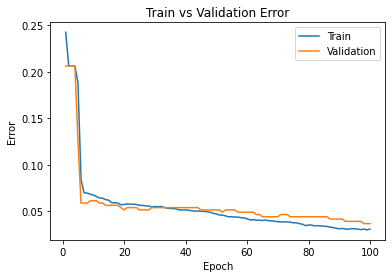

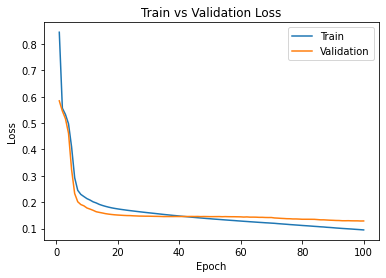

In [ ]:
# CE
model_name = "Loss_Function_Evaluation_CrossEntropyLoss_IMP"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = CrossEntropyLoss_IMP()
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_CrossEntropyLoss_PYTORCH
Total time elapsed: 739.05 seconds
The best model based on validation err is model_Loss_Function_Evaluation_CrossEntropyLoss_PYTORCH_bs64_lr0.0001_epoch48, its val_error is 0.044226044226044224 and val_loss is 0.15140946741615022
The best model based on validation loss is model_Loss_Function_Evaluation_CrossEntropyLoss_PYTORCH_bs64_lr0.0001_epoch70, its val_error is 0.04668304668304668 and val_loss is 0.14507797732949257


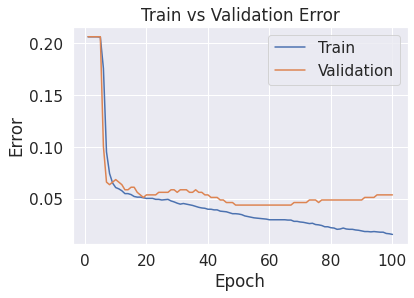

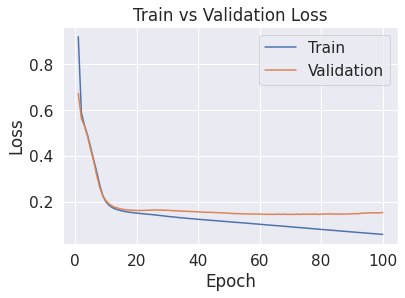

In [ ]:
# CE - PyTorch Implementation
model_name = "Loss_Function_Evaluation_CrossEntropyLoss_PYTORCH"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = nn.CrossEntropyLoss()
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_PYTORCH_Inver_Num256
Total time elapsed: 722.44 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_PYTORCH_Inver_Num256_bs64_lr0.0001_epoch95, its val_error is 0.07371007371007371 and val_loss is 0.5059620227132525
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_PYTORCH_Inver_Num256_bs64_lr0.0001_epoch64, its val_error is 0.09090909090909091 and val_loss is 0.3888310641050339


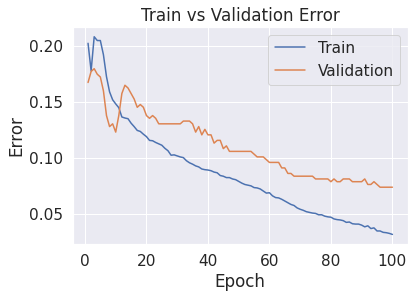

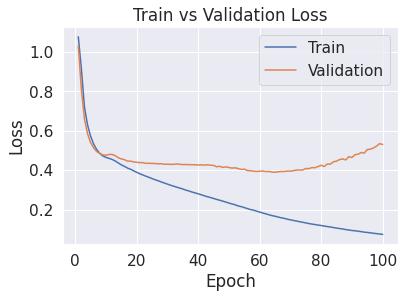

In [ ]:
# Weighted CE PyTorch Implementation (Weight = Inverse of # class)
model_name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_PYTORCH_Inver_Num"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = nn.CrossEntropyLoss(weight=torch.FloatTensor([3257.0/98.0,3257.0/2585.0,3257.0/574.0]))
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency
Total time elapsed: 680.80 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency_bs64_lr0.0001_epoch10, its val_error is 0.056511056511056514 and val_loss is 0.032680482270994356
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency_bs64_lr0.0001_epoch74, its val_error is 0.06388206388206388 and val_loss is 0.021425963412704214


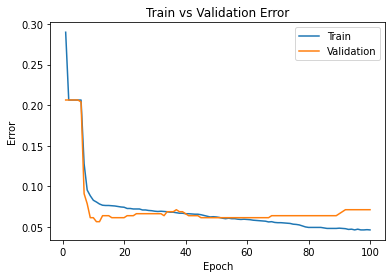

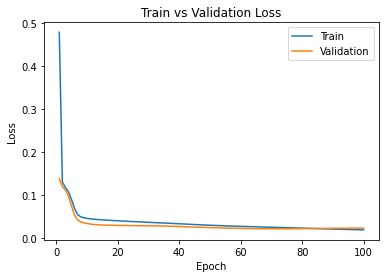

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency
Total time elapsed: 694.93 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency_bs64_lr0.0001_epoch29, its val_error is 0.09090909090909091 and val_loss is 1.445060874734606
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency_bs64_lr0.0001_epoch84, its val_error is 0.09828009828009827 and val_loss is 1.1947571209498815


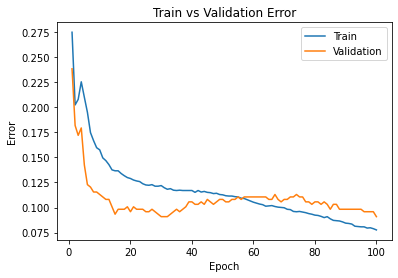

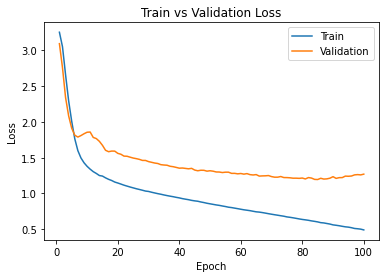

In [ ]:
# Weighted CE (Weight = Frequency)
model_name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = Weighted_CrossEntropyLoss_IMP(weights=[98.0/3257.0,2585.0/3257.0,574.0/3257.0])
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)
# Weighted CE (Weight = Inverse class frequency)
model_name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = Weighted_CrossEntropyLoss_IMP(weights=[3257.0/98.0,3257.0/2585.0,3257.0/574.0])
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

Parameters used in this run: 
[3.3234693877551025, 0.12599613152804642, 0.5674216027874565]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_1
Total time elapsed: 710.92 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_1_bs64_lr0.0001_epoch93, its val_error is 0.085995085995086 and val_loss is 0.18139104624944075
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_1_bs64_lr0.0001_epoch53, its val_error is 0.12285012285012285 and val_loss is 0.13884492644241878


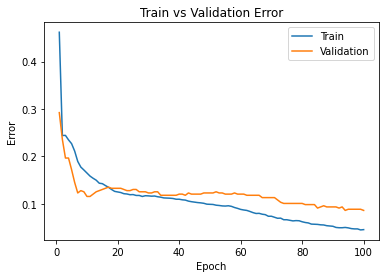

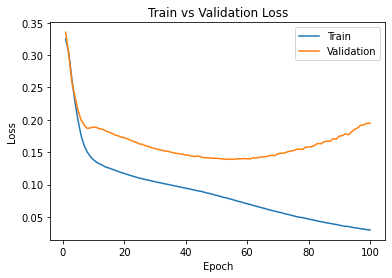

Parameters used in this run: 
[16.617346938775512, 0.6299806576402321, 2.837108013937282]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_5
Total time elapsed: 720.63 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_5_bs64_lr0.0001_epoch81, its val_error is 0.07616707616707617 and val_loss is 0.7369981301682336
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_5_bs64_lr0.0001_epoch90, its val_error is 0.07862407862407862 and val_loss is 0.7213340273925236


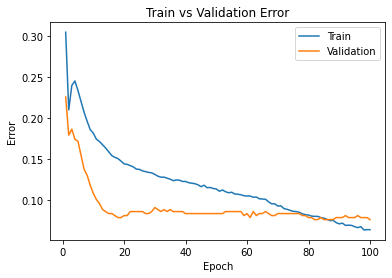

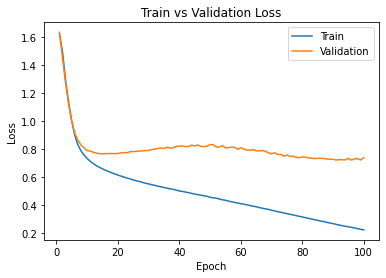

Parameters used in this run: 
[39.881632653061224, 1.511953578336557, 6.809059233449477]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 0: 13, 2: 71}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_1_2
Total time elapsed: 734.33 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_1_2_bs64_lr0.0001_epoch94, its val_error is 0.07125307125307126 and val_loss is 1.2288137674331665
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_1_2_bs64_lr0.0001_epoch91, its val_error is 0.07616707616707617 and val_loss is 1.1588321583611625


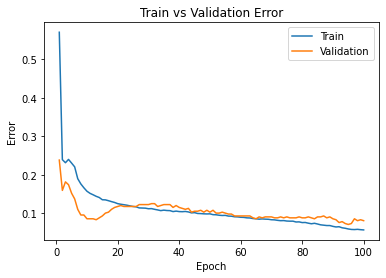

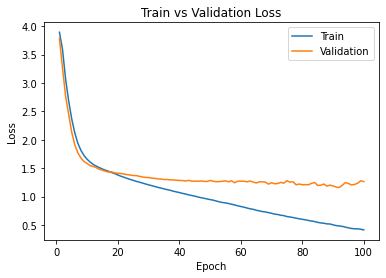

Parameters used in this run: 
[166.17346938775512, 6.299806576402321, 28.371080139372825]
There are 3257 training images, and the corresponding data distribution is: 
{2: 574, 1: 2585, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_5
Total time elapsed: 744.19 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_5_bs64_lr0.0001_epoch99, its val_error is 0.05896805896805897 and val_loss is 6.084918192454746
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_5_bs64_lr0.0001_epoch57, its val_error is 0.11056511056511056 and val_loss is 4.485033546175275


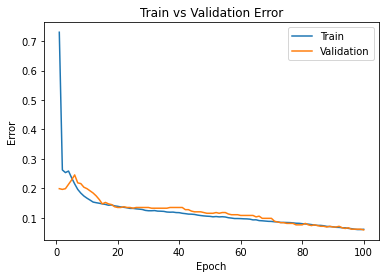

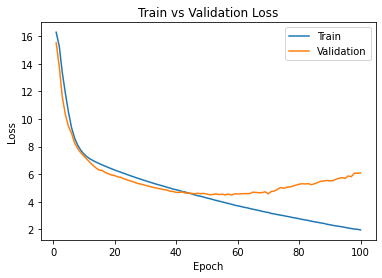

Parameters used in this run: 
[332.34693877551024, 12.599613152804642, 56.74216027874565]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_10
Total time elapsed: 786.83 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_10_bs64_lr0.0001_epoch15, its val_error is 0.06388206388206388 and val_loss is 12.654241800308228
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_10_bs64_lr0.0001_epoch32, its val_error is 0.07616707616707617 and val_loss is 12.139013733182635


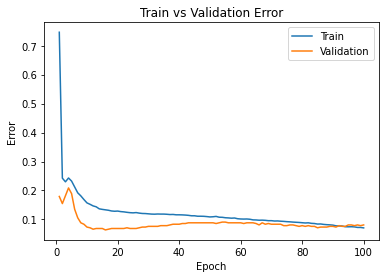

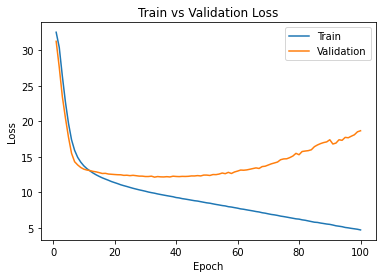

In [ ]:
# Weighted CE (Weight = Linearly scaled k>0)
count = [98.0,2585.0,574.0]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

K = [0.1, 0.5, 1.2, 5, 10]
weights_linearly_scaled = []
for k in K:
  temp = []
  for i in weights_frequency:
    temp.append(k/i)
  k_name = str(k).replace(".","_")
  name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_" + k_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

Parameters used in this run: 
[2.8104471460457163, -0.46206616222624125, 1.0427852283967218]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_0_5
Total time elapsed: 799.51 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_0_5_bs64_lr0.0001_epoch0, its val_error is 0.8255528255528255 and val_loss is -1.3703923566000802
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_0_5_bs64_lr0.0001_epoch0, its val_error is 0.8255528255528255 and val_loss is -1.3703923566000802


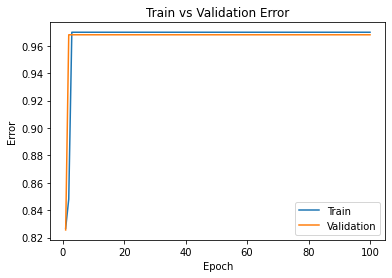

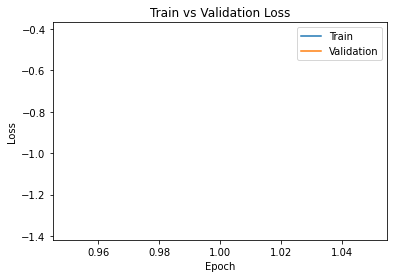

Parameters used in this run: 
[3.5035943266056617, 0.23108101833370404, 1.735932408956667]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_1
Total time elapsed: 803.86 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_1_bs64_lr0.0001_epoch96, its val_error is 0.09828009828009827 and val_loss is 0.16930433149848664
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_1_bs64_lr0.0001_epoch74, its val_error is 0.11056511056511056 and val_loss is 0.16664643372808183


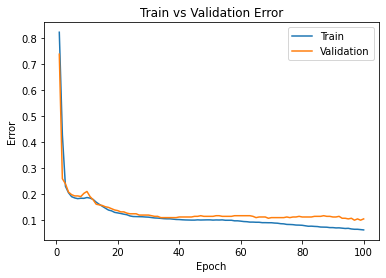

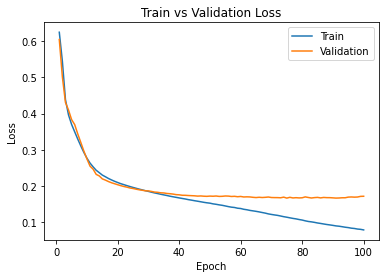

Parameters used in this run: 
[4.196741507165607, 0.9242281988936494, 2.429079589516612]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 0: 13, 2: 71}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_2
Total time elapsed: 820.19 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_2_bs64_lr0.0001_epoch6, its val_error is 0.05896805896805897 and val_loss is 0.47612843343189787
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_2_bs64_lr0.0001_epoch99, its val_error is 0.07862407862407862 and val_loss is 0.31338836571999956


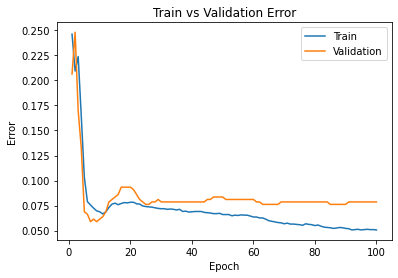

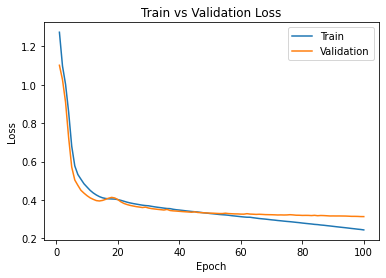

Parameters used in this run: 
[5.113032239039762, 1.8405189307678043, 3.3453703213907677]
There are 3257 training images, and the corresponding data distribution is: 
{2: 574, 1: 2585, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_5
Total time elapsed: 840.62 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_5_bs64_lr0.0001_epoch55, its val_error is 0.03931203931203931 and val_loss is 0.4134924794946398
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_5_bs64_lr0.0001_epoch98, its val_error is 0.04668304668304668 and val_loss is 0.3956126315253122


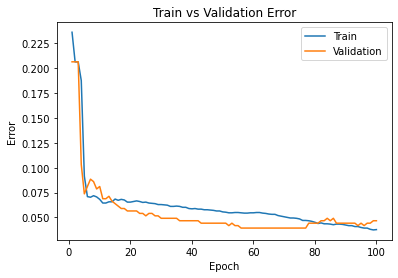

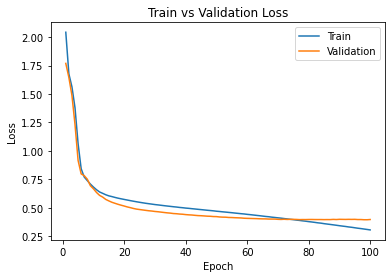

Parameters used in this run: 
[5.806179419599707, 2.5336661113277494, 4.038517501950713]
There are 3257 training images, and the corresponding data distribution is: 
{2: 574, 0: 98, 1: 2585}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_10
Total time elapsed: 846.77 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_10_bs64_lr0.0001_epoch94, its val_error is 0.03931203931203931 and val_loss is 0.6008261506046567
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_10_bs64_lr0.0001_epoch99, its val_error is 0.03931203931203931 and val_loss is 0.5951102546283177


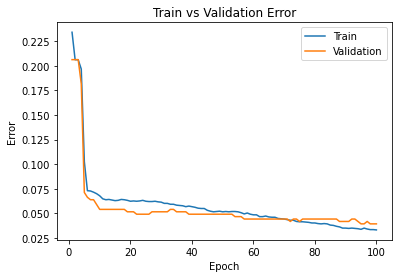

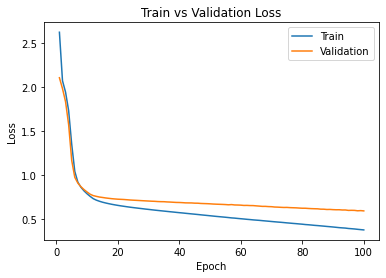

In [ ]:
# Weighted CE (Weight = logarithmic q>frequency)
count = [98.0,2585.0,574.0]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

Q = [0.5, 1, 2, 5, 10]
for q in Q:
  temp = []
  for i in weights_frequency:
    temp.append(math.log(q/i))
  q_name = str(q).replace(".","_")
  name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_" + q_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

Parameters used in this run: 
[9.999672081495216, 10.000000000000002, 10.000000000000002]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9
Total time elapsed: 995.06 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9_bs64_lr0.0001_epoch79, its val_error is 0.0687960687960688 and val_loss is 2.936018739427839
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9_bs64_lr0.0001_epoch18, its val_error is 0.07371007371007371 and val_loss is 2.0498722791671753


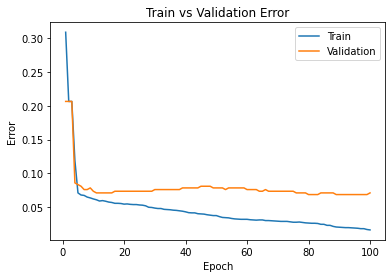

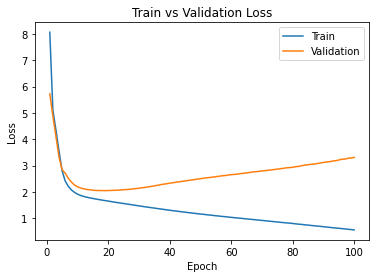

Parameters used in this run: 
[9.999672081495216, 10.000000000000002, 10.000000000000002]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9
Total time elapsed: 727.41 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9_bs64_lr0.0001_epoch89, its val_error is 0.051597051597051594 and val_loss is 1.4101169449942452
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9_bs64_lr0.0001_epoch98, its val_error is 0.051597051597051594 and val_loss is 1.3716040679386683


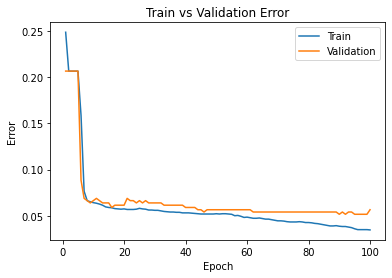

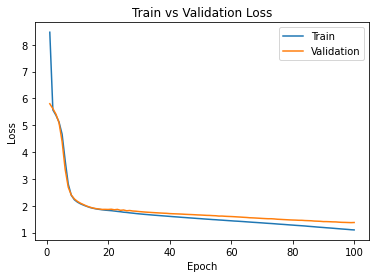

Parameters used in this run: 
[93.39555059192419, 924.7013718132304, 436.8938873785797]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_999
Total time elapsed: 692.91 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_999_bs64_lr0.0001_epoch16, its val_error is 0.051597051597051594 and val_loss is 61.48824078696115
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_999_bs64_lr0.0001_epoch98, its val_error is 0.05405405405405406 and val_loss is 46.559100832257954


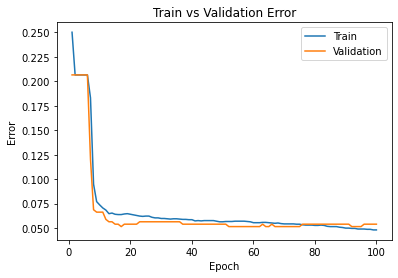

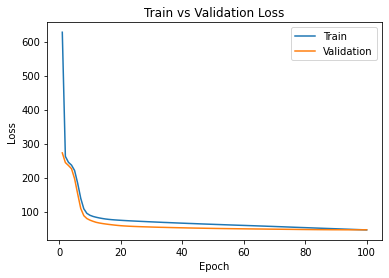

Parameters used in this run: 
[97.5262173545007, 2278.0095035347204, 557.8640278135886]
There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9999
Total time elapsed: 689.75 seconds
The best model based on validation err is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9999_bs64_lr0.0001_epoch38, its val_error is 0.051597051597051594 and val_loss is 102.59293256487165
The best model based on validation loss is model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9999_bs64_lr0.0001_epoch47, its val_error is 0.051597051597051594 and val_loss is 102.07731083461216


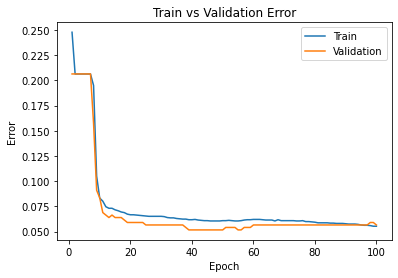

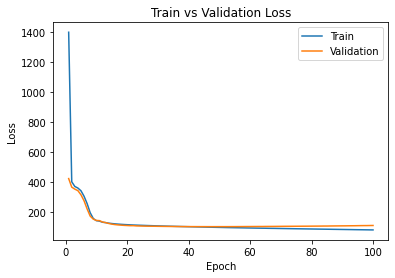

In [ ]:
# Weighted CE (Weight = Effective number of samples)
count = [98.0,2585.0,574.0]
Betas = [0.9,0.9,0.999,0.9999]
for b in Betas:
  temp = []
  for i in count:
    temp.append((1-b**i)/(1-b))
  b_name = str(b).replace(".","_")
  name = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_" + b_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0
Total time elapsed: 732.93 seconds
The best model based on validation err is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_bs64_lr0.0001_epoch28, its val_error is 0.05405405405405406 and val_loss is 0.21457527045692718
The best model based on validation loss is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_bs64_lr0.0001_epoch73, its val_error is 0.06142506142506143 and val_loss is 0.20045171678066254


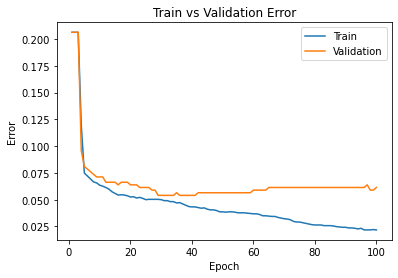

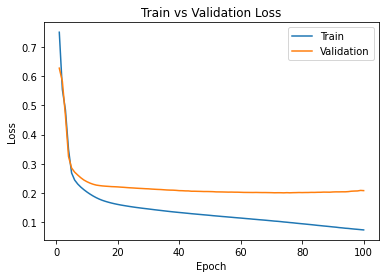

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5
Total time elapsed: 737.87 seconds
The best model based on validation err is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5_bs64_lr0.0001_epoch6, its val_error is 0.07862407862407862 and val_loss is 0.06848793104290962
The best model based on validation loss is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5_bs64_lr0.0001_epoch6, its val_error is 0.07862407862407862 and val_loss is 0.06848793104290962


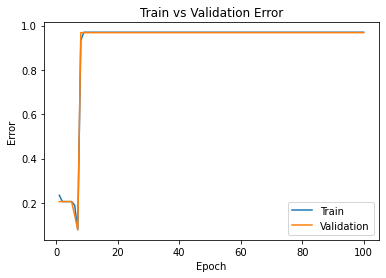

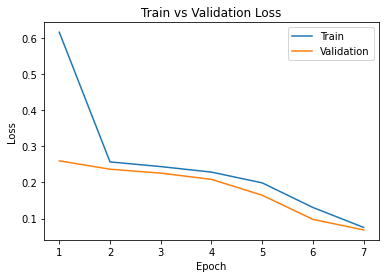

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 0: 13, 2: 71}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1
Total time elapsed: 785.94 seconds
The best model based on validation err is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1_bs64_lr0.0001_epoch74, its val_error is 0.04176904176904177 and val_loss is 0.009359776458170797
The best model based on validation loss is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1_bs64_lr0.0001_epoch99, its val_error is 0.04668304668304668 and val_loss is 0.008048807926700517


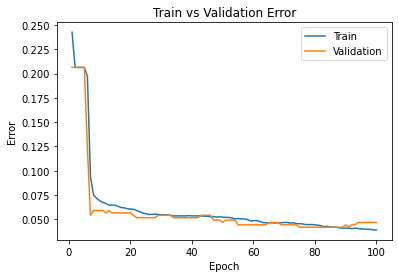

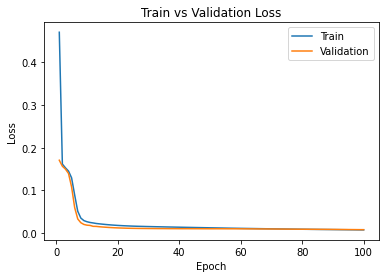

There are 3257 training images, and the corresponding data distribution is: 
{2: 574, 1: 2585, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2
Total time elapsed: 824.68 seconds
The best model based on validation err is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2_bs64_lr0.0001_epoch57, its val_error is 0.044226044226044224 and val_loss is 0.005525484980483141
The best model based on validation loss is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2_bs64_lr0.0001_epoch90, its val_error is 0.04668304668304668 and val_loss is 0.005112576464723263


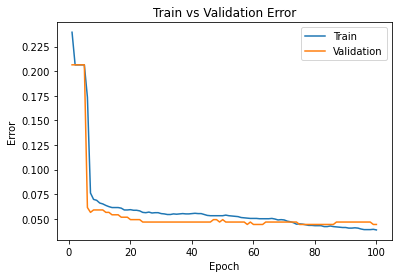

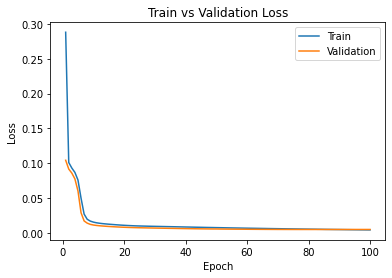

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5
Total time elapsed: 853.05 seconds
The best model based on validation err is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5_bs64_lr0.0001_epoch82, its val_error is 0.03931203931203931 and val_loss is 0.0029912134554511533
The best model based on validation loss is model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5_bs64_lr0.0001_epoch99, its val_error is 0.044226044226044224 and val_loss is 0.0028560697002311436


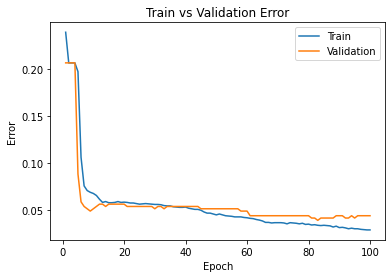

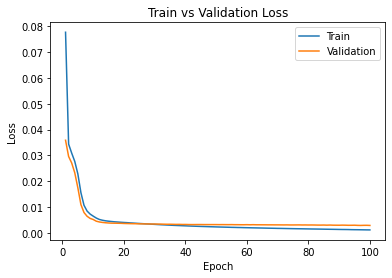

In [ ]:
# FocalLoss
gamma_list = [0, 0.5, 1, 2, 5]
for g in gamma_list:
  g_name = str(g).replace(".","_")
  name = "Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_" + g_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = FocalLoss_IMP(gamma = g)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_SparseMax_IMP
Total time elapsed: 1065.72 seconds
The best model based on validation err is model_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch75, its val_error is 0.044226044226044224 and val_loss is 0.05050113903624671
The best model based on validation loss is model_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch26, its val_error is 0.06388206388206388 and val_loss is 0.045065135029809814


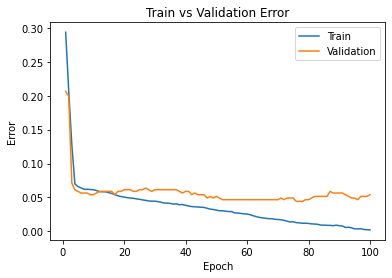

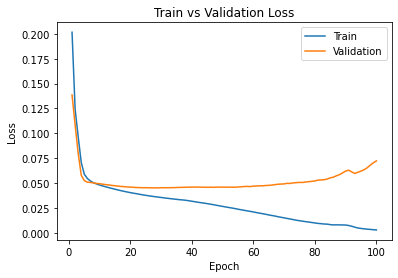

In [ ]:
# SparseMax Loss
model_name = "Loss_Function_Evaluation_SparseMax_IMP"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5()
lenet.cuda()
loss_function = Sparsemax_Loss_IMP()
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1
Total time elapsed: 580.25 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1_bs64_lr0.0001_epoch13, its val_error is 0.06633906633906633 and val_loss is 0.23358310971941268
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1_bs64_lr0.0001_epoch21, its val_error is 0.0687960687960688 and val_loss is 0.21593680658510753


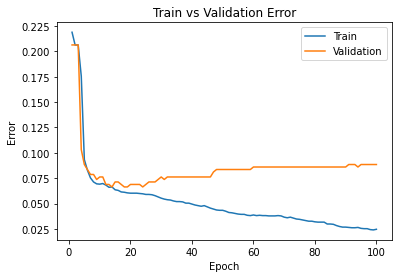

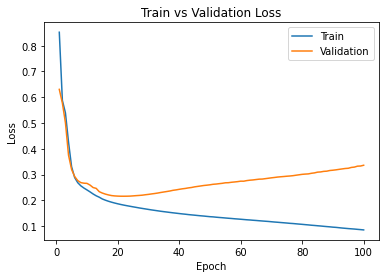

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5
Total time elapsed: 541.69 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5_bs64_lr0.0001_epoch61, its val_error is 0.05405405405405406 and val_loss is 0.18787856506449835
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5_bs64_lr0.0001_epoch99, its val_error is 0.05405405405405406 and val_loss is 0.16963559176240647


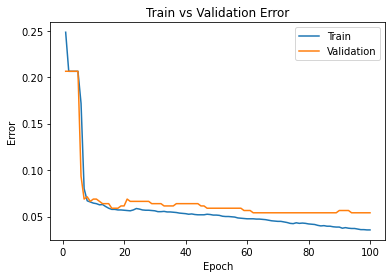

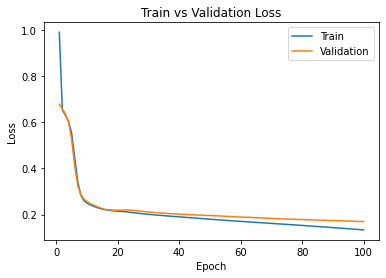

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1
Total time elapsed: 551.72 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1_bs64_lr0.0001_epoch31, its val_error is 0.05405405405405406 and val_loss is 0.22742010014397757
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1_bs64_lr0.0001_epoch99, its val_error is 0.05896805896805897 and val_loss is 0.21368702527667796


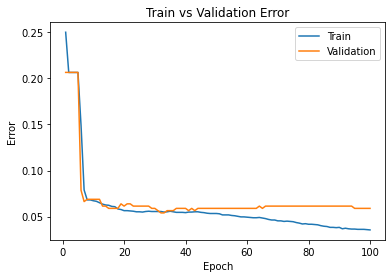

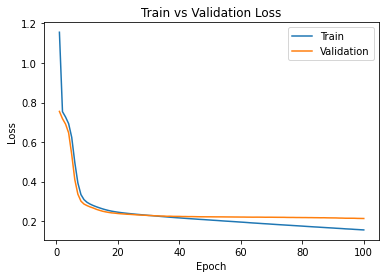

In [ ]:
# LDAM - Normalized
count = [98.0,2585.0,574.0]
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  name = "Loss_Function_Evaluation_LDAM_IMP_Normalized_C_" + c_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=True)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{2: 71, 1: 323, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1
Total time elapsed: 583.39 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1_bs64_lr0.0001_epoch23, its val_error is 0.044226044226044224 and val_loss is 0.18094913448606217
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1_bs64_lr0.0001_epoch94, its val_error is 0.044226044226044224 and val_loss is 0.15983615017363004


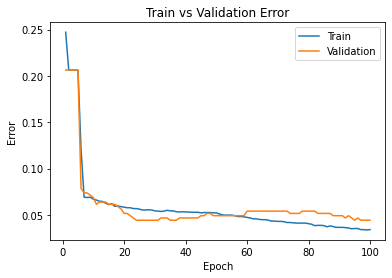

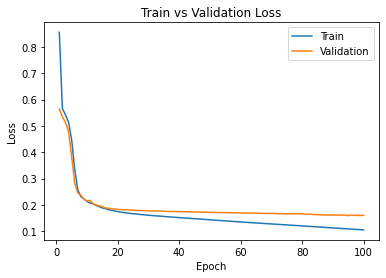

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 0: 98, 2: 574}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{2: 72, 1: 324, 0: 12}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5
Total time elapsed: 614.39 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5_bs64_lr0.0001_epoch81, its val_error is 0.05405405405405406 and val_loss is 0.1919861835028444
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5_bs64_lr0.0001_epoch99, its val_error is 0.05405405405405406 and val_loss is 0.187435439654759


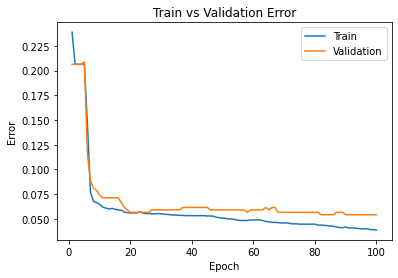

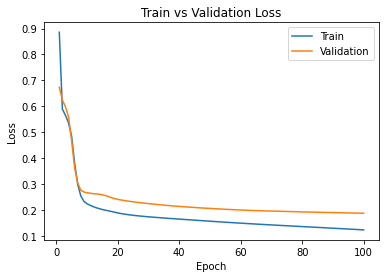

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 0: 12, 2: 72}
Finished Training: Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1
Total time elapsed: 595.05 seconds
The best model based on validation err is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1_bs64_lr0.0001_epoch60, its val_error is 0.05405405405405406 and val_loss is 0.24355581189904893
The best model based on validation loss is model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1_bs64_lr0.0001_epoch99, its val_error is 0.05896805896805897 and val_loss is 0.23372400658471243


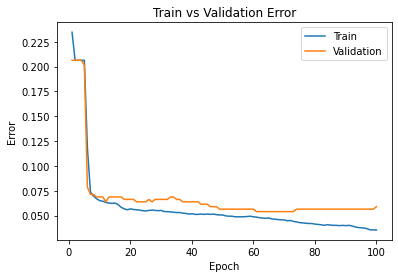

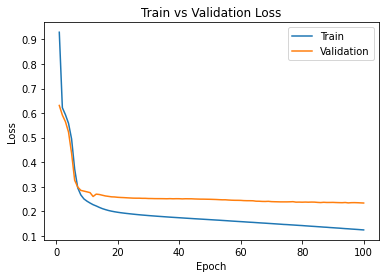

In [ ]:
# LDAM - non_normalized
count = [98.0,2585.0,574.0]
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  name = "Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_" + c_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5()
  lenet.cuda()
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=False)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False)

 ## Loss Function Evaluation (Final Performance - Error Rate, Acc, Confusion Matrix,Precision, Recall and F1-Score,Training Time)

In [ ]:
def Show_Specific_Training_Curve(file_name_path,loss_name):
  train_err = np.loadtxt("/content/drive/My Drive/MIE424 Final Project/model_output/{}_train_err.csv".format(file_name_path))
  val_err = np.loadtxt("/content/drive/My Drive/MIE424 Final Project/model_output/{}_val_err.csv".format(file_name_path))
  train_loss = np.loadtxt("/content/drive/My Drive/MIE424 Final Project/model_output/{}_train_loss.csv".format(file_name_path))
  val_loss = np.loadtxt("/content/drive/My Drive/MIE424 Final Project/model_output/{}_val_loss.csv".format(file_name_path))
  error_graph_title = "Train vs Validation Error ({})".format(loss_name)
  plt.title(error_graph_title)
  n = len(train_err) # number of epochs
  plt.plot(range(1,n+1), train_err, label="Train")
  plt.plot(range(1,n+1), val_err, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Error")
  plt.legend(loc='best')
  plt.show()
  loss_graph_title = "Train vs Validation Loss ({})".format(loss_name)
  plt.title(loss_graph_title)
  plt.plot(range(1,n+1), train_loss, label="Train")
  plt.plot(range(1,n+1), val_loss, label="Validation")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.show()

# Plot Confusion Matrix
# Ref https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
def Plot_Confusion_Matrix(final_model, test_loader,loss_name,using_cifar = False):
  pred_list = []
  actual_list = []

  for i, data in enumerate(test_loader, 0):
    inputs, labels = data
    # labels = normalize_label(labels)
    inputs = inputs.cuda()
    labels = labels.cuda()
    outputs = final_model(inputs)

    _, predicted = torch.max(outputs.data, 1)
    pred_list = pred_list + predicted.tolist()
    actual_list = actual_list + labels.tolist()

  # print(pred_list)
  # print(len(pred_list))
  # print(actual_list)
  # print(len(actual_list))

  if using_cifar:
    y_pred = pred_list
    y_act = actual_list
    print(metrics.confusion_matrix(y_act, y_pred))
    print(metrics.classification_report(y_act, y_pred))
    array = metrics.confusion_matrix(y_act, y_pred, labels=[9,8,7,6,5,4,3,2,1,0])

    df_cm = pd.DataFrame(array, range(10), range(10))
    plt.figure(figsize=(10,7))
    confusion_matrix_title = "Confusion Matrix ({})".format(loss_name)
    plt.title(confusion_matrix_title)
    sn.set(font_scale=1.4) # for label size
    df_cm = pd.DataFrame(array, index=[9,8,7,6,5,4,3,2,1,0], columns=[9,8,7,6,5,4,3,2,1,0])
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 12}, cmap="YlGnBu",fmt='d')

    plt.show()
  else:
    y_pred = pred_list
    y_act = actual_list
    print(metrics.confusion_matrix(y_act, y_pred))
    print(metrics.classification_report(y_act, y_pred))
    array = metrics.confusion_matrix(y_act, y_pred, labels=[2, 1, 0])
    # 0:'mask incorrectly',1:'mask',2:'no mask'

    df_cm = pd.DataFrame(array, range(3), range(3))
    plt.figure(figsize=(10,7))
    confusion_matrix_title = "Confusion Matrix ({})".format(loss_name)
    plt.title(confusion_matrix_title)
    sn.set(font_scale=1.4) # for label size
    df_cm = pd.DataFrame(array, index=["no mask","mask", "mask incorrectly"], columns=["no mask","mask", "mask incorrectly"])
    sn.heatmap(df_cm, annot=True, annot_kws={"size": 12}, cmap="YlGnBu",fmt='d')

    plt.show()

def Print_Loss_Function_Evaluation(loss_name, loss_function,test_loader, graph_path, model_path, using_cifar = False):
  if using_cifar:
    final_model = LeNet5(num_class=10)
  else:
    final_model = LeNet5()
  m_p = "/content/drive/My Drive/MIE424 Final Project/model_output/"+model_path
  final_model.load_state_dict(torch.load(m_p))
  final_model.cuda()

  final_model_test_err, final_model_test_loss = evaluate(final_model, test_loader, loss_function.cuda())
  print("The testing error of the model trained using {} is: {}".format(loss_name,final_model_test_err))
  print("The testing loss of the model trained using {} is: {}".format(loss_name,final_model_test_loss))

  Show_Specific_Training_Curve(file_name_path=graph_path,loss_name=loss_name)
  Plot_Confusion_Matrix(final_model=final_model, test_loader=test_loader, loss_name = loss_name,using_cifar=using_cifar)

In [ ]:
train_loader, val_loader, test_loader = get_data_loader(batch_size=64)

There are 3257 training images, and the corresponding data distribution is: 
{1: 2585, 2: 574, 0: 98}
There are 407 validation images, and the corresponding data distribution is: 
{1: 323, 2: 71, 0: 13}
There are 408 test images, and the corresponding data distribution is: 
{1: 324, 2: 72, 0: 12}


The testing error of the model trained using CE is: 0.03431372549019608
The testing loss of the model trained using CE is: 0.12584170113716805


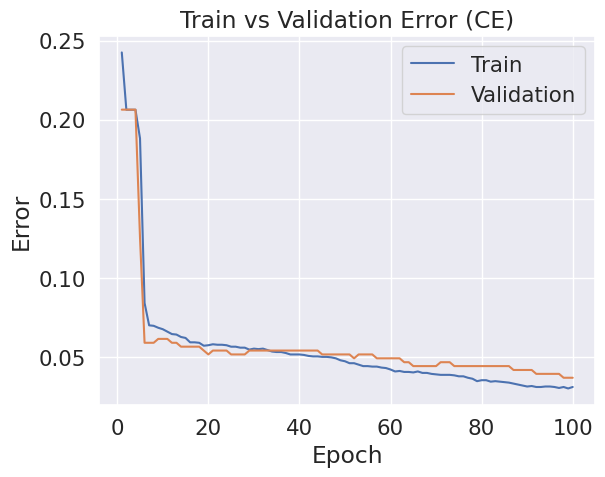

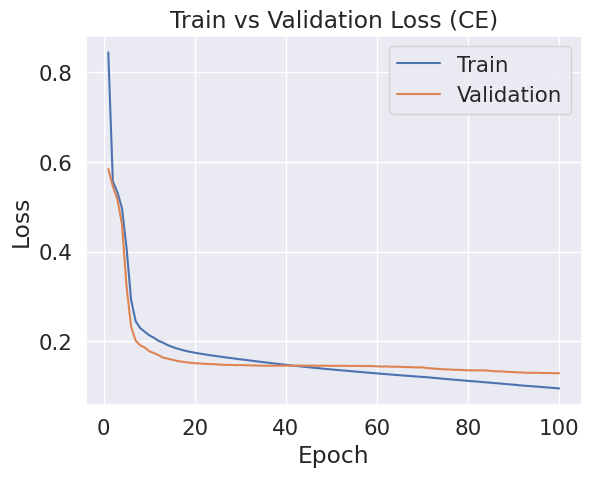

[[  5   5   2]
 [  1 318   5]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       0.83      0.42      0.56        12
           1       0.98      0.98      0.98       324
           2       0.91      0.99      0.95        72

    accuracy                           0.97       408
   macro avg       0.91      0.79      0.83       408
weighted avg       0.96      0.97      0.96       408



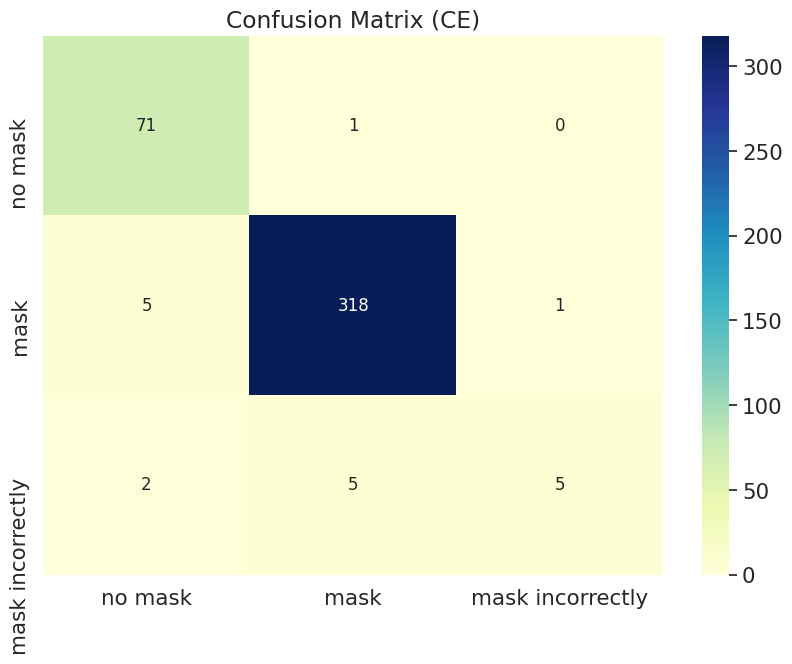

In [ ]:
# CE Evaluation
loss_name = "CE"
loss_function = CrossEntropyLoss_IMP()
graph_path = "model_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch99"
model_path = "Loss_Function_Evaluation_CrossEntropyLoss_IMPbest_val_err"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using W_CE (Weight = Frequency) is: 0.056372549019607844
The testing loss of the model trained using W_CE (Weight = Frequency) is: 0.022067843271153315


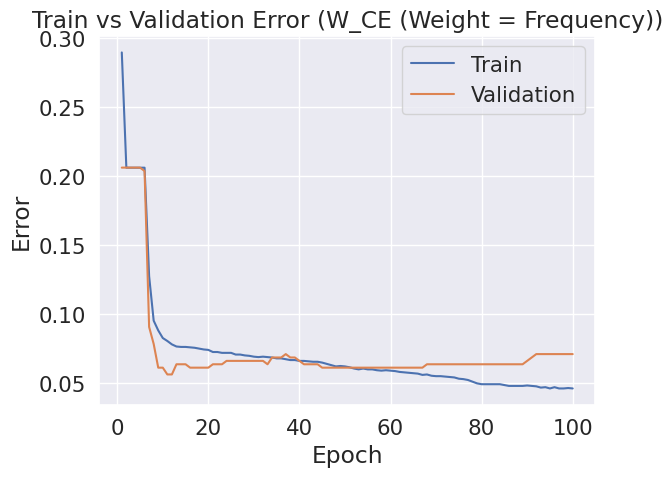

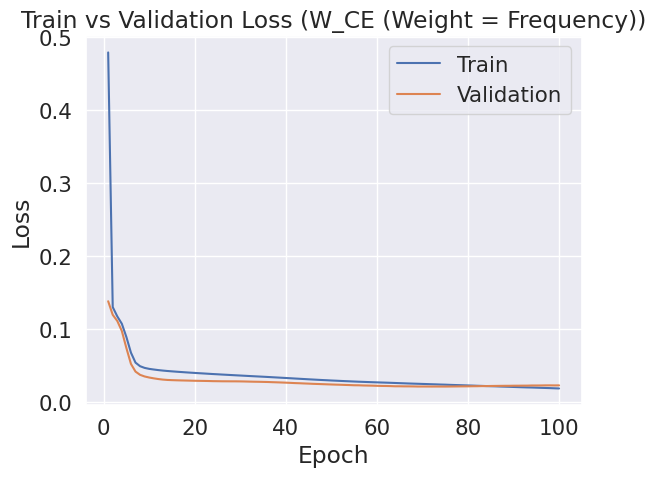

[[  0  11   1]
 [  0 324   0]
 [  0  11  61]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.94      1.00      0.97       324
           2       0.98      0.85      0.91        72

    accuracy                           0.94       408
   macro avg       0.64      0.62      0.63       408
weighted avg       0.92      0.94      0.93       408



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


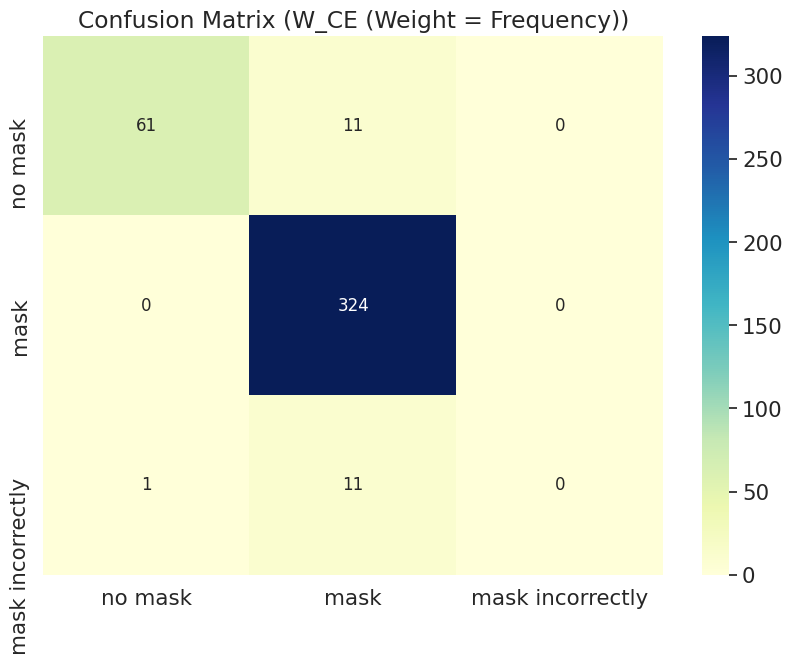

The testing error of the model trained using W_CE (Weight = Inverse class frequency) is: 0.11764705882352941
The testing loss of the model trained using W_CE (Weight = Inverse class frequency) is: 1.4259812065533228


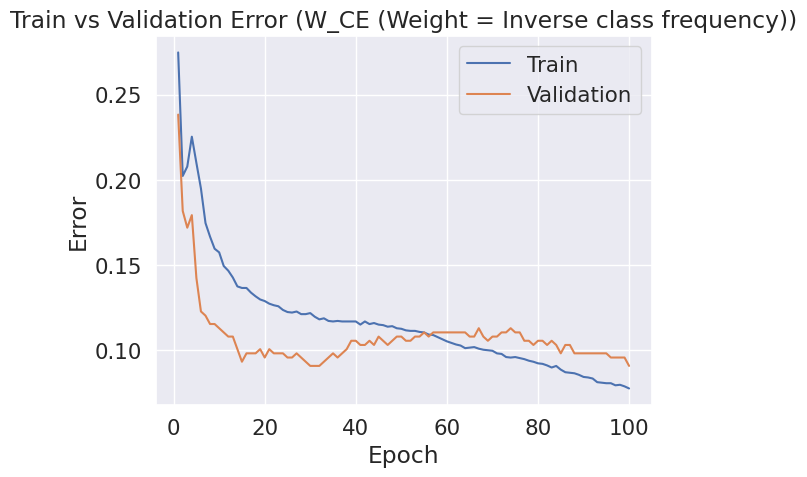

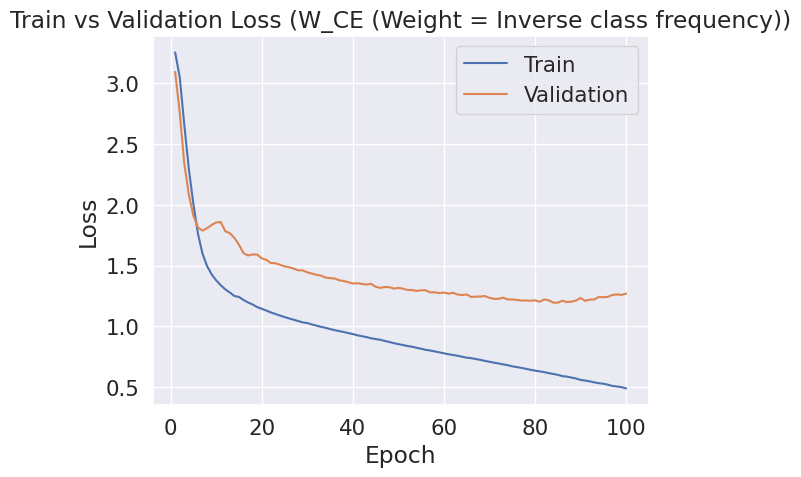

[[ 11   1   0]
 [ 32 285   7]
 [  7   1  64]]
              precision    recall  f1-score   support

           0       0.22      0.92      0.35        12
           1       0.99      0.88      0.93       324
           2       0.90      0.89      0.90        72

    accuracy                           0.88       408
   macro avg       0.70      0.90      0.73       408
weighted avg       0.95      0.88      0.91       408



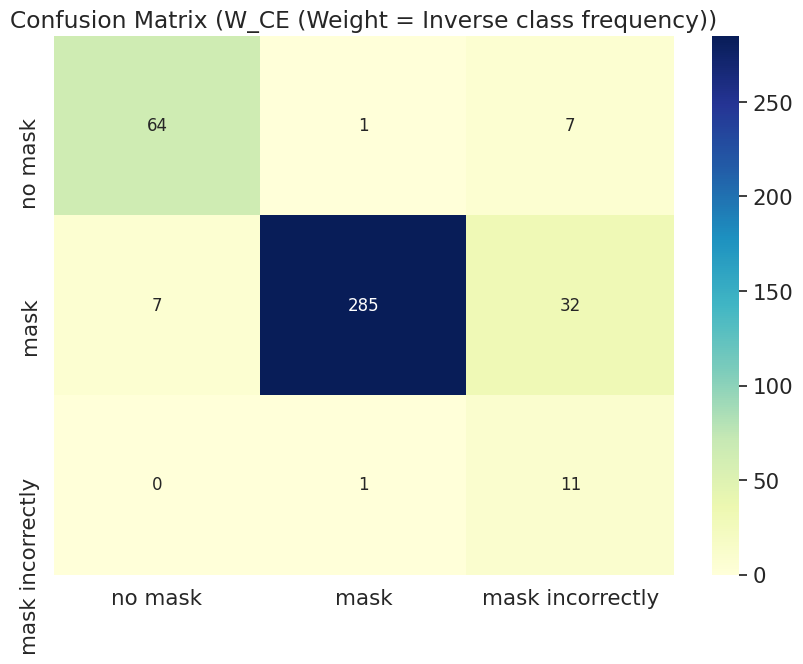

In [ ]:
# Weighted CE (Weight = Frequency) Evaluation
loss_name = "W_CE (Weight = Frequency)"
loss_function = Weighted_CrossEntropyLoss_IMP(weights=[98.0/3257.0,2585.0/3257.0,574.0/3257.0])
graph_path = "model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency_bs64_lr0.0001_epoch99"
model_path = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequencybest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

# Weighted CE (Weight = Inverse class frequency) Evaluation
loss_name = "W_CE (Weight = Inverse class frequency)"
loss_function = Weighted_CrossEntropyLoss_IMP(weights=[3257.0/98.0,3257.0/2585.0,3257.0/574.0])
graph_path = "model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency_bs64_lr0.0001_epoch99"
model_path = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequencybest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using W_CE (Weight = Linearly scaled; k = 0_1) is: 0.09068627450980392
The testing loss of the model trained using W_CE (Weight = Linearly scaled; k = 0_1) is: 0.14123766869306564


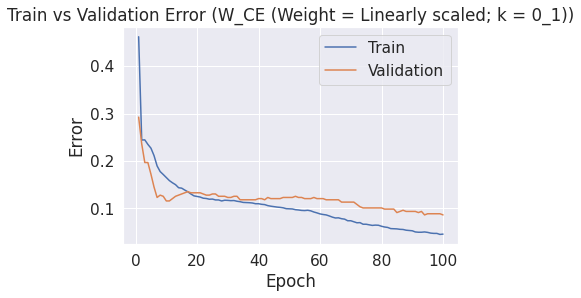

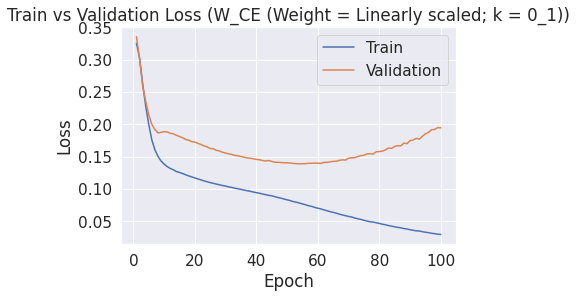

[[ 10   1   1]
 [ 14 291  19]
 [  1   1  70]]
              precision    recall  f1-score   support

           0       0.40      0.83      0.54        12
           1       0.99      0.90      0.94       324
           2       0.78      0.97      0.86        72

    accuracy                           0.91       408
   macro avg       0.72      0.90      0.78       408
weighted avg       0.94      0.91      0.92       408



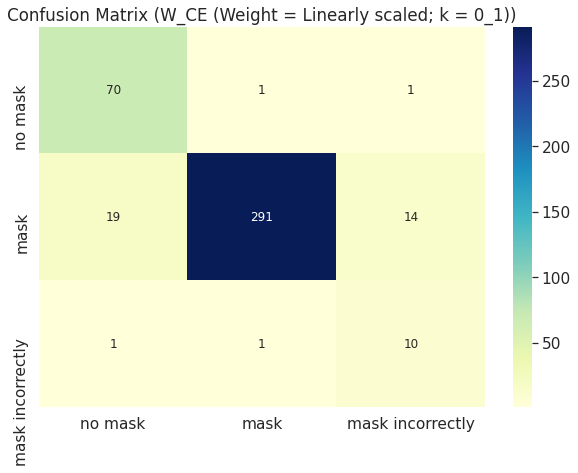

The testing error of the model trained using W_CE (Weight = Linearly scaled; k = 0_5) is: 0.07107843137254902
The testing loss of the model trained using W_CE (Weight = Linearly scaled; k = 0_5) is: 0.3399696445890835


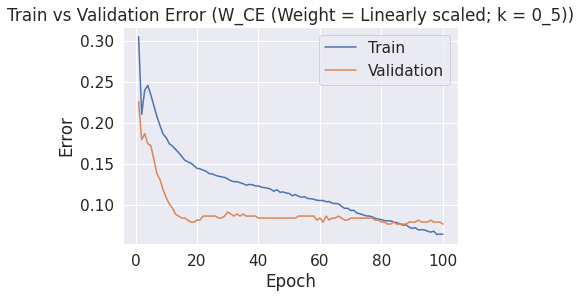

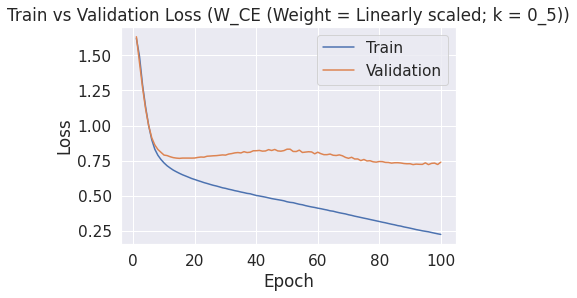

[[  9   1   2]
 [  8 299  17]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       0.53      0.75      0.62        12
           1       0.99      0.92      0.96       324
           2       0.79      0.99      0.88        72

    accuracy                           0.93       408
   macro avg       0.77      0.89      0.82       408
weighted avg       0.94      0.93      0.93       408



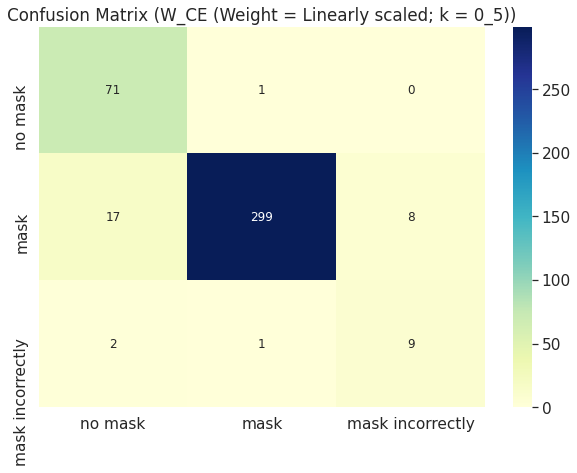

The testing error of the model trained using W_CE (Weight = Linearly scaled; k = 1_2) is: 0.06862745098039216
The testing loss of the model trained using W_CE (Weight = Linearly scaled; k = 1_2) is: 2.2436194717884064


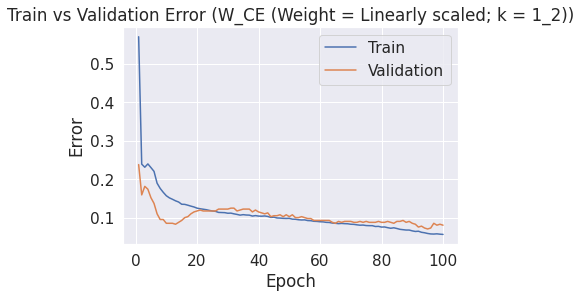

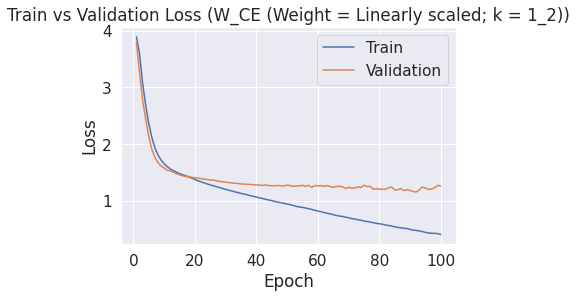

[[  9   1   2]
 [ 13 299  12]
 [  0   0  72]]
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        12
           1       1.00      0.92      0.96       324
           2       0.84      1.00      0.91        72

    accuracy                           0.93       408
   macro avg       0.75      0.89      0.80       408
weighted avg       0.95      0.93      0.94       408



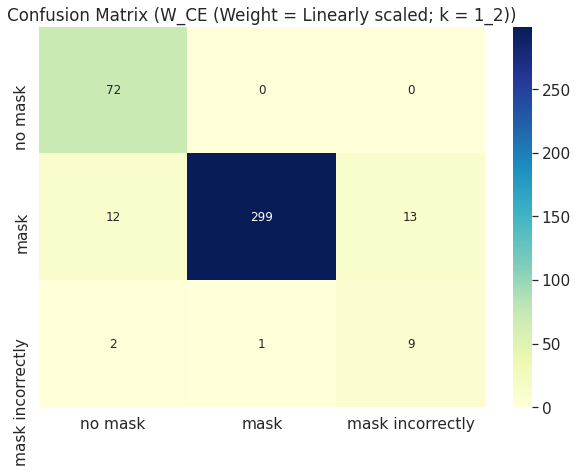

The testing error of the model trained using W_CE (Weight = Linearly scaled; k = 5) is: 0.0857843137254902
The testing loss of the model trained using W_CE (Weight = Linearly scaled; k = 5) is: 4.054709604808262


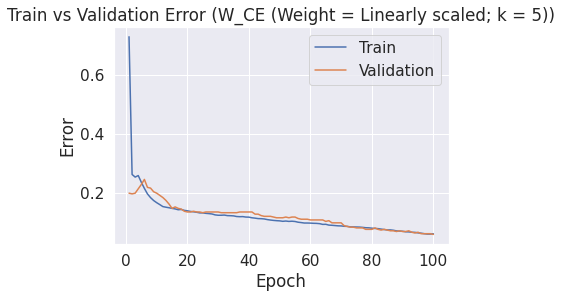

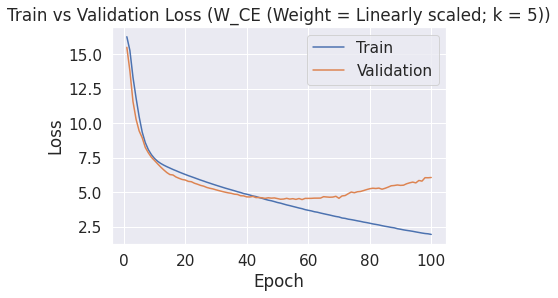

[[ 10   1   1]
 [ 13 294  17]
 [  2   1  69]]
              precision    recall  f1-score   support

           0       0.40      0.83      0.54        12
           1       0.99      0.91      0.95       324
           2       0.79      0.96      0.87        72

    accuracy                           0.91       408
   macro avg       0.73      0.90      0.79       408
weighted avg       0.94      0.91      0.92       408



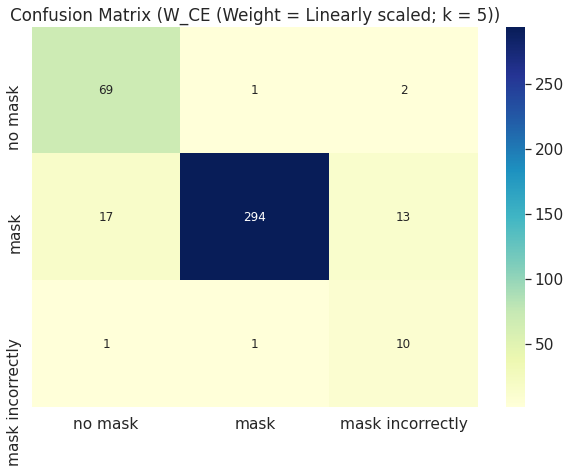

The testing error of the model trained using W_CE (Weight = Linearly scaled; k = 10) is: 0.09558823529411764
The testing loss of the model trained using W_CE (Weight = Linearly scaled; k = 10) is: 14.990415164402553


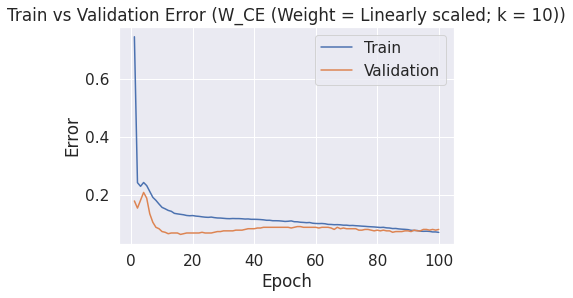

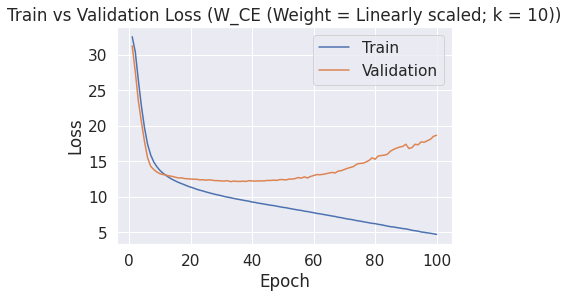

[[  8   2   2]
 [ 12 292  20]
 [  2   1  69]]
              precision    recall  f1-score   support

           0       0.36      0.67      0.47        12
           1       0.99      0.90      0.94       324
           2       0.76      0.96      0.85        72

    accuracy                           0.90       408
   macro avg       0.70      0.84      0.75       408
weighted avg       0.93      0.90      0.91       408



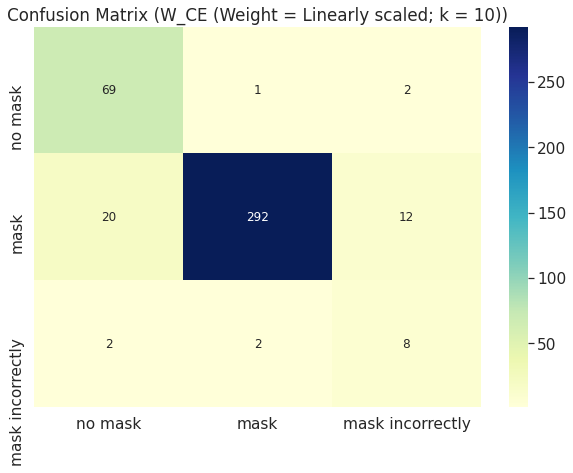

In [ ]:
# Weighted CE (Weight = Linearly scaled k>0) Evaluation
K = [0.1, 0.5, 1.2, 5, 10]

count = [98.0,2585.0,574.0]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

for k in K:
  temp = []
  for i in weights_frequency:
    temp.append(k/i)
  k_name = str(k).replace(".","_")
  loss_name = "W_CE (Weight = Linearly scaled; k = {})".format(k_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_{}_bs64_lr0.0001_epoch99".format(k_name)
  model_path = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_{}best_val_loss".format(k_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using W_CE (Weight = logarithmic; q = 1) is: 0.10784313725490197
The testing loss of the model trained using W_CE (Weight = logarithmic; q = 1) is: 0.12117343608822141


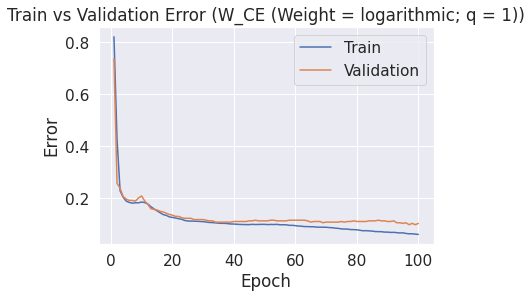

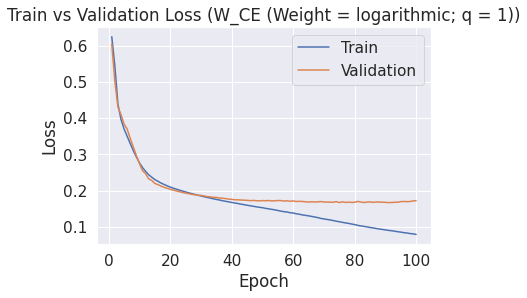

[[  9   1   2]
 [ 21 283  20]
 [  0   0  72]]
              precision    recall  f1-score   support

           0       0.30      0.75      0.43        12
           1       1.00      0.87      0.93       324
           2       0.77      1.00      0.87        72

    accuracy                           0.89       408
   macro avg       0.69      0.87      0.74       408
weighted avg       0.94      0.89      0.90       408



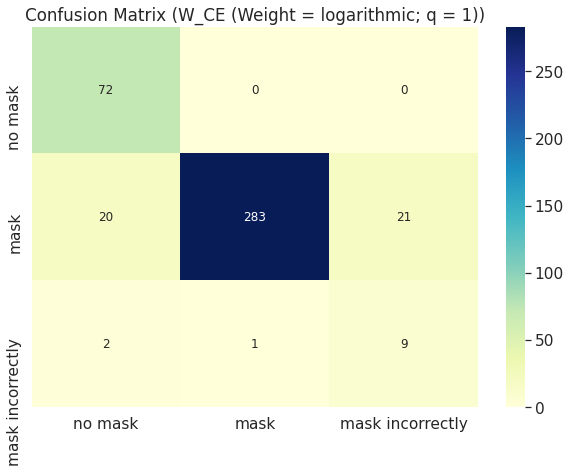

The testing error of the model trained using W_CE (Weight = logarithmic; q = 2) is: 0.0661764705882353
The testing loss of the model trained using W_CE (Weight = logarithmic; q = 2) is: 0.3050860528435026


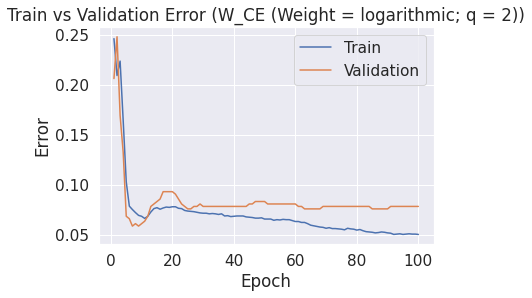

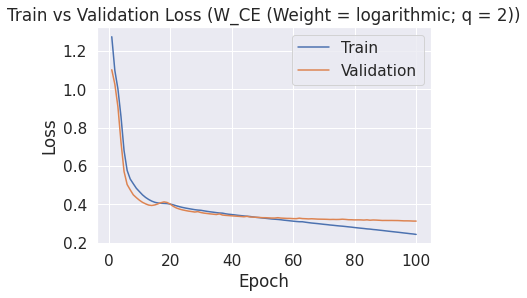

[[  9   1   2]
 [  8 303  13]
 [  2   1  69]]
              precision    recall  f1-score   support

           0       0.47      0.75      0.58        12
           1       0.99      0.94      0.96       324
           2       0.82      0.96      0.88        72

    accuracy                           0.93       408
   macro avg       0.76      0.88      0.81       408
weighted avg       0.95      0.93      0.94       408



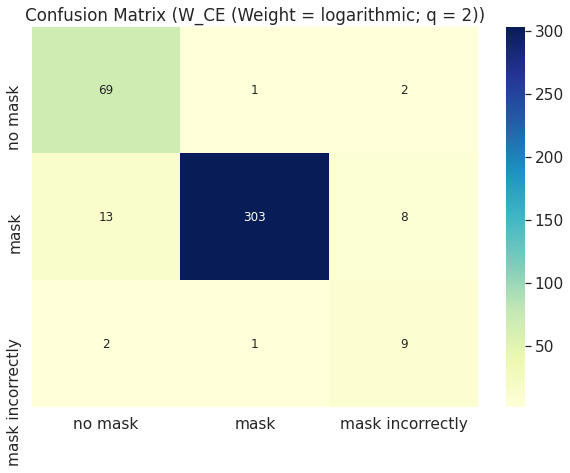

The testing error of the model trained using W_CE (Weight = logarithmic; q = 5) is: 0.0392156862745098
The testing loss of the model trained using W_CE (Weight = logarithmic; q = 5) is: 0.38364716299942564


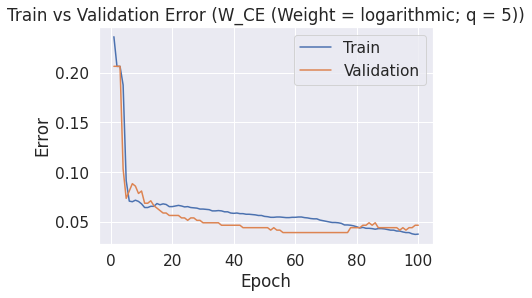

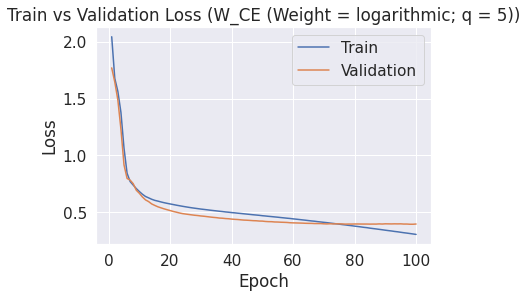

[[  9   1   2]
 [  5 313   6]
 [  0   2  70]]
              precision    recall  f1-score   support

           0       0.64      0.75      0.69        12
           1       0.99      0.97      0.98       324
           2       0.90      0.97      0.93        72

    accuracy                           0.96       408
   macro avg       0.84      0.90      0.87       408
weighted avg       0.96      0.96      0.96       408



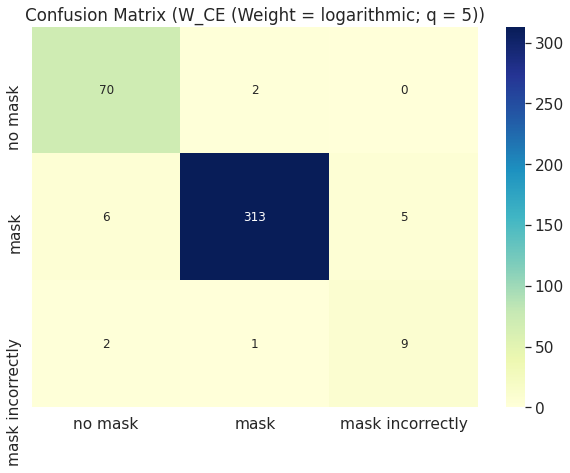

The testing error of the model trained using W_CE (Weight = logarithmic; q = 10) is: 0.03676470588235294
The testing loss of the model trained using W_CE (Weight = logarithmic; q = 10) is: 0.4849270284175873


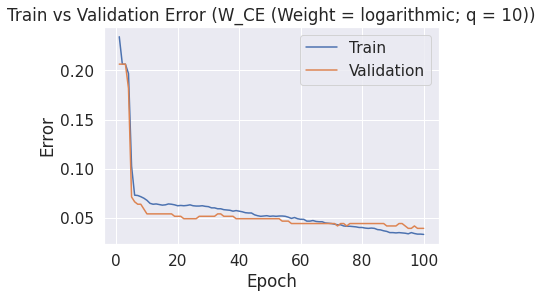

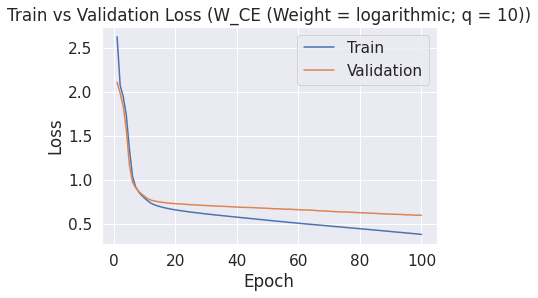

[[  7   3   2]
 [  4 315   5]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       0.64      0.58      0.61        12
           1       0.99      0.97      0.98       324
           2       0.91      0.99      0.95        72

    accuracy                           0.96       408
   macro avg       0.84      0.85      0.85       408
weighted avg       0.96      0.96      0.96       408



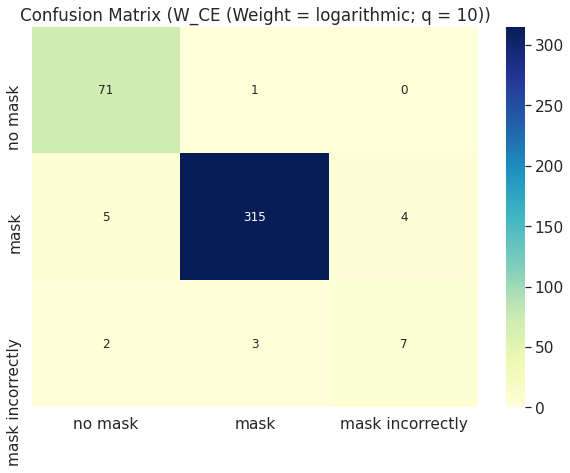

In [ ]:
# Weighted CE (Weight = logarithmic q>frequency) Evaluation
# Remove 0.5 here because the result is infeasible
Q = [1, 2, 5, 10]

count = [98.0,2585.0,574.0]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

for q in Q:
  temp = []
  for i in weights_frequency:
    temp.append(math.log(q/i))
  q_name = str(q).replace(".","_")
  loss_name = "W_CE (Weight = logarithmic; q = {})".format(q_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_{}_bs64_lr0.0001_epoch99".format(q_name)
  model_path = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_{}best_val_loss".format(q_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9) is: 0.04411764705882353
The testing loss of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9) is: 1.001044009413038


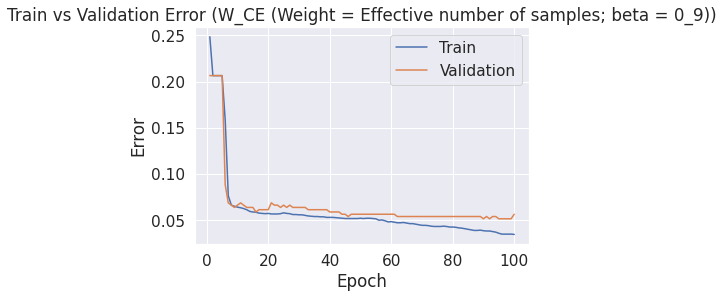

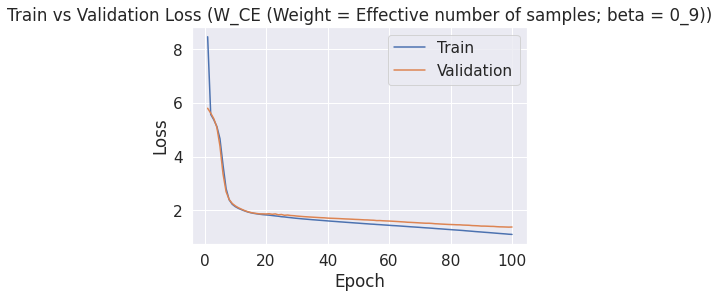

[[  8   3   1]
 [  1 313  10]
 [  2   1  69]]
              precision    recall  f1-score   support

           0       0.73      0.67      0.70        12
           1       0.99      0.97      0.98       324
           2       0.86      0.96      0.91        72

    accuracy                           0.96       408
   macro avg       0.86      0.86      0.86       408
weighted avg       0.96      0.96      0.96       408



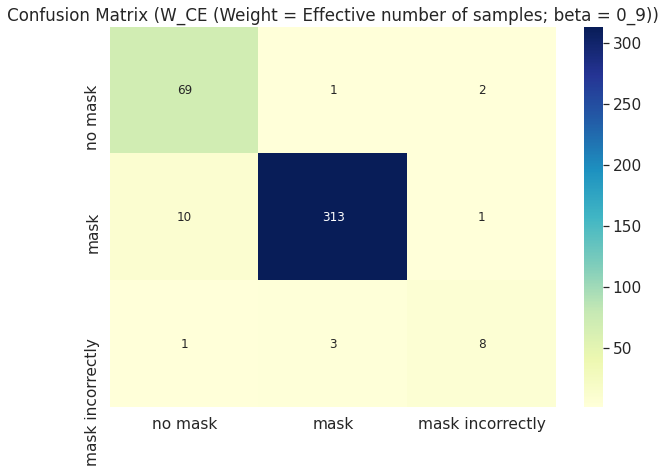

The testing error of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9) is: 0.04411764705882353
The testing loss of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9) is: 1.001044009413038


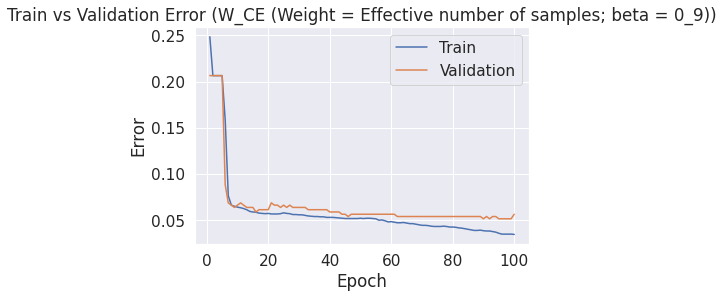

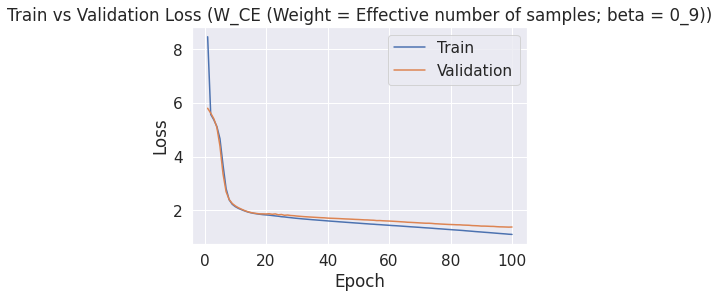

[[  8   3   1]
 [  1 313  10]
 [  2   1  69]]
              precision    recall  f1-score   support

           0       0.73      0.67      0.70        12
           1       0.99      0.97      0.98       324
           2       0.86      0.96      0.91        72

    accuracy                           0.96       408
   macro avg       0.86      0.86      0.86       408
weighted avg       0.96      0.96      0.96       408



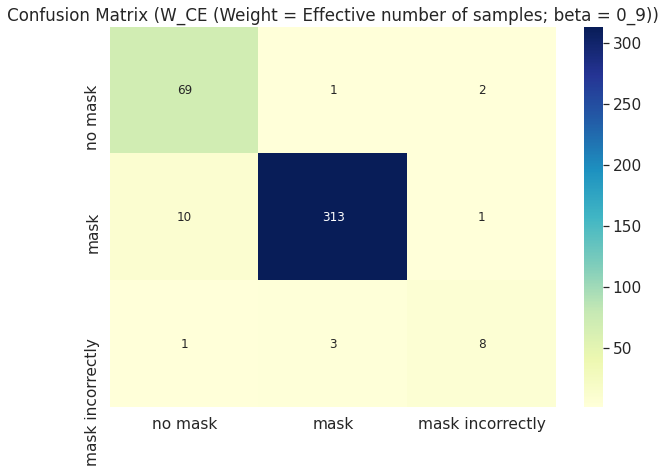

The testing error of the model trained using W_CE (Weight = Effective number of samples; beta = 0_999) is: 0.061274509803921566
The testing loss of the model trained using W_CE (Weight = Effective number of samples; beta = 0_999) is: 55.70670945303781


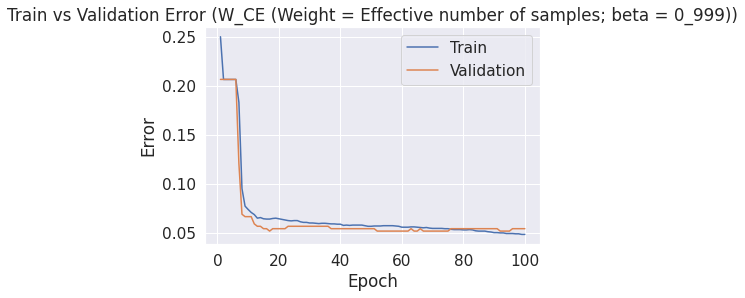

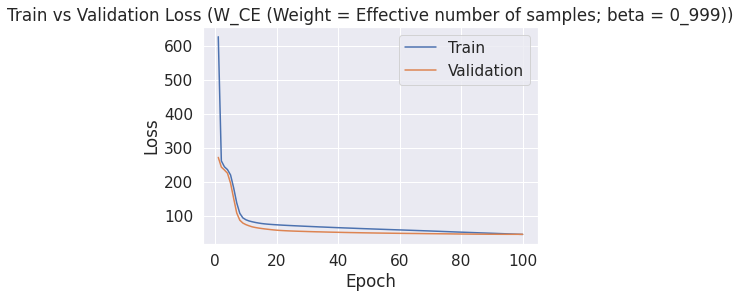

[[  1  10   1]
 [  0 321   3]
 [  0  11  61]]
              precision    recall  f1-score   support

           0       1.00      0.08      0.15        12
           1       0.94      0.99      0.96       324
           2       0.94      0.85      0.89        72

    accuracy                           0.94       408
   macro avg       0.96      0.64      0.67       408
weighted avg       0.94      0.94      0.93       408



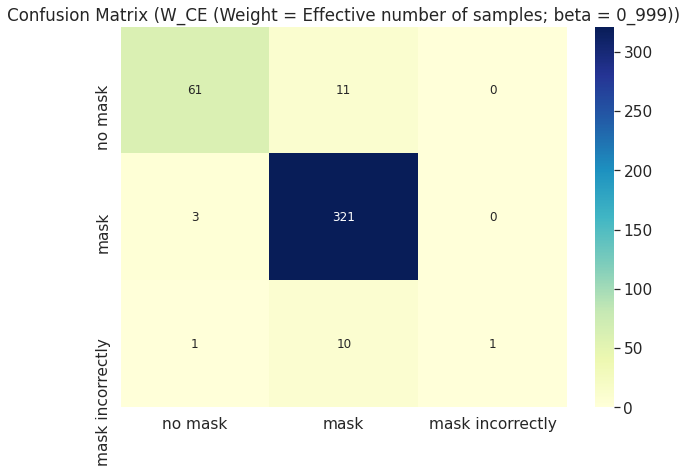

The testing error of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9999) is: 0.07352941176470588
The testing loss of the model trained using W_CE (Weight = Effective number of samples; beta = 0_9999) is: 121.16773169381278


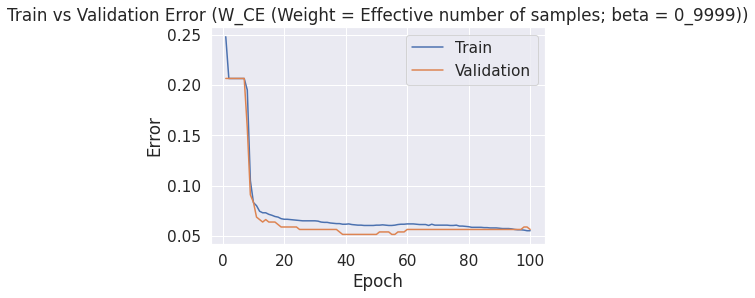

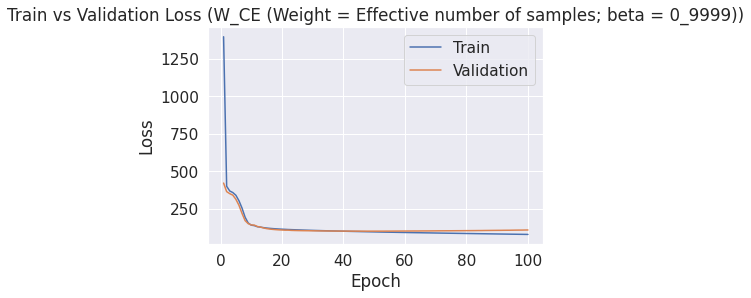

[[  0  11   1]
 [  0 322   2]
 [  0  16  56]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.92      0.99      0.96       324
           2       0.95      0.78      0.85        72

    accuracy                           0.93       408
   macro avg       0.62      0.59      0.60       408
weighted avg       0.90      0.93      0.91       408



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


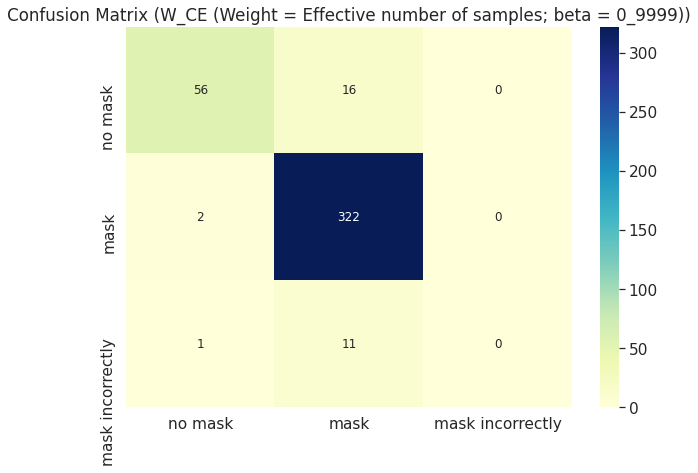

In [ ]:
# Weighted CE (Weight = Effective number of samples) Evaluation
Betas = [0.9,0.9,0.999,0.9999]
count = [98.0,2585.0,574.0]
for b in Betas:
  temp = []
  for i in count:
    temp.append((1-b**i)/(1-b))
  b_name = str(b).replace(".","_")
  loss_name = "W_CE (Weight = Effective number of samples; beta = {})".format(b_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_{}_bs64_lr0.0001_epoch99".format(b_name)
  model_path = "Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_{}best_val_loss".format(b_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using FocalLoss (gamma = 0) is: 0.03431372549019608
The testing loss of the model trained using FocalLoss (gamma = 0) is: 0.14052124534334456


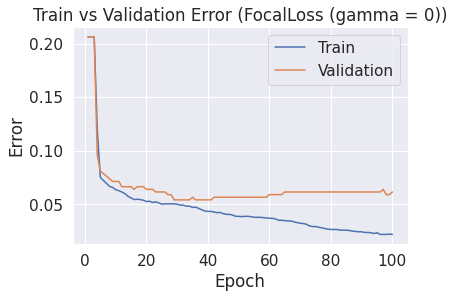

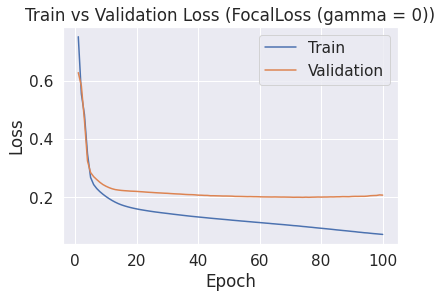

[[  4   6   2]
 [  0 319   5]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       1.00      0.33      0.50        12
           1       0.98      0.98      0.98       324
           2       0.91      0.99      0.95        72

    accuracy                           0.97       408
   macro avg       0.96      0.77      0.81       408
weighted avg       0.97      0.97      0.96       408



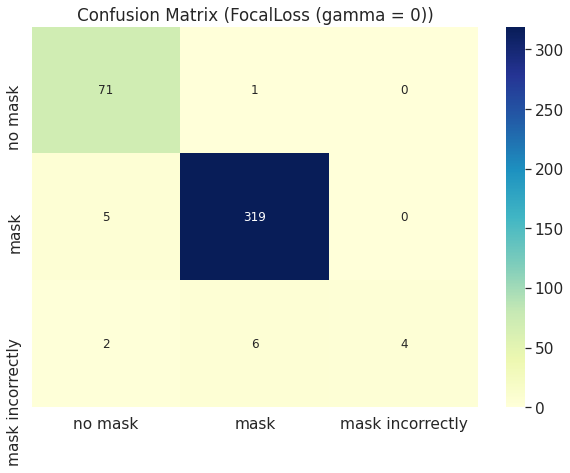

The testing error of the model trained using FocalLoss (gamma = 0_5) is: 0.07598039215686274
The testing loss of the model trained using FocalLoss (gamma = 0_5) is: 0.0809339860986386


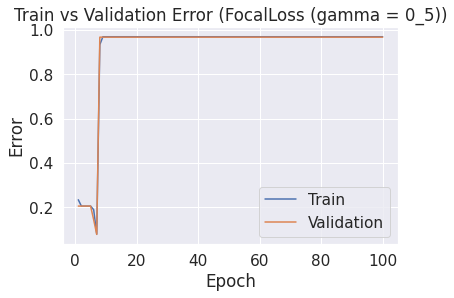

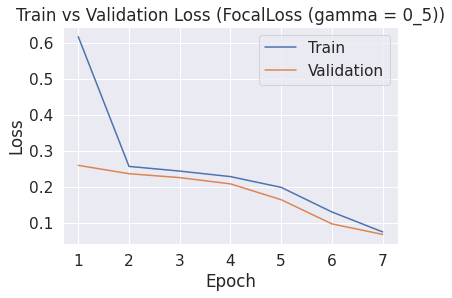

[[  0  10   2]
 [  0 317   7]
 [  0  12  60]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.94      0.98      0.96       324
           2       0.87      0.83      0.85        72

    accuracy                           0.92       408
   macro avg       0.60      0.60      0.60       408
weighted avg       0.90      0.92      0.91       408



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


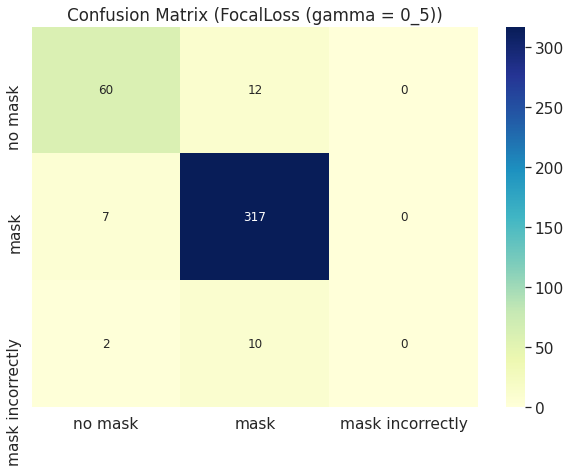

The testing error of the model trained using FocalLoss (gamma = 1) is: 0.04656862745098039
The testing loss of the model trained using FocalLoss (gamma = 1) is: 0.010811190919152327


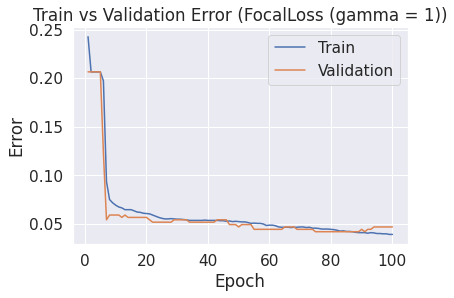

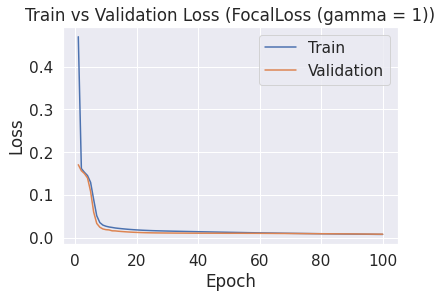

[[  5   5   2]
 [  2 313   9]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       0.71      0.42      0.53        12
           1       0.98      0.97      0.97       324
           2       0.87      0.99      0.92        72

    accuracy                           0.95       408
   macro avg       0.85      0.79      0.81       408
weighted avg       0.95      0.95      0.95       408



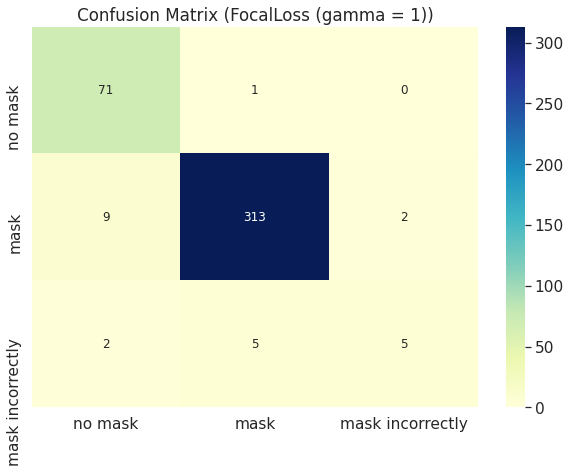

The testing error of the model trained using FocalLoss (gamma = 2) is: 0.03676470588235294
The testing loss of the model trained using FocalLoss (gamma = 2) is: 0.005698686569563246


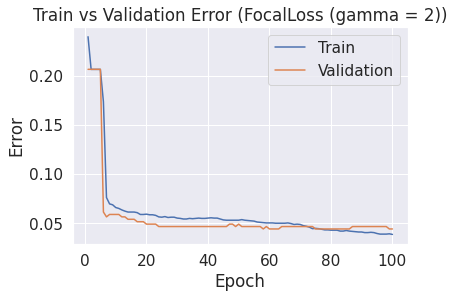

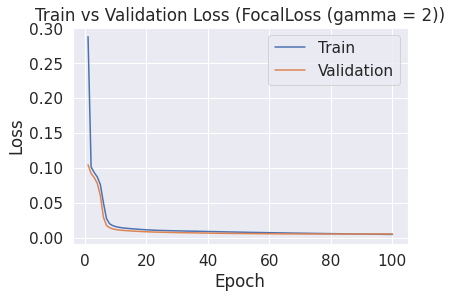

[[  5   5   2]
 [  2 321   1]
 [  0   5  67]]
              precision    recall  f1-score   support

           0       0.71      0.42      0.53        12
           1       0.97      0.99      0.98       324
           2       0.96      0.93      0.94        72

    accuracy                           0.96       408
   macro avg       0.88      0.78      0.82       408
weighted avg       0.96      0.96      0.96       408



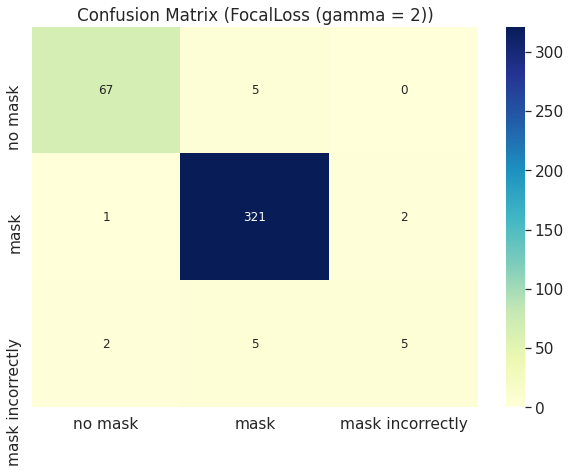

The testing error of the model trained using FocalLoss (gamma = 5) is: 0.03431372549019608
The testing loss of the model trained using FocalLoss (gamma = 5) is: 0.002124737553198689


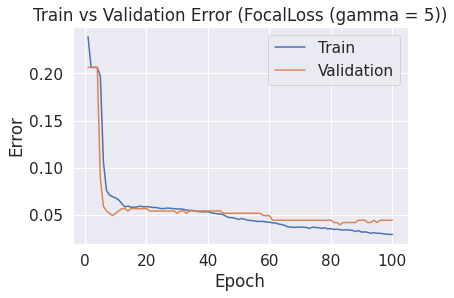

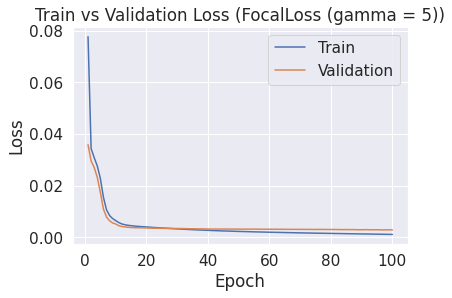

[[  6   4   2]
 [  1 319   4]
 [  0   3  69]]
              precision    recall  f1-score   support

           0       0.86      0.50      0.63        12
           1       0.98      0.98      0.98       324
           2       0.92      0.96      0.94        72

    accuracy                           0.97       408
   macro avg       0.92      0.81      0.85       408
weighted avg       0.96      0.97      0.96       408



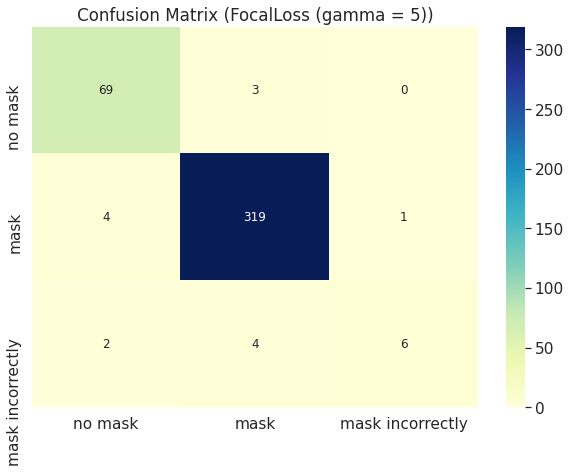

In [ ]:
# FocalLoss Evaluation
gamma_list = [0, 0.5, 1, 2, 5]
for g in gamma_list:
  g_name = str(g).replace(".","_")
  loss_name = "FocalLoss (gamma = {})".format(g_name)
  loss_function = FocalLoss_IMP(gamma = g)
  graph_path = "model_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_{}_bs64_lr0.0001_epoch99".format(g_name)
  model_path = "Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_{}best_val_loss".format(g_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using SparseMax Loss is: 0.04656862745098039
The testing loss of the model trained using SparseMax Loss is: 0.041959194998656


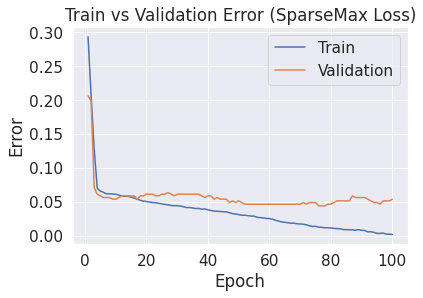

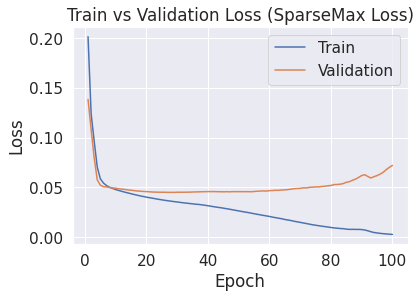

[[  3   7   2]
 [  3 316   5]
 [  0   2  70]]
              precision    recall  f1-score   support

           0       0.50      0.25      0.33        12
           1       0.97      0.98      0.97       324
           2       0.91      0.97      0.94        72

    accuracy                           0.95       408
   macro avg       0.79      0.73      0.75       408
weighted avg       0.95      0.95      0.95       408



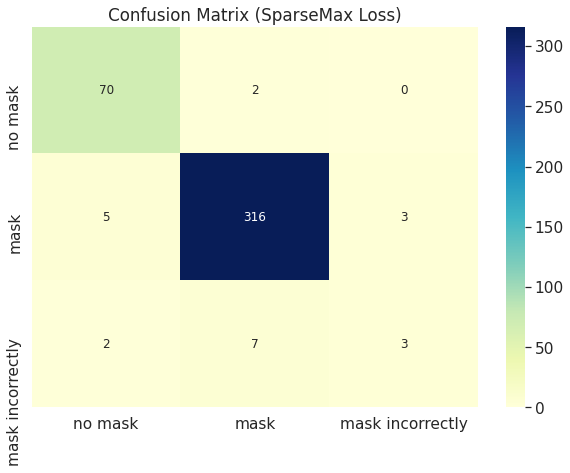

In [ ]:
# SparseMax Loss Evaluation
loss_name = "SparseMax Loss"
loss_function = Sparsemax_Loss_IMP()
graph_path = "model_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch99"
model_path = "Loss_Function_Evaluation_SparseMax_IMPbest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using LDAM (Normalized; C = 0_1) is: 0.06372549019607843
The testing loss of the model trained using LDAM (Normalized; C = 0_1) is: 0.21597915355648314


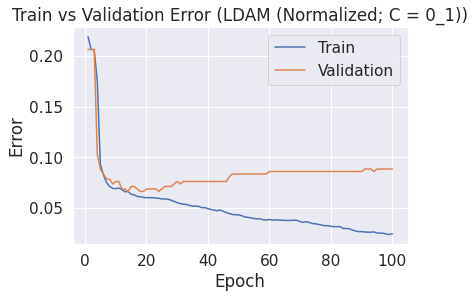

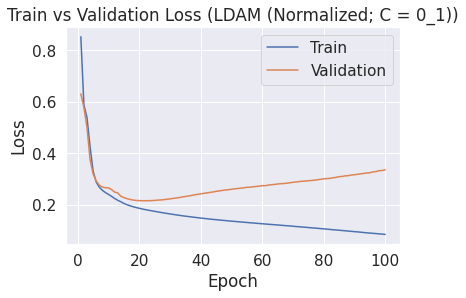

[[  0  10   2]
 [  1 317   6]
 [  0   7  65]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.95      0.98      0.96       324
           2       0.89      0.90      0.90        72

    accuracy                           0.94       408
   macro avg       0.61      0.63      0.62       408
weighted avg       0.91      0.94      0.92       408



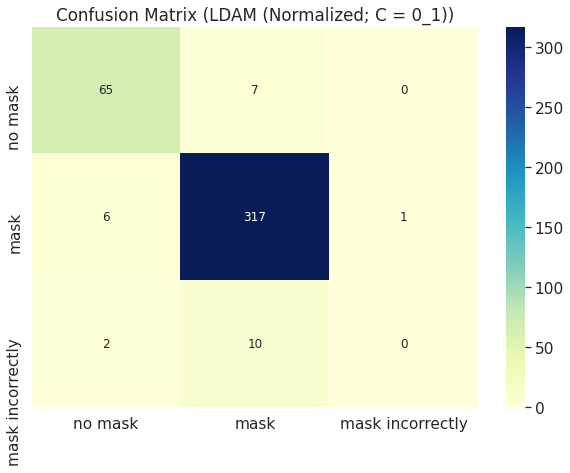

The testing error of the model trained using LDAM (Normalized; C = 0_5) is: 0.049019607843137254
The testing loss of the model trained using LDAM (Normalized; C = 0_5) is: 0.21498313333306993


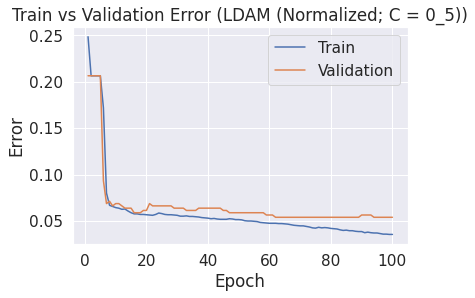

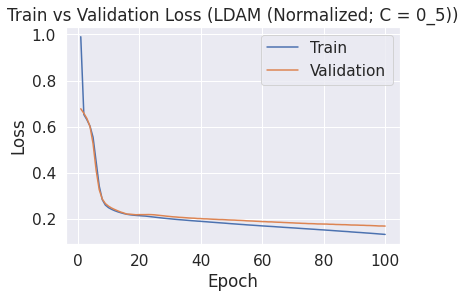

[[  4   6   2]
 [  2 314   8]
 [  0   2  70]]
              precision    recall  f1-score   support

           0       0.67      0.33      0.44        12
           1       0.98      0.97      0.97       324
           2       0.88      0.97      0.92        72

    accuracy                           0.95       408
   macro avg       0.84      0.76      0.78       408
weighted avg       0.95      0.95      0.95       408



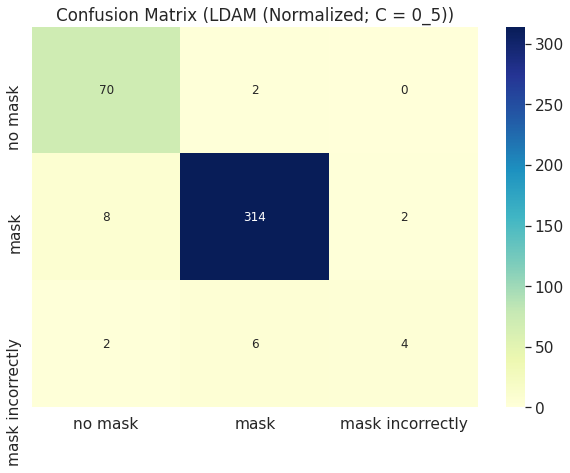

The testing error of the model trained using LDAM (Normalized; C = 1) is: 0.04656862745098039
The testing loss of the model trained using LDAM (Normalized; C = 1) is: 0.18737725168466568


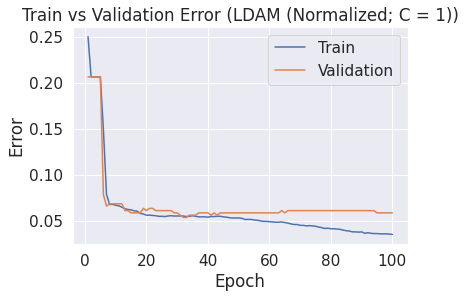

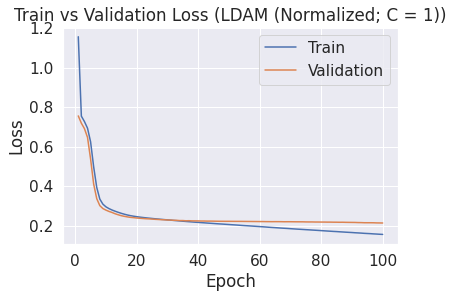

[[  7   3   2]
 [  4 311   9]
 [  0   1  71]]
              precision    recall  f1-score   support

           0       0.64      0.58      0.61        12
           1       0.99      0.96      0.97       324
           2       0.87      0.99      0.92        72

    accuracy                           0.95       408
   macro avg       0.83      0.84      0.83       408
weighted avg       0.96      0.95      0.95       408



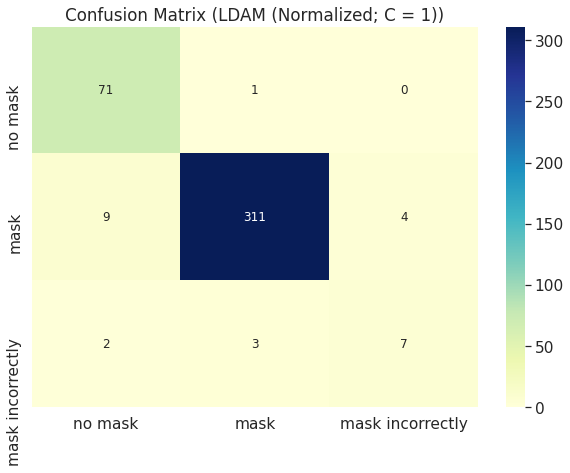

In [ ]:
# LDAM - Normalized Evaluation
count = [98.0,2585.0,574.0]
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  loss_name = "LDAM (Normalized; C = {})".format(c_name)
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=True)
  graph_path = "model_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_{}_bs64_lr0.0001_epoch99".format(c_name)
  model_path = "Loss_Function_Evaluation_LDAM_IMP_Normalized_C_{}best_val_loss".format(c_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

The testing error of the model trained using LDAM (Non Normalized; C = 0_1) is: 0.041666666666666664
The testing loss of the model trained using LDAM (Non Normalized; C = 0_1) is: 0.14910364683185304


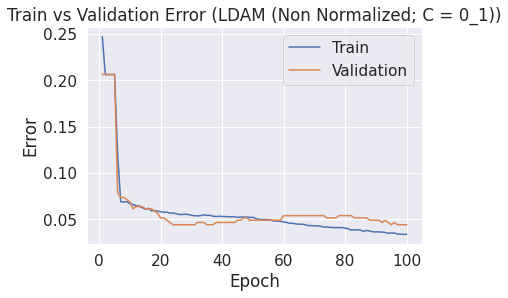

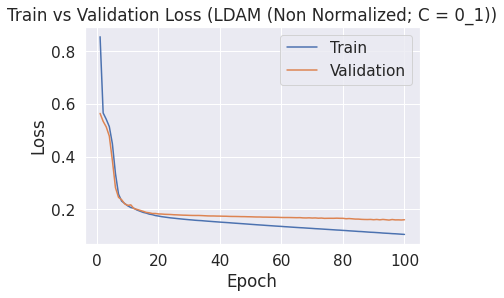

[[  4   6   2]
 [  2 319   3]
 [  0   4  68]]
              precision    recall  f1-score   support

           0       0.67      0.33      0.44        12
           1       0.97      0.98      0.98       324
           2       0.93      0.94      0.94        72

    accuracy                           0.96       408
   macro avg       0.86      0.75      0.79       408
weighted avg       0.95      0.96      0.95       408



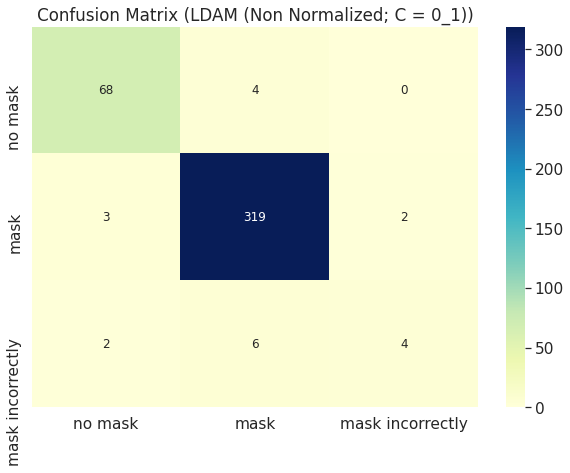

The testing error of the model trained using LDAM (Non Normalized; C = 0_5) is: 0.05392156862745098
The testing loss of the model trained using LDAM (Non Normalized; C = 0_5) is: 0.15928488916584424


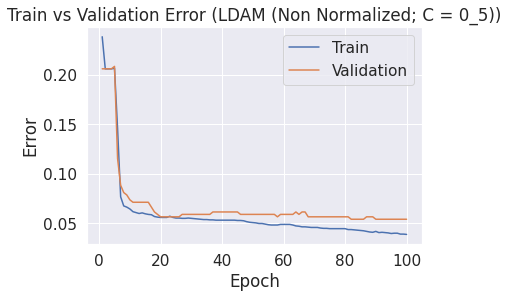

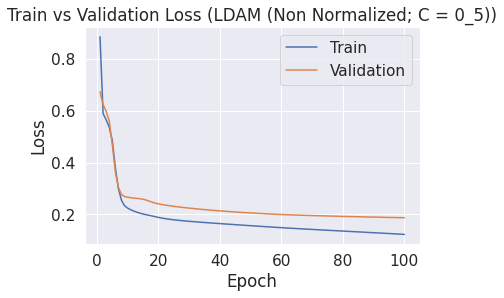

[[  4   6   2]
 [  3 312   9]
 [  0   2  70]]
              precision    recall  f1-score   support

           0       0.57      0.33      0.42        12
           1       0.97      0.96      0.97       324
           2       0.86      0.97      0.92        72

    accuracy                           0.95       408
   macro avg       0.80      0.76      0.77       408
weighted avg       0.94      0.95      0.94       408



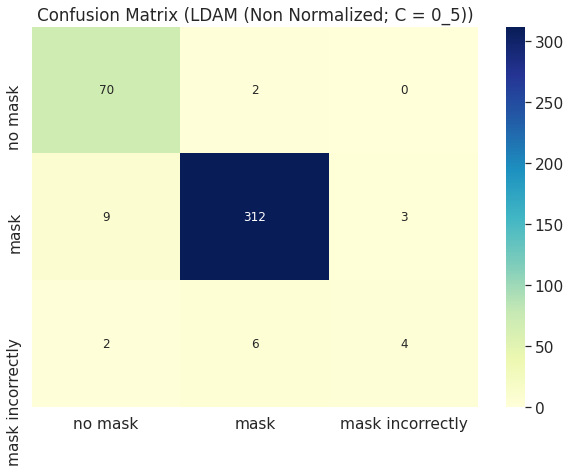

The testing error of the model trained using LDAM (Non Normalized; C = 1) is: 0.041666666666666664
The testing loss of the model trained using LDAM (Non Normalized; C = 1) is: 0.142178120889834


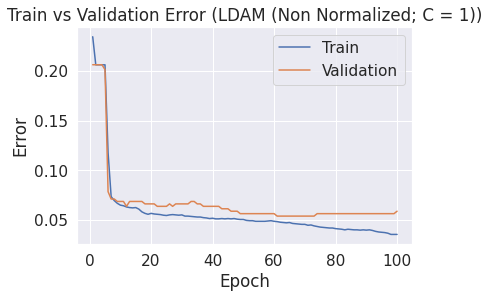

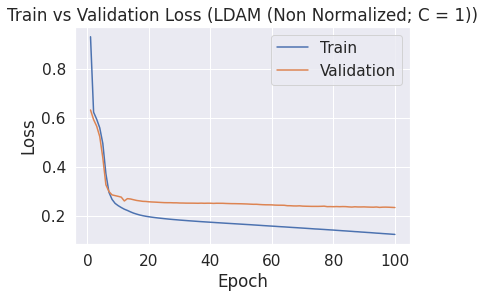

[[  5   5   2]
 [  3 319   2]
 [  0   5  67]]
              precision    recall  f1-score   support

           0       0.62      0.42      0.50        12
           1       0.97      0.98      0.98       324
           2       0.94      0.93      0.94        72

    accuracy                           0.96       408
   macro avg       0.85      0.78      0.80       408
weighted avg       0.95      0.96      0.96       408



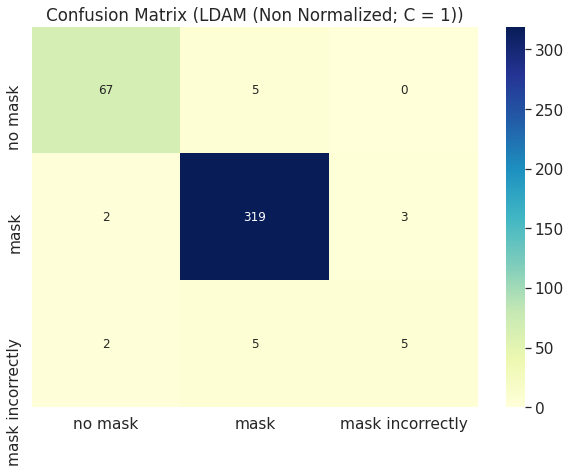

In [ ]:
# LDAM - Non Normalized Evaluation
count = [98.0,2585.0,574.0]
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  loss_name = "LDAM (Non Normalized; C = {})".format(c_name)
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=False)
  graph_path = "model_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_{}_bs64_lr0.0001_epoch99".format(c_name)
  model_path = "Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_{}best_val_loss".format(c_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path)

## Test on CIFAR-10 LT

In [ ]:
# This helper function to generate imbalanced CIFAR 10 dataset is from KaihuaTang
# REF: https://github.com/KaihuaTang/Long-Tailed-Recognition.pytorch/blob/master/classification/data/ImbalanceCIFAR.py

transform_function = transforms.Compose(
        [
         transforms.Resize((50,50)),
         transforms.ToTensor(),
         ])

class IMBALANCECIFAR10(torchvision.datasets.CIFAR10):
    cls_num = 10

    def __init__(self, root, imb_type='exp', imb_factor=0.01, rand_number=0, train=True,
                 transform=None, target_transform=None,
                 download=False):
        super(IMBALANCECIFAR10, self).__init__(root, train, transform, target_transform, download)
        np.random.seed(rand_number)
        img_num_list = self.get_img_num_per_cls(self.cls_num, imb_type, imb_factor)
        self.gen_imbalanced_data(img_num_list)

    def get_img_num_per_cls(self, cls_num, imb_type, imb_factor):
        img_max = len(self.data) / cls_num
        img_num_per_cls = []
        if imb_type == 'exp':
            for cls_idx in range(cls_num):
                num = img_max * (imb_factor**(cls_idx / (cls_num - 1.0)))
                img_num_per_cls.append(int(num))
        elif imb_type == 'step':
            for cls_idx in range(cls_num // 2):
                img_num_per_cls.append(int(img_max))
            for cls_idx in range(cls_num // 2):
                img_num_per_cls.append(int(img_max * imb_factor))
        else:
            img_num_per_cls.extend([int(img_max)] * cls_num)
        return img_num_per_cls

    def gen_imbalanced_data(self, img_num_per_cls):
        new_data = []
        new_targets = []
        targets_np = np.array(self.targets, dtype=np.int64)
        classes = np.unique(targets_np)
        # np.random.shuffle(classes)
        self.num_per_cls_dict = dict()
        for the_class, the_img_num in zip(classes, img_num_per_cls):
            self.num_per_cls_dict[the_class] = the_img_num
            idx = np.where(targets_np == the_class)[0]
            np.random.shuffle(idx)
            selec_idx = idx[:the_img_num]
            new_data.append(self.data[selec_idx, ...])
            new_targets.extend([the_class, ] * the_img_num)
        new_data = np.vstack(new_data)
        self.data = new_data
        self.targets = new_targets
        
    def get_cls_num_list(self):
        cls_num_list = []
        for i in range(self.cls_num):
            cls_num_list.append(self.num_per_cls_dict[i])
        return cls_num_list

In [ ]:
# Initialize the dataset and download the training_validation image
train_validation_dataset = IMBALANCECIFAR10(root='/content/drive/My Drive/MIE424 Final Project/CIFAR_10', imb_type="exp", imb_factor=0.01, rand_number=66, train=True, download=True, transform=transform_function)

Files already downloaded and verified


In [ ]:
# Initialize the dataset and download the testing image
testing_dataset = IMBALANCECIFAR10(root='/content/drive/My Drive/MIE424 Final Project/CIFAR_10_Testing', imb_type="exp", imb_factor=0.01, rand_number=66, train=False, download=True, transform=transform_function)

Files already downloaded and verified


In [ ]:
len(testing_dataset)

2478

In [ ]:
x = [1,2,3,4,5,6,7,8,9,10]
y = []
for i in range(10):
  num = train_validation_dataset.get_cls_num_list()[i] + testing_dataset.get_cls_num_list()[i]
  y.append(num)
a = train_validation_dataset.get_cls_num_list() + testing_dataset.get_cls_num_list()

In [ ]:
print(x)
print(y)
print(a)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
[6000, 3596, 2155, 1292, 774, 464, 278, 166, 99, 60]
[5000, 2997, 1796, 1077, 645, 387, 232, 139, 83, 50, 1000, 599, 359, 215, 129, 77, 46, 27, 16, 10]


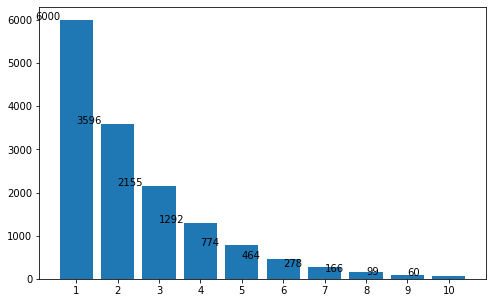

In [ ]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i])

fig, ax = plt.subplots(figsize=(8,5))
ax.bar(x,y)
ax.set_xticks(x)
addlabels(x, y)
plt.show()

In [ ]:
def get_data_loader_cifar_10_LT(batch_size):
  full_training_validation_data = IMBALANCECIFAR10(root='/content/drive/My Drive/MIE424 Final Project/CIFAR_10', imb_type="exp", imb_factor=0.01, rand_number=66, train=True, download=True, transform=transform_function)
  full_testing_data = IMBALANCECIFAR10(root='/content/drive/My Drive/MIE424 Final Project/CIFAR_10_Testing', imb_type="exp", imb_factor=0.01, rand_number=66, train=False, download=True, transform=transform_function)
  
  # run train_test_split twice to stratified split dataset into train,validation and testing
  targets = full_training_validation_data.targets
  # print(dict(Counter(targets)))
  train_idx, valid_test_idx= train_test_split(np.arange(len(targets)),test_size=0.15,shuffle=True,stratify=targets)
  train_targets = [targets[i] for i in train_idx]
  # print(dict(Counter(train_targets)))
  train_data = Custom_Subset(full_training_validation_data,train_idx,train_targets)
  valid_targets = [targets[i] for i in valid_test_idx]
  # print(dict(Counter(valid_test_targets)))
  valid_data = Custom_Subset(full_training_validation_data,valid_test_idx,valid_targets)


  print("There are " + str(len(train_data)) + " training images, and the corresponding data distribution is: ")
  print(dict(Counter(train_data.targets)))
  print("There are " + str(len(valid_data)) + " validation images, and the corresponding data distribution is: ")
  print(dict(Counter(valid_data.targets)))

  print("There are " + str(len(full_testing_data)) + " test images, and the corresponding data distribution is: ")
  print(dict(Counter(full_testing_data.targets)))
  
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,num_workers=2)
  
  val_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size,num_workers=2)

  test_loader = torch.utils.data.DataLoader(full_testing_data, batch_size=batch_size,num_workers=2)
  
  return train_loader, val_loader, test_loader

In [ ]:
train_loader, val_loader, test_loader = get_data_loader_cifar_10_LT(batch_size=64)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}


In [ ]:
class_dict = {2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
count = []
for i in range(10):
  count.append(class_dict[i])
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))
weights_inv_frequency = []
for i in weights_frequency:
  weights_inv_frequency.append(1.0/i)

print(count)
print(weights_frequency)
print(weights_inv_frequency)

[4250, 2547, 1527, 915, 548, 329, 197, 118, 71, 43]
[0.40303461356092934, 0.2415362731152205, 0.14480796586059744, 0.08677098150782361, 0.051967757230915124, 0.031199620673304885, 0.018681839734471312, 0.01119013750592698, 0.006733048838311996, 0.004077761972498814]
[2.4811764705882355, 4.1401648998822145, 6.905697445972495, 11.524590163934427, 19.24270072992701, 32.0516717325228, 53.527918781725894, 89.36440677966101, 148.5211267605634, 245.23255813953492]


Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMP
Total time elapsed: 1237.85 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch98, its val_error is 0.2939279957012359 and val_loss is 0.91794739762942
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch69, its val_error is 0.2976894142

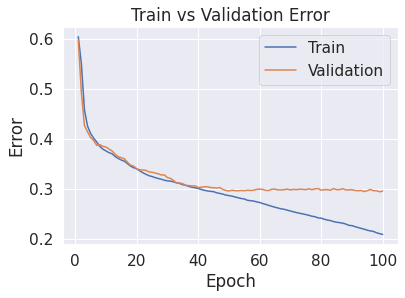

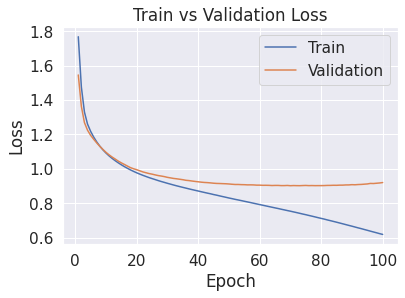

In [ ]:
# CE Long_Tailed_CIFAR
model_name = "CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMP"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5(num_class=10)
lenet.cuda()
loss_function = CrossEntropyLoss_IMP()
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency
Total time elapsed: 1533.04 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency_bs64_lr0.0001_epoch99, its val_error is 0.3057495969908651 and val_loss is 0.15407137076059976
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Fr

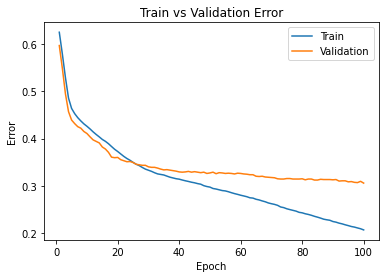

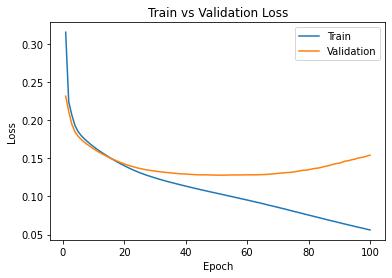

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency
Total time elapsed: 1592.65 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency_bs64_lr0.0001_epoch92, its val_error is 0.3766792047286405 and val_loss is 30.263761393229167
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEnt

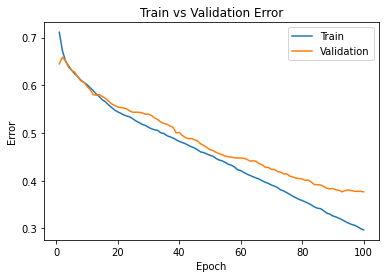

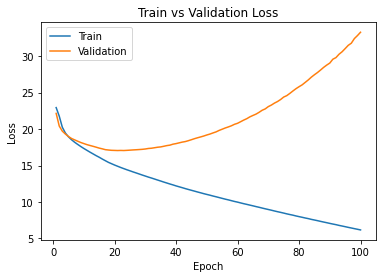

In [ ]:
# Weighted CE (Weight = Frequency) Long_Tailed_CIFAR
model_name = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5(num_class=10)
lenet.cuda()
loss_function = Weighted_CrossEntropyLoss_IMP(weights=weights_frequency)
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)
# Weighted CE (Weight = Inverse class frequency)
model_name = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5(num_class=10)
lenet.cuda()
loss_function = Weighted_CrossEntropyLoss_IMP(weights=weights_inv_frequency)
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Parameters used in this run: 
[0.24811764705882355, 0.41401648998822144, 0.6905697445972495, 1.1524590163934427, 1.924270072992701, 3.2051671732522795, 5.35279187817259, 8.936440677966102, 14.852112676056338, 24.523255813953494]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_1
Total time elapsed: 1632.19 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_

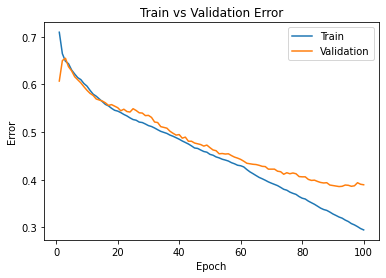

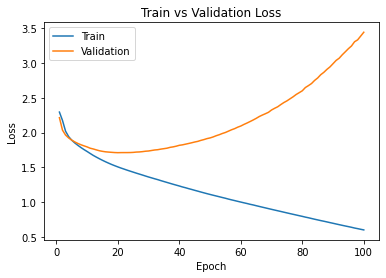

Parameters used in this run: 
[1.2405882352941178, 2.0700824499411072, 3.4528487229862477, 5.762295081967213, 9.621350364963504, 16.0258358662614, 26.763959390862947, 44.682203389830505, 74.2605633802817, 122.61627906976746]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_0_5
Total time elapsed: 1671.39 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_Cros

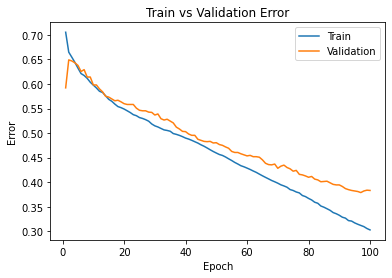

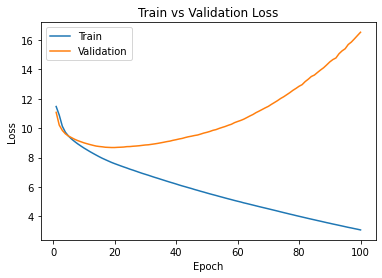

Parameters used in this run: 
[2.977411764705882, 4.968197879858657, 8.286836935166994, 13.82950819672131, 23.09124087591241, 38.462006079027354, 64.23350253807106, 107.23728813559322, 178.22535211267603, 294.27906976744185]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_1_2
Total time elapsed: 1769.09 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_Cros

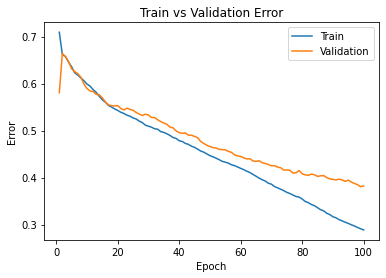

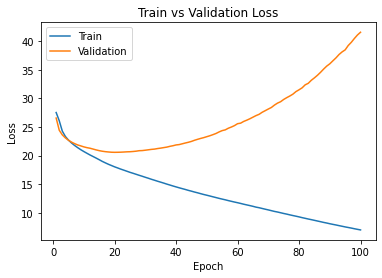

Parameters used in this run: 
[12.405882352941177, 20.70082449941107, 34.52848722986248, 57.622950819672134, 96.21350364963504, 160.25835866261397, 267.6395939086295, 446.82203389830505, 742.6056338028169, 1226.1627906976746]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_5
Total time elapsed: 1818.34 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_Cross

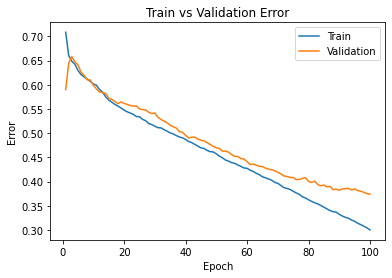

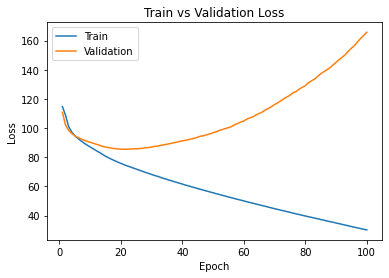

Parameters used in this run: 
[24.811764705882354, 41.40164899882214, 69.05697445972496, 115.24590163934427, 192.4270072992701, 320.51671732522794, 535.279187817259, 893.6440677966101, 1485.2112676056338, 2452.325581395349]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_10
Total time elapsed: 1812.41 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossE

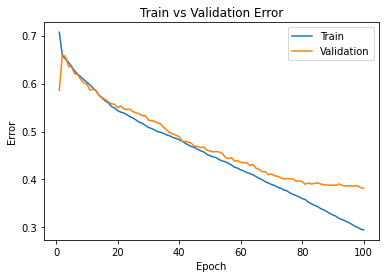

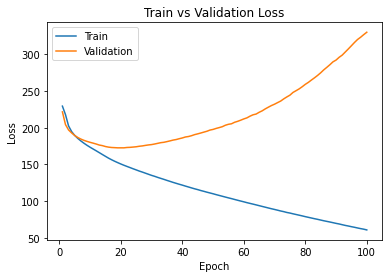

In [ ]:
# Weighted CE (Weight = Linearly scaled k>0) Long_Tailed_CIFAR
K = [0.1, 0.5, 1.2, 5, 10]
for k in K:
  temp = []
  for i in weights_frequency:
    temp.append(k/i)
  k_name = str(k).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_" + k_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Parameters used in this run: 
[0.21558565043446726, 0.7275884373734727, 1.2391996071342972, 1.7513358470774083, 2.2639846254049143, 2.774202161587558, 3.2870561836149412, 3.7995752878872646, 4.307580035311615, 4.809059796659367]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_0_5
Total time elapsed: 1251.69 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_Cros

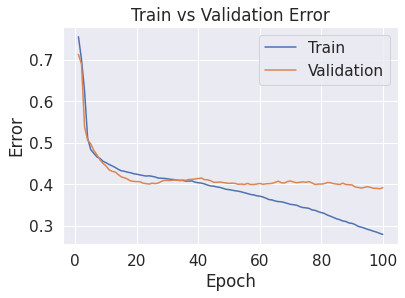

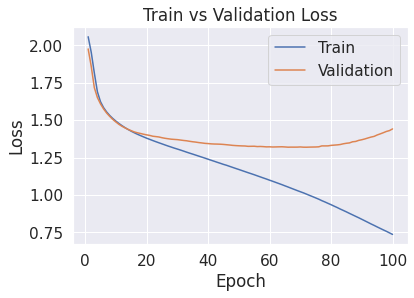

Parameters used in this run: 
[0.9087328309944126, 1.420735617933418, 1.9323467876942426, 2.4444830276373537, 2.9571318059648597, 3.4673493421475032, 3.9802033641748866, 4.4927224684472105, 5.000727215871559, 5.502206977219313]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_1
Total time elapsed: 1182.93 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEn

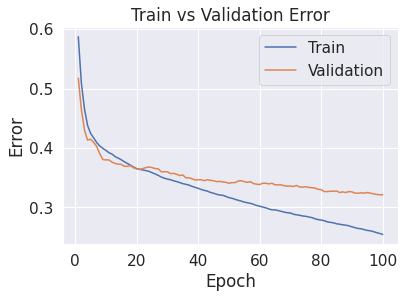

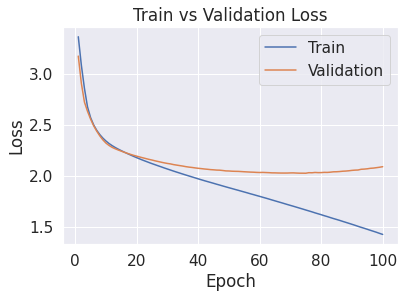

Parameters used in this run: 
[1.6018800115543579, 2.1138827984933632, 2.625493968254188, 3.137630208197299, 3.6502789865248046, 4.160496522707448, 4.673350544734832, 5.185869649007156, 5.693874396431505, 6.195354157779258]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_2
Total time elapsed: 1098.39 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntrop

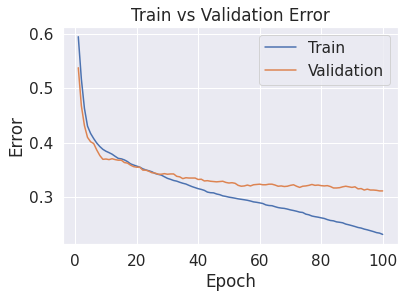

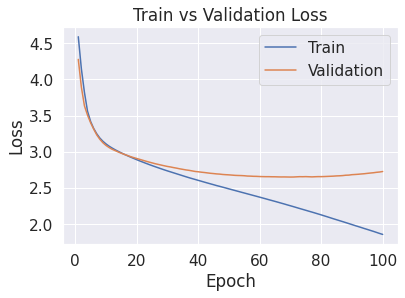

Parameters used in this run: 
[2.518170743428513, 3.0301735303675184, 3.541784700128343, 4.053920940071454, 4.56656971839896, 5.076787254581603, 5.589641276608987, 6.10216038088131, 6.61016512830566, 7.111644889653413]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_5
Total time elapsed: 1086.67 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss

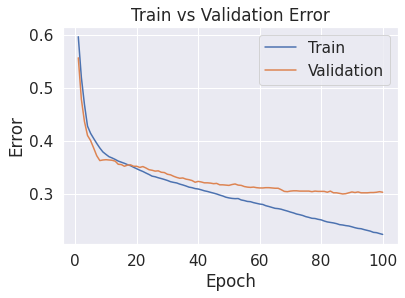

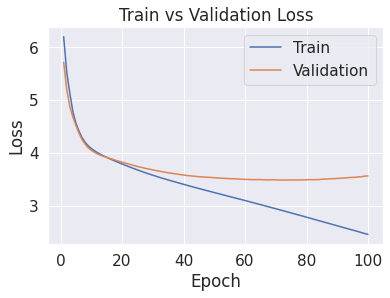

Parameters used in this run: 
[3.2113179239884584, 3.7233207109274638, 4.234931880688288, 4.7470681206314, 5.259716898958906, 5.769934435141549, 6.282788457168932, 6.7953075614412555, 7.303312308865605, 7.804792070213359]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_10
Total time elapsed: 1105.05 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropy

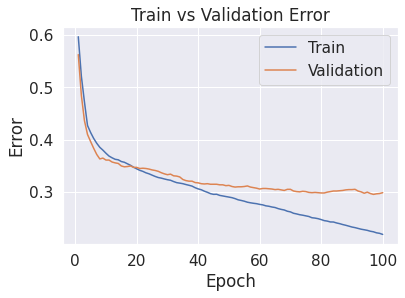

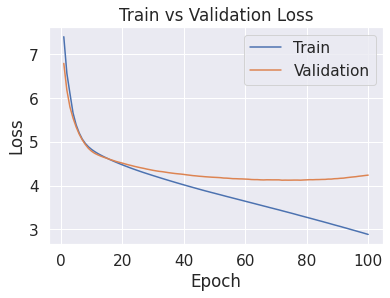

In [ ]:
# Weighted CE (Weight = logarithmic q>frequency) Long_Tailed_CIFAR
Q = [0.5, 1, 2, 5, 10]
for q in Q:
  temp = []
  for i in weights_frequency:
    temp.append(math.log(q/i))
  q_name = str(q).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_" + q_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Parameters used in this run: 
[10.000000000000002, 10.000000000000002, 10.000000000000002, 10.000000000000002, 10.000000000000002, 9.999999999999993, 9.999999990322253, 9.999960132765212, 9.994360791266041, 9.892247363356944]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9
Total time elapsed: 1998.34 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_

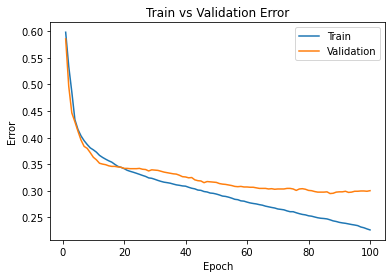

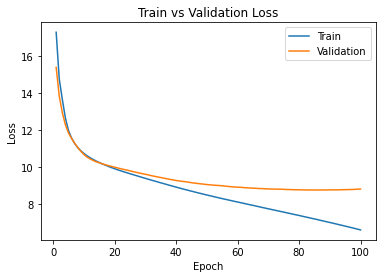

Parameters used in this run: 
[10.000000000000002, 10.000000000000002, 10.000000000000002, 10.000000000000002, 10.000000000000002, 9.999999999999993, 9.999999990322253, 9.999960132765212, 9.994360791266041, 9.892247363356944]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9
Total time elapsed: 2070.14 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_

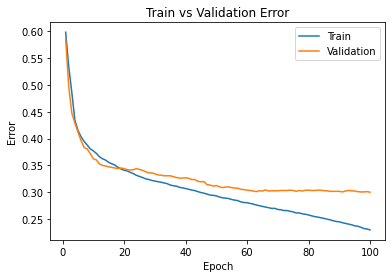

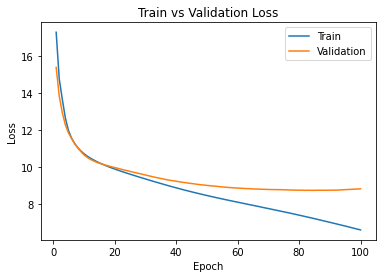

Parameters used in this run: 
[985.7660655847818, 921.7834760181921, 782.9796192580371, 599.66669055002, 422.05362001427187, 280.4754337599467, 178.89030394116628, 111.35641388529284, 68.57119624300927, 42.109218546533675]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_999
Total time elapsed: 2106.49 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_C

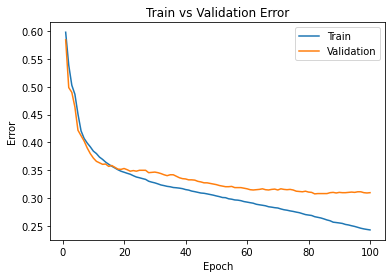

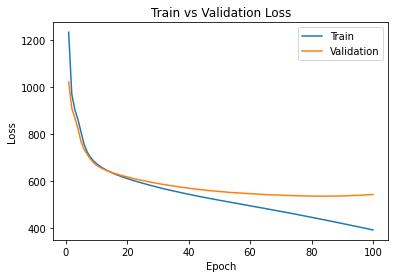

Parameters used in this run: 
[3462.4410825671, 2248.6086433270393, 1416.1935485056115, 874.4285908481116, 533.2813014337644, 323.66273582069573, 195.0818882720133, 117.31236150362827, 70.75207057966605, 42.90982328668675]
Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_0_9999
Total time elapsed: 2159.50 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_Weighted_

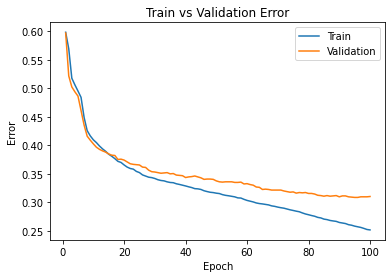

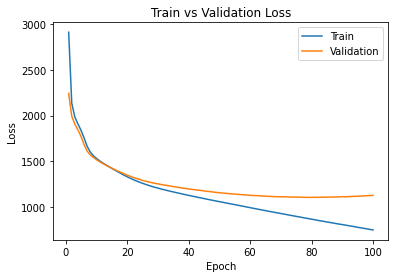

In [ ]:
# Weighted CE (Weight = Effective number of samples) Long_Tailed_CIFAR
Betas = [0.9,0.9,0.999,0.9999]
for b in Betas:
  temp = []
  for i in count:
    temp.append((1-b**i)/(1-b))
  b_name = str(b).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_" + b_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  print("Parameters used in this run: ")
  print(temp)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0
Total time elapsed: 2183.85 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_bs64_lr0.0001_epoch98, its val_error is 0.2939279957012359 and val_loss is 0.8906438807646434
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_bs64_lr0.0001_epoch89, its val_error is 0.29930

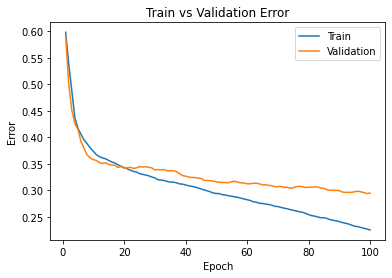

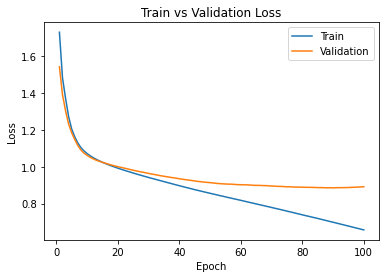

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5
Total time elapsed: 2152.22 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5_bs64_lr0.0001_epoch66, its val_error is 0.2998387963460505 and val_loss is 0.46215910464525223
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_0_5_bs64_lr0.0001_epoch66, its val_error is 

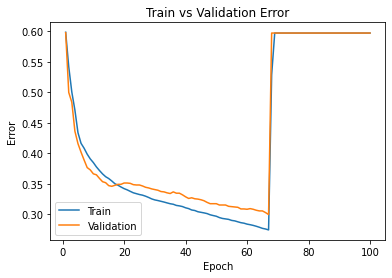

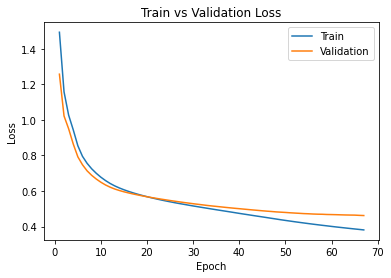

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1
Total time elapsed: 2156.44 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1_bs64_lr0.0001_epoch96, its val_error is 0.2907039226222461 and val_loss is 0.3389732301235199
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_1_bs64_lr0.0001_epoch89, its val_error is 0.29446

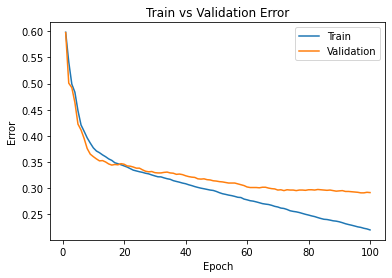

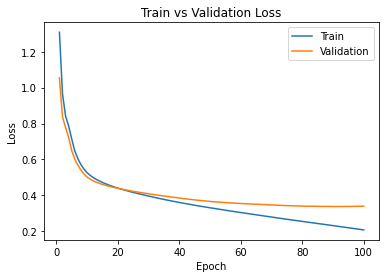

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2
Total time elapsed: 2216.78 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2_bs64_lr0.0001_epoch97, its val_error is 0.28855454056958624 and val_loss is 0.2342731053630511
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_2_bs64_lr0.0001_epoch99, its val_error is 0.2896

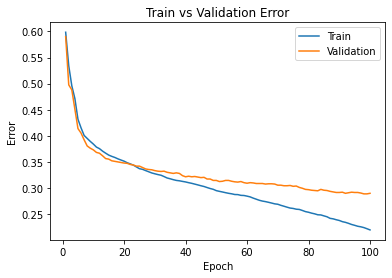

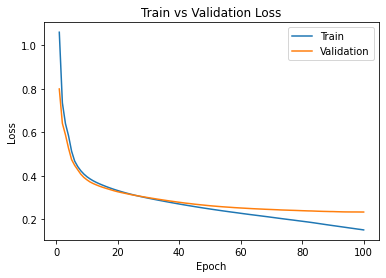

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5
Total time elapsed: 2284.17 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5_bs64_lr0.0001_epoch75, its val_error is 0.29285330467490595 and val_loss is 0.1296556497613589
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_5_bs64_lr0.0001_epoch78, its val_error is 0.2933

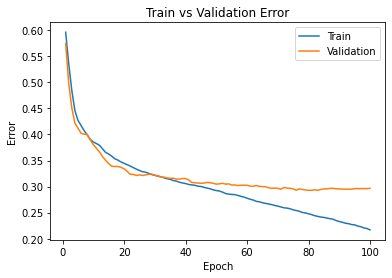

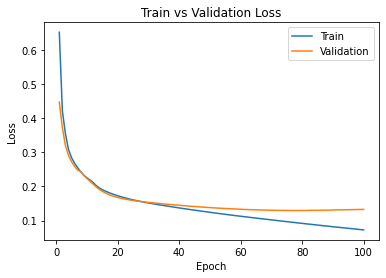

In [ ]:
# FocalLoss Long_Tailed_CIFAR
gamma_list = [0, 0.5, 1, 2, 5]
for g in gamma_list:
  g_name = str(g).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_" + g_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = FocalLoss_IMP(gamma = g)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMP
Total time elapsed: 2329.29 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch59, its val_error is 0.2907039226222461 and val_loss is 0.2204876075188319
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch35, its val_error is 0.2987641053197206 and val_loss

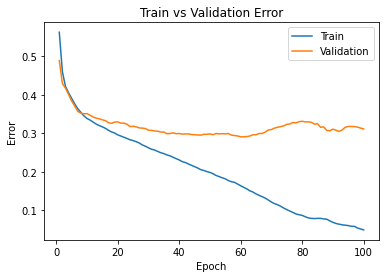

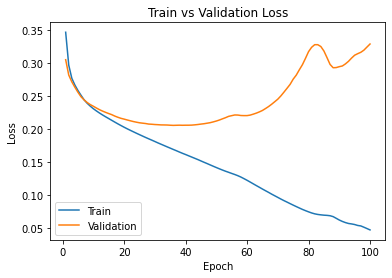

In [ ]:
# SparseMax Loss Long_Tailed_CIFAR
model_name = "CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMP"
gc.collect()
torch.cuda.empty_cache()
lenet = LeNet5(num_class=10)
lenet.cuda()
loss_function = Sparsemax_Loss_IMP()
train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1
Total time elapsed: 2326.24 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1_bs64_lr0.0001_epoch94, its val_error is 0.28855454056958624 and val_loss is 0.9029365837574005
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_1_bs64_lr0.0001_epoch80, its val_err

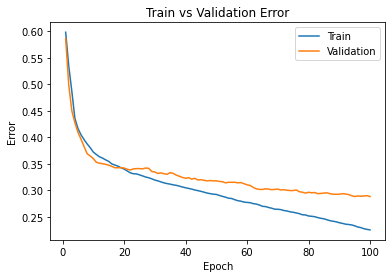

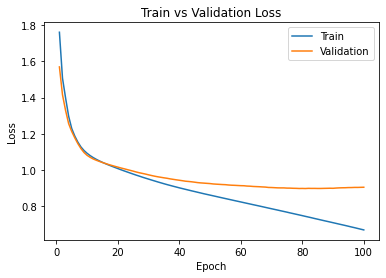

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5
Total time elapsed: 2384.13 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5_bs64_lr0.0001_epoch94, its val_error is 0.29285330467490595 and val_loss is 0.9749179045359294
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_0_5_bs64_lr0.0001_epoch87, its val_err

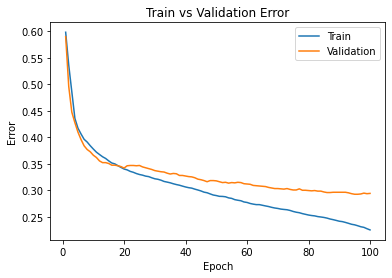

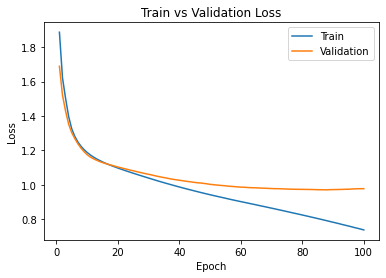

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1
Total time elapsed: 2379.87 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1_bs64_lr0.0001_epoch88, its val_error is 0.2864051585169264 and val_loss is 1.0672914425532023
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_1_bs64_lr0.0001_epoch81, its val_error is 0

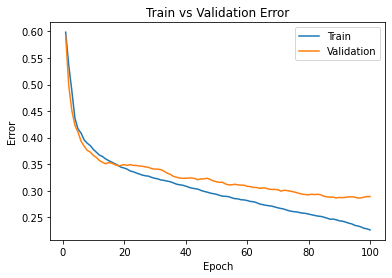

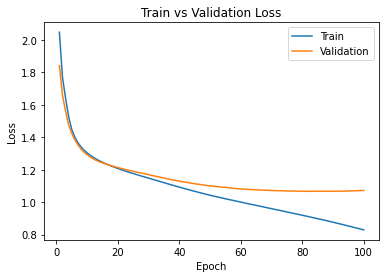

In [ ]:
# LDAM - Normalized Long_Tailed_CIFAR
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_" + c_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=True)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1
Total time elapsed: 1161.63 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1_bs64_lr0.0001_epoch76, its val_error is 0.29177861364857605 and val_loss is 0.9175897061824798
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_1_bs64_lr0.0001_epoch59,

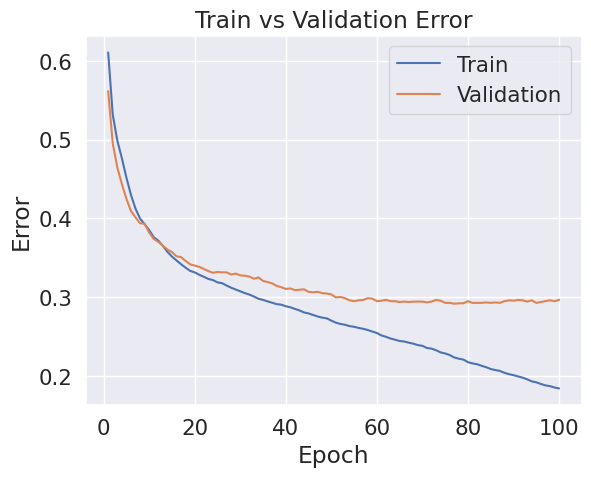

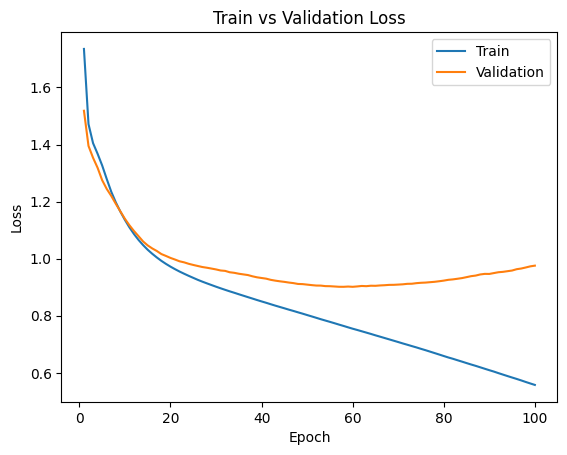

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5
Total time elapsed: 1194.10 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5_bs64_lr0.0001_epoch99, its val_error is 0.27780763030628697 and val_loss is 0.900712384780248
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_0_5_bs64_lr0.0001_epoch81, 

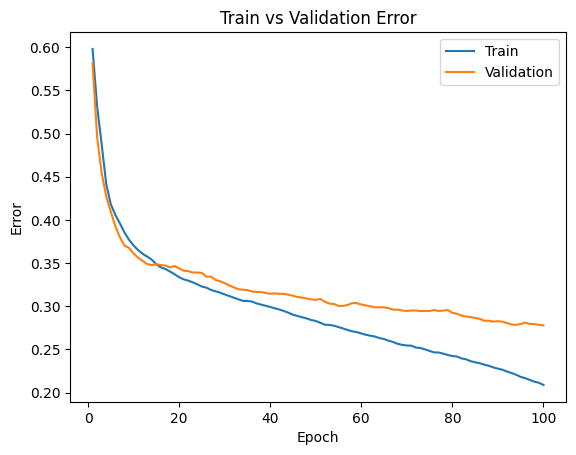

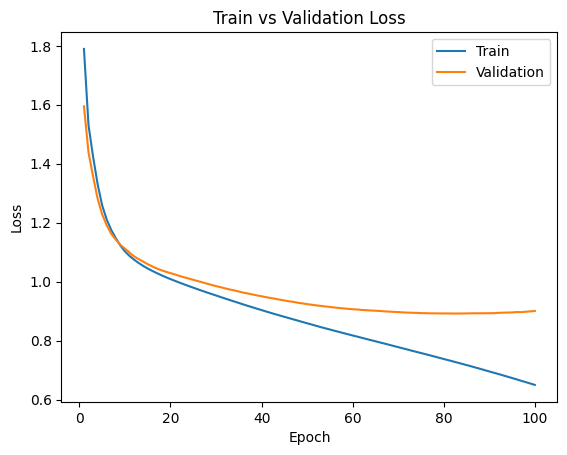

Files already downloaded and verified
Files already downloaded and verified
There are 10545 training images, and the corresponding data distribution is: 
{2: 1527, 6: 197, 0: 4250, 1: 2547, 3: 915, 5: 329, 4: 548, 9: 43, 7: 118, 8: 71}
There are 1861 validation images, and the corresponding data distribution is: 
{2: 269, 0: 750, 1: 450, 3: 162, 7: 21, 6: 35, 4: 97, 5: 58, 9: 7, 8: 12}
There are 2478 test images, and the corresponding data distribution is: 
{0: 1000, 1: 599, 2: 359, 3: 215, 4: 129, 5: 77, 6: 46, 7: 27, 8: 16, 9: 10}
Finished Training: CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1
Total time elapsed: 1153.31 seconds
The best model based on validation err is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1_bs64_lr0.0001_epoch95, its val_error is 0.292315959161741 and val_loss is 0.9571029623349507
The best model based on validation loss is model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_1_bs64_lr0.0001_epoch86, its val

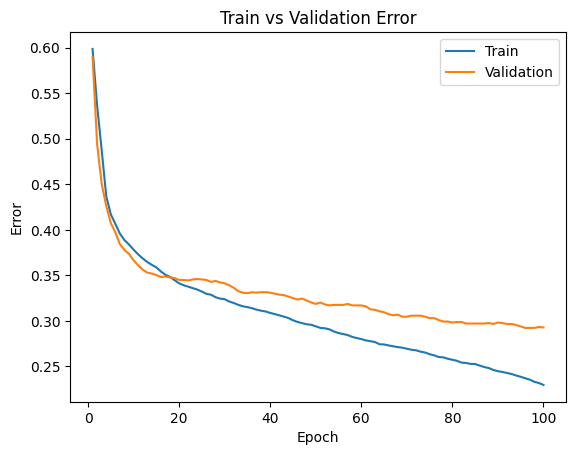

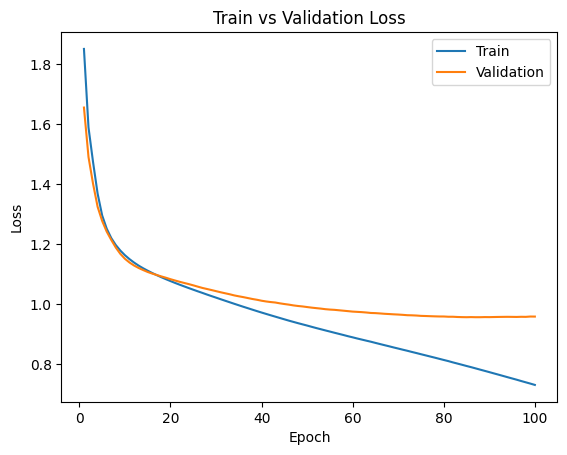

In [ ]:
# LDAM - Non Normalized Long_Tailed_CIFAR
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  name = "CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_" + c_name
  model_name = name
  gc.collect()
  torch.cuda.empty_cache()
  lenet = LeNet5(num_class=10)
  lenet.cuda()
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=False)
  train_model(lenet,model_name,batch_size=64, num_epochs=100, learning_rate=0.0001,loss_function=loss_function,save_output=True,print_stack_trace=False,using_cifar = True)

## CIFAR 10 Evaluation Results

The testing error of the model trained using CE CIFAR_LT is: 0.29136400322841
The testing loss of the model trained using CE CIFAR_LT is: 0.9407061334603872


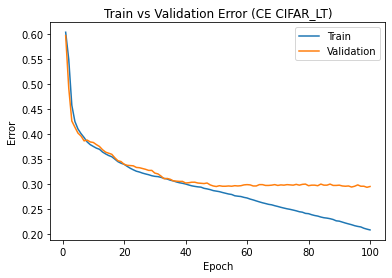

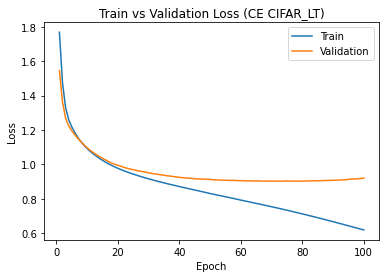

[[905  39  24  25   3   1   1   1   0   1]
 [ 96 481   6  10   0   1   0   1   1   3]
 [ 89   9 192  48   8  10   2   1   0   0]
 [ 33  11  30 131   5   5   0   0   0   0]
 [ 25   3  48  23  28   1   1   0   0   0]
 [  7   5   8  39   5  13   0   0   0   0]
 [  4   5  12  17   4   0   4   0   0   0]
 [ 12   2   4   5   0   2   0   2   0   0]
 [  9   4   1   2   0   0   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.91      0.83      1000
           1       0.85      0.80      0.83       599
           2       0.59      0.53      0.56       359
           3       0.44      0.61      0.51       215
           4       0.53      0.22      0.31       129
           5       0.39      0.17      0.24        77
           6       0.50      0.09      0.15        46
           7       0.40      0.07      0.12        27
           8       0.00      0.00      0.00        16
           9       0.00     

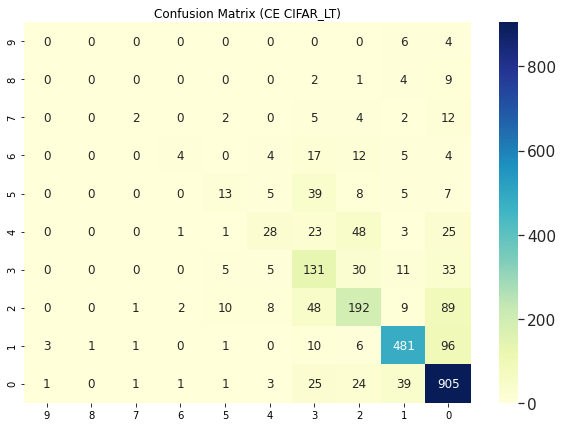

In [ ]:
# CE Evaluation
loss_name = "CE CIFAR_LT"
loss_function = CrossEntropyLoss_IMP()
graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMP_bs64_lr0.0001_epoch99"
model_path = "CIFAR_LT_Loss_Function_Evaluation_CrossEntropyLoss_IMPbest_val_err"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar = True)

The testing error of the model trained using W_CE CIFAR_LT (Weight = Frequency) is: 0.3309120258272801
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Frequency) is: 0.12667469861797798


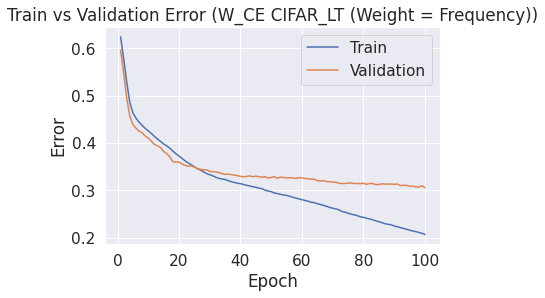

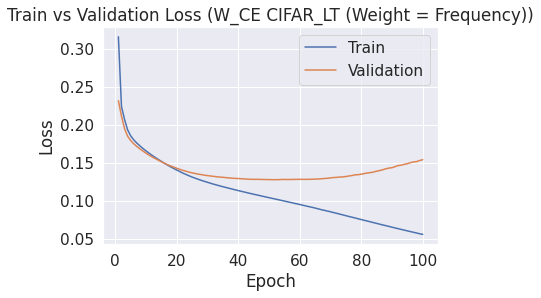

[[940  32  24   4   0   0   0   0   0   0]
 [156 433   7   3   0   0   0   0   0   0]
 [116  13 218  12   0   0   0   0   0   0]
 [ 61  16  71  67   0   0   0   0   0   0]
 [ 44   7  70   8   0   0   0   0   0   0]
 [ 19   5  32  21   0   0   0   0   0   0]
 [ 10   8  19   9   0   0   0   0   0   0]
 [ 20   2   2   3   0   0   0   0   0   0]
 [  8   6   1   1   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.68      0.94      0.79      1000
           1       0.82      0.72      0.77       599
           2       0.49      0.61      0.54       359
           3       0.52      0.31      0.39       215
           4       0.00      0.00      0.00       129
           5       0.00      0.00      0.00        77
           6       0.00      0.00      0.00        46
           7       0.00      0.00      0.00        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


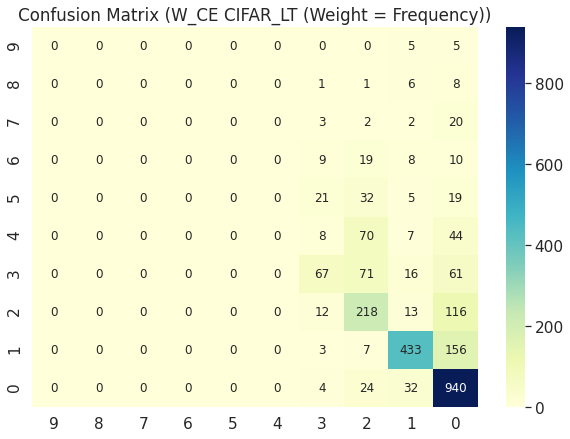

The testing error of the model trained using W_CE CIFAR_LT (Weight = Inverse class frequency) is: 0.5609362389023406
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Inverse class frequency) is: 17.652986813814213


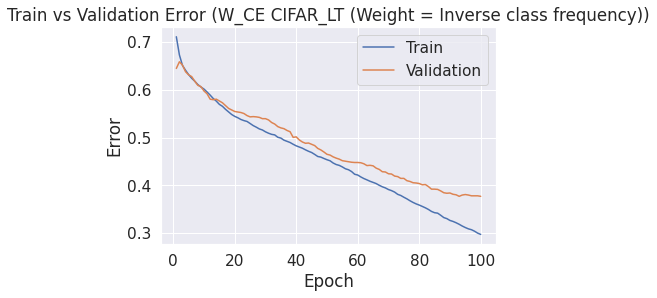

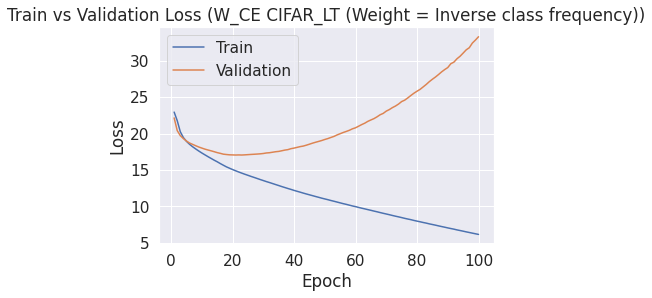

[[491  65  74  39   9  19   9  52 205  37]
 [ 28 319   3  17   2  20   4  22  98  86]
 [ 24  18 122  31  28  35  46  35  18   2]
 [  5   8  29  63   4  51  22  16   9   8]
 [  8   2  33   6  21  13  21  18   5   2]
 [  2   1   7  16   2  28   7  12   2   0]
 [  1   1   4   7   4   4  20   3   1   1]
 [  2   1   0   4   0   3   0  13   1   3]
 [  1   3   0   1   0   2   0   0   9   0]
 [  1   4   0   0   0   0   1   1   1   2]]
              precision    recall  f1-score   support

           0       0.87      0.49      0.63      1000
           1       0.76      0.53      0.62       599
           2       0.45      0.34      0.39       359
           3       0.34      0.29      0.32       215
           4       0.30      0.16      0.21       129
           5       0.16      0.36      0.22        77
           6       0.15      0.43      0.23        46
           7       0.08      0.48      0.13        27
           8       0.03      0.56      0.05        16
           9       0.01     

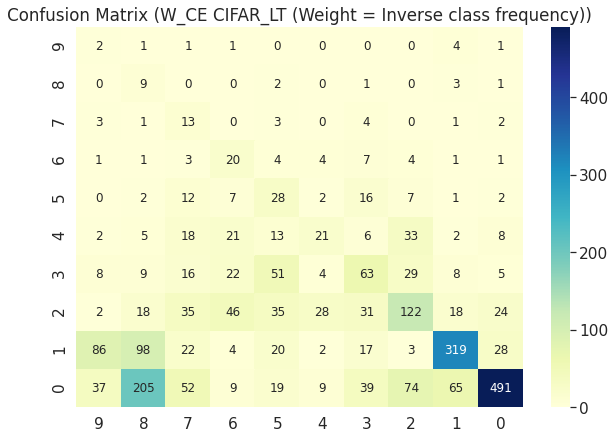

In [ ]:
# Weighted CE (Weight = Frequency) Evaluation
loss_name = "W_CE CIFAR_LT (Weight = Frequency)"
loss_function = Weighted_CrossEntropyLoss_IMP(weights=weights_frequency)
graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequency_bs64_lr0.0001_epoch99"
model_path = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Frequencybest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar = True)

# Weighted CE (Weight = Inverse class frequency) Evaluation
loss_name = "W_CE CIFAR_LT (Weight = Inverse class frequency)"
loss_function = Weighted_CrossEntropyLoss_IMP(weights=weights_inv_frequency)
graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequency_bs64_lr0.0001_epoch99"
model_path = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Inverse_Frequencybest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar = True)

The testing error of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 0_1) is: 0.5609362389023406
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 0_1) is: 1.7746799748677473


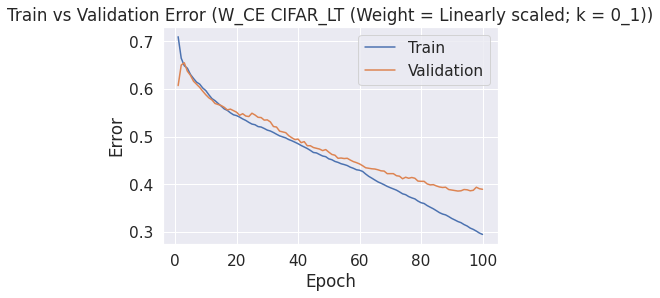

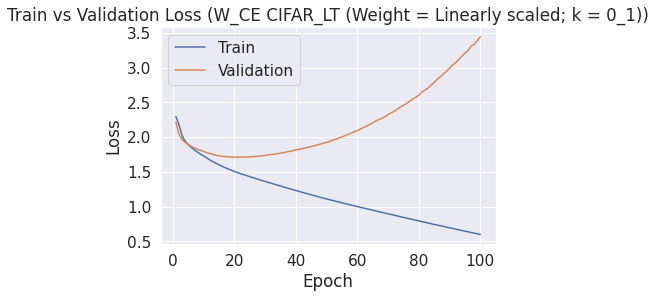

[[493  64  72  37   8  19  11  57 202  37]
 [ 30 317   4  17   2  18   4  22  89  96]
 [ 26  18 134  28  27  26  42  39  17   2]
 [  5   8  29  57   5  52  19  19   9  12]
 [  8   2  37   6  17  12  21  18   5   3]
 [  2   2   5  18   2  26   6  14   2   0]
 [  1   1   4   7   4   4  20   3   1   1]
 [  2   1   0   4   0   3   0  13   1   3]
 [  1   3   0   0   0   3   0   0   9   0]
 [  1   4   0   0   0   0   1   1   1   2]]
              precision    recall  f1-score   support

           0       0.87      0.49      0.63      1000
           1       0.75      0.53      0.62       599
           2       0.47      0.37      0.42       359
           3       0.33      0.27      0.29       215
           4       0.26      0.13      0.18       129
           5       0.16      0.34      0.22        77
           6       0.16      0.43      0.24        46
           7       0.07      0.48      0.12        27
           8       0.03      0.56      0.05        16
           9       0.01     

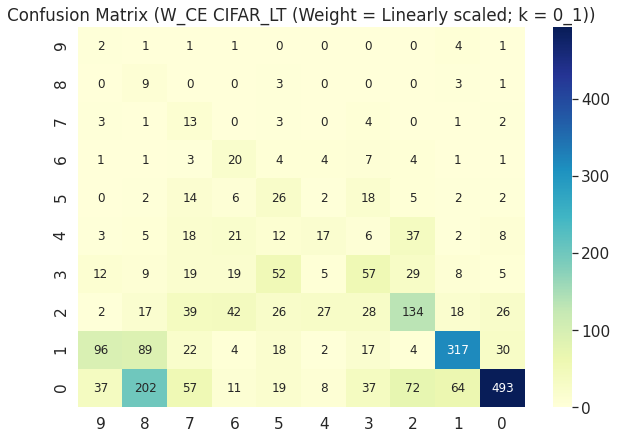

The testing error of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 0_5) is: 0.5682001614205004
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 0_5) is: 8.972786548810127


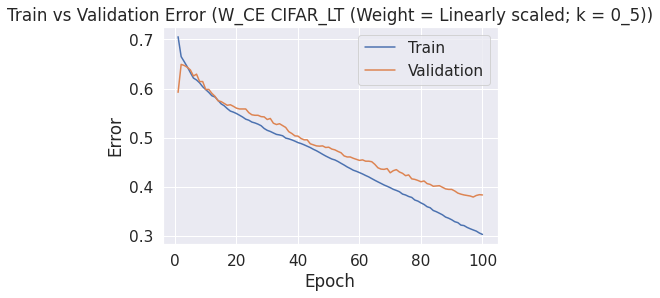

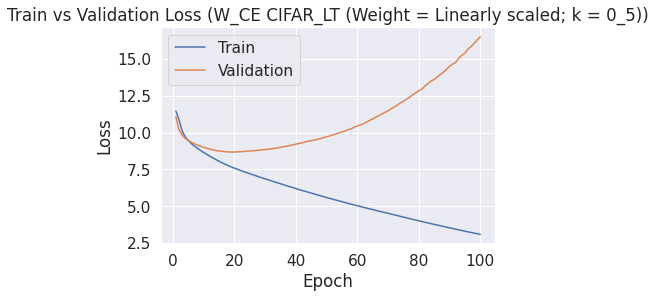

[[481  64  75  35   6  23  14  59 210  33]
 [ 24 306   5  17   2  17   4  24 107  93]
 [ 24  16 128  32  27  29  44  38  19   2]
 [  7   6  31  63   8  43  19  17  10  11]
 [  8   2  30   5  23  13  22  19   6   1]
 [  2   2   9  18   2  24   5  13   2   0]
 [  0   1   4   8   4   3  21   2   2   1]
 [  2   1   0   4   0   3   0  13   1   3]
 [  1   3   0   1   0   2   0   0   9   0]
 [  1   4   0   0   0   0   1   1   1   2]]
              precision    recall  f1-score   support

           0       0.87      0.48      0.62      1000
           1       0.76      0.51      0.61       599
           2       0.45      0.36      0.40       359
           3       0.34      0.29      0.32       215
           4       0.32      0.18      0.23       129
           5       0.15      0.31      0.21        77
           6       0.16      0.46      0.24        46
           7       0.07      0.48      0.12        27
           8       0.02      0.56      0.05        16
           9       0.01     

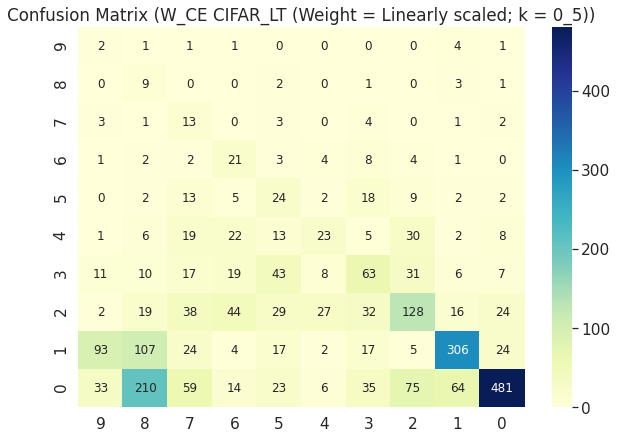

The testing error of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 1_2) is: 0.552865213882163
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 1_2) is: 21.193828741709392


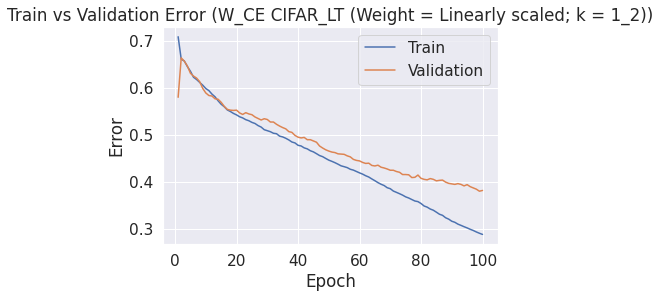

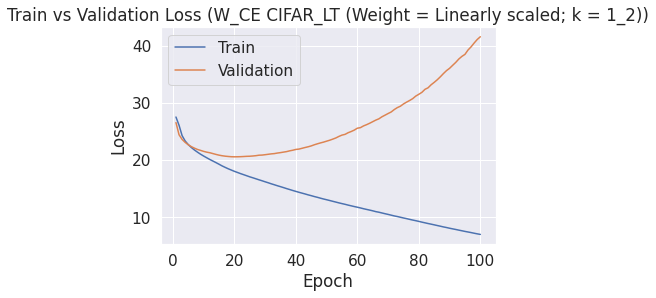

[[501  69  68  34   9  20   8  50 203  38]
 [ 30 329   4  15   2  15   4  22  95  83]
 [ 25  18 123  31  28  32  43  39  18   2]
 [  6   7  29  61   3  50  22  19   8  10]
 [  8   2  28   5  24  13  20  21   5   3]
 [  2   2   7  15   2  26   6  14   2   1]
 [  1   1   3   7   4   4  20   3   2   1]
 [  2   1   0   4   0   3   0  13   1   3]
 [  1   3   0   1   0   2   0   0   9   0]
 [  1   4   0   0   0   0   1   1   1   2]]
              precision    recall  f1-score   support

           0       0.87      0.50      0.64      1000
           1       0.75      0.55      0.64       599
           2       0.47      0.34      0.40       359
           3       0.35      0.28      0.31       215
           4       0.33      0.19      0.24       129
           5       0.16      0.34      0.21        77
           6       0.16      0.43      0.24        46
           7       0.07      0.48      0.12        27
           8       0.03      0.56      0.05        16
           9       0.01     

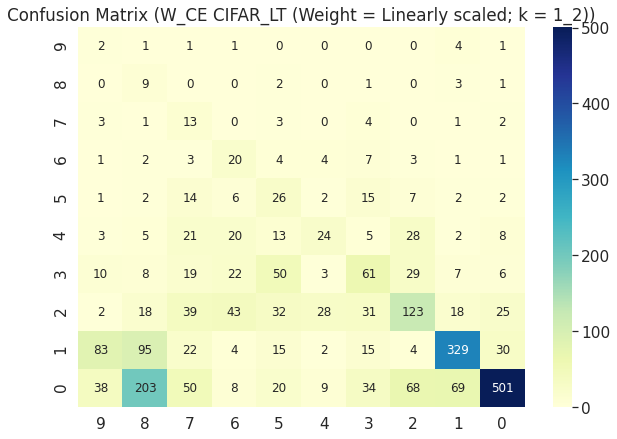

The testing error of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 5) is: 0.5581113801452785
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 5) is: 88.81619922931378


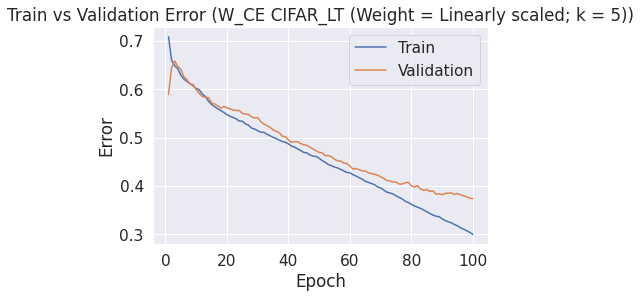

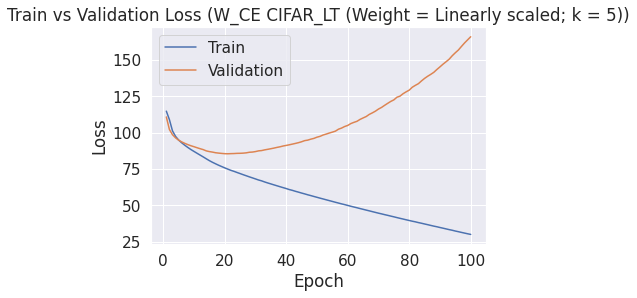

[[494  67  71  38   9  20   9  55 202  35]
 [ 30 311   3  17   2  17   4  25 100  90]
 [ 25  14 133  33  26  28  45  35  17   3]
 [  5   6  30  65   3  50  20  20   8   8]
 [  8   2  31   4  23  14  19  20   5   3]
 [  2   1   7  18   2  24   7  14   2   0]
 [  1   1   4   7   4   4  20   3   1   1]
 [  2   1   0   4   0   4   0  13   0   3]
 [  1   3   0   1   0   2   0   0   9   0]
 [  1   2   0   0   0   0   1   1   2   3]]
              precision    recall  f1-score   support

           0       0.87      0.49      0.63      1000
           1       0.76      0.52      0.62       599
           2       0.48      0.37      0.42       359
           3       0.35      0.30      0.32       215
           4       0.33      0.18      0.23       129
           5       0.15      0.31      0.20        77
           6       0.16      0.43      0.23        46
           7       0.07      0.48      0.12        27
           8       0.03      0.56      0.05        16
           9       0.02     

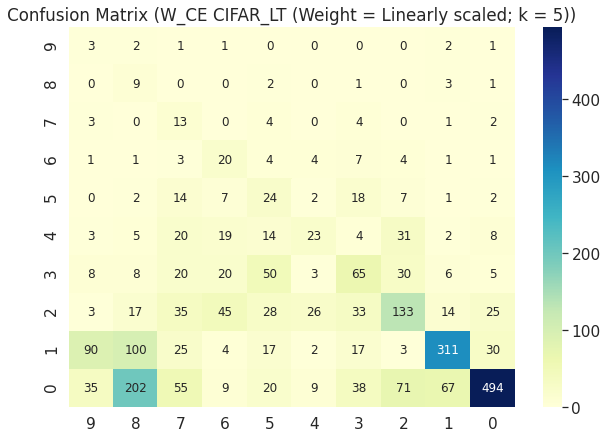

The testing error of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 10) is: 0.5601291364003228
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Linearly scaled; k = 10) is: 178.19350677881485


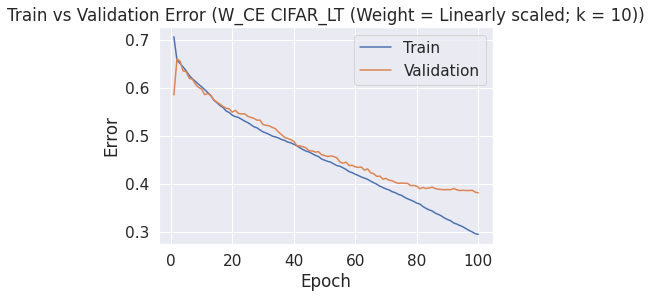

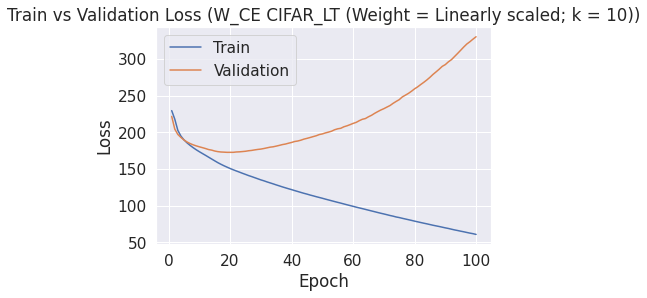

[[513  65  75  34  11  19  10  52 184  37]
 [ 30 301   3  18   2  18   4  24 100  99]
 [ 29  16 132  28  27  29  44  37  15   2]
 [  6   5  31  57   6  53  21  18   8  10]
 [  8   2  34   4  19  13  20  21   5   3]
 [  1   1   7  18   3  24   6  14   2   1]
 [  1   1   4   7   4   4  20   3   1   1]
 [  2   1   0   4   0   3   0  13   1   3]
 [  1   3   0   1   0   2   0   0   9   0]
 [  1   4   0   0   0   0   1   1   1   2]]
              precision    recall  f1-score   support

           0       0.87      0.51      0.64      1000
           1       0.75      0.50      0.60       599
           2       0.46      0.37      0.41       359
           3       0.33      0.27      0.30       215
           4       0.26      0.15      0.19       129
           5       0.15      0.31      0.20        77
           6       0.16      0.43      0.23        46
           7       0.07      0.48      0.12        27
           8       0.03      0.56      0.05        16
           9       0.01     

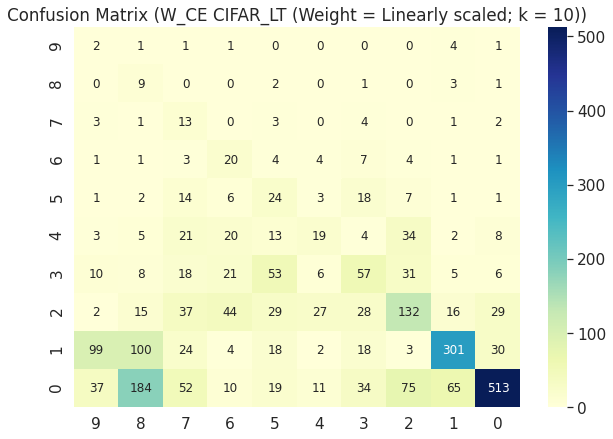

In [ ]:
# Weighted CE (Weight = Linearly scaled k>0) Evaluation
K = [0.1, 0.5, 1.2, 5, 10]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

for k in K:
  temp = []
  for i in weights_frequency:
    temp.append(k/i)
  k_name = str(k).replace(".","_")
  loss_name = "W_CE CIFAR_LT (Weight = Linearly scaled; k = {})".format(k_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_{}_bs64_lr0.0001_epoch99".format(k_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Linearly_Scaled_K_{}best_val_loss".format(k_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 1) is: 0.33171912832929784
The testing loss of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 1) is: 2.147370765606562


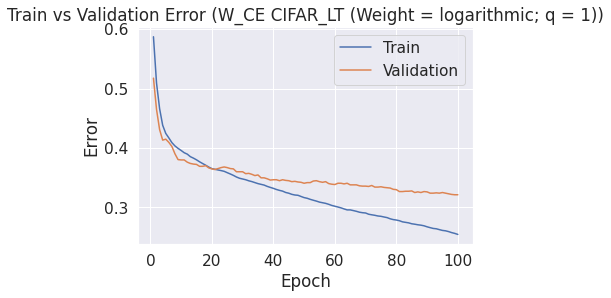

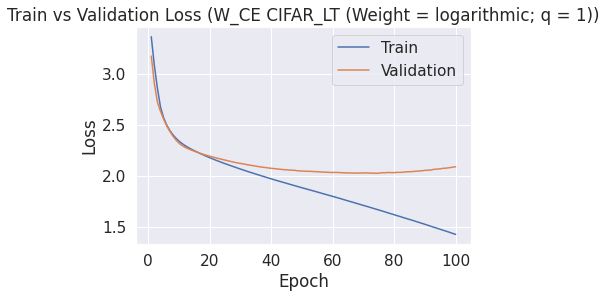

[[766 110  60  27   9   8   2   5   8   5]
 [ 39 542   3   6   1   1   2   1   1   3]
 [ 48  22 173  47  34  20   6   5   3   1]
 [ 19  15  38 111   7  16   2   7   0   0]
 [ 13   8  45  23  27   4   3   5   0   1]
 [  4   5   8  34   2  20   2   2   0   0]
 [  1   5   7  20   2   3   7   1   0   0]
 [  3   3   1   5   3   2   0   9   0   1]
 [  7   6   0   2   0   0   0   0   1   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.85      0.77      0.80      1000
           1       0.75      0.90      0.82       599
           2       0.52      0.48      0.50       359
           3       0.40      0.52      0.45       215
           4       0.32      0.21      0.25       129
           5       0.27      0.26      0.26        77
           6       0.29      0.15      0.20        46
           7       0.26      0.33      0.29        27
           8       0.08      0.06      0.07        16
           9       0.00     

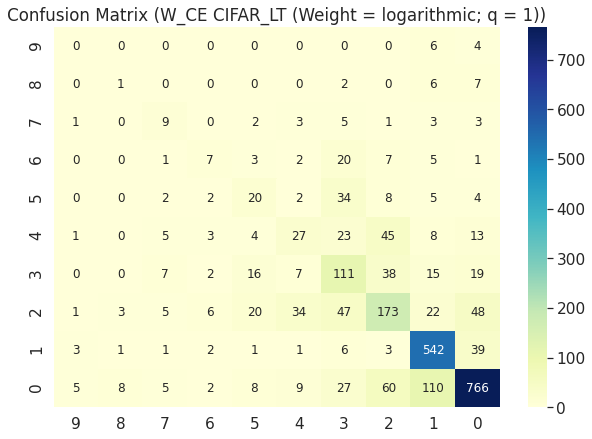

The testing error of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 2) is: 0.31275221953188054
The testing loss of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 2) is: 2.8001458981098275


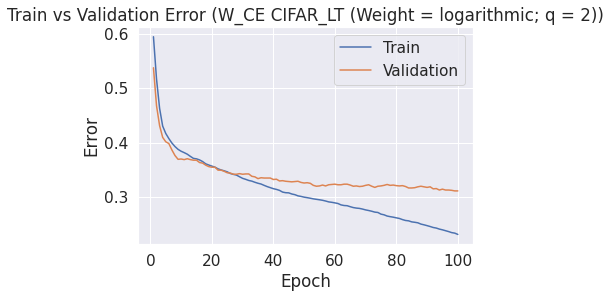

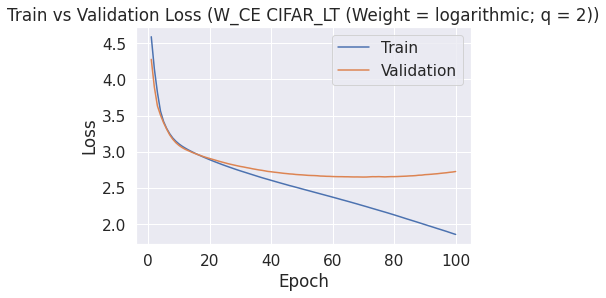

[[846  79  36  19   4   4   3   3   3   3]
 [ 61 525   2   6   0   1   0   1   0   3]
 [ 71  22 174  44  23  13   6   4   1   1]
 [ 26  17  38 108   7  11   1   7   0   0]
 [ 16   8  49  22  24   3   0   6   0   1]
 [  5   5  10  36   3  15   1   2   0   0]
 [  2   8   9  17   1   1   7   1   0   0]
 [  8   3   2   6   3   1   0   4   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1000
           1       0.77      0.88      0.82       599
           2       0.54      0.48      0.51       359
           3       0.42      0.50      0.45       215
           4       0.37      0.19      0.25       129
           5       0.31      0.19      0.24        77
           6       0.39      0.15      0.22        46
           7       0.14      0.15      0.15        27
           8       0.00      0.00      0.00        16
           9       0.00     

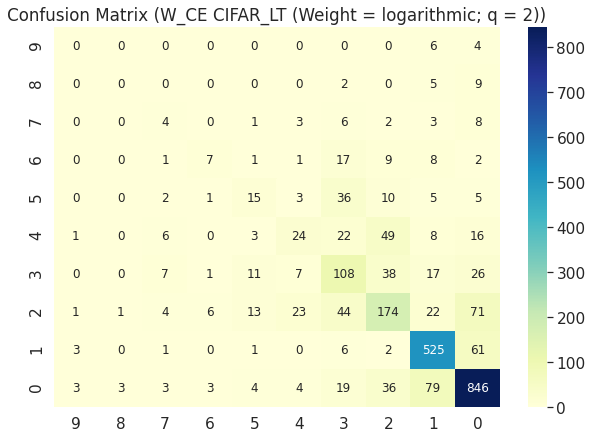

The testing error of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 5) is: 0.30871670702179177
The testing loss of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 5) is: 3.6928444795119457


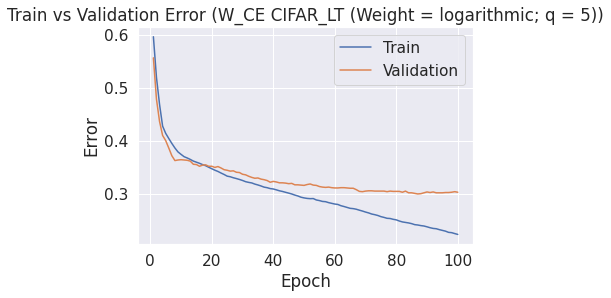

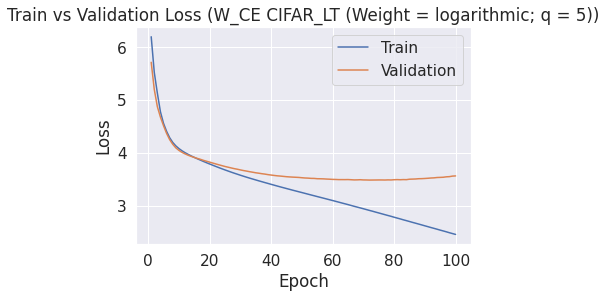

[[875  65  28  24   3   2   0   1   0   2]
 [ 69 517   1   9   0   1   0   1   0   1]
 [ 73  21 172  49  25   9   4   4   1   1]
 [ 30  18  38 106   6  13   1   3   0   0]
 [ 17   9  50  23  22   2   0   5   0   1]
 [  6   4  12  34   4  14   2   1   0   0]
 [  4   5   9  19   1   2   4   2   0   0]
 [ 11   3   2   6   1   1   0   3   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.80      0.88      0.83      1000
           1       0.79      0.86      0.83       599
           2       0.55      0.48      0.51       359
           3       0.39      0.49      0.44       215
           4       0.35      0.17      0.23       129
           5       0.32      0.18      0.23        77
           6       0.36      0.09      0.14        46
           7       0.15      0.11      0.13        27
           8       0.00      0.00      0.00        16
           9       0.00     

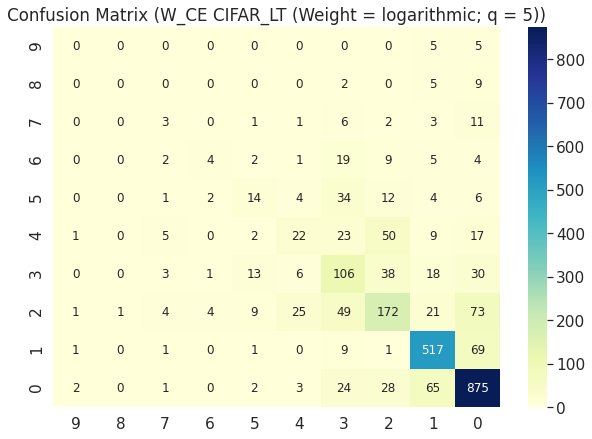

The testing error of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 10) is: 0.30669895076674736
The testing loss of the model trained using W_CE CIFAR_LT (Weight = logarithmic; q = 10) is: 4.363629422126672


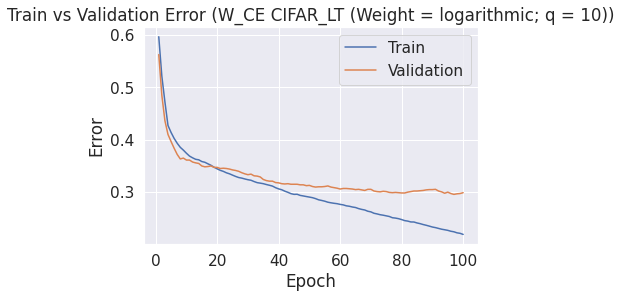

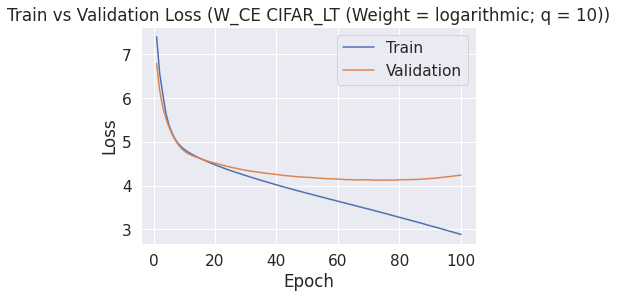

[[876  74  25  20   0   2   0   0   0   3]
 [ 66 521   2   7   0   1   0   1   0   1]
 [ 82  23 171  48  20   8   4   2   1   0]
 [ 30  19  33 111   7  13   0   2   0   0]
 [ 19   8  53  26  17   2   0   4   0   0]
 [  8   4  13  34   3  13   1   1   0   0]
 [  4   7   6  19   4   1   5   0   0   0]
 [ 13   2   1   5   1   1   0   4   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.79      0.88      0.83      1000
           1       0.78      0.87      0.82       599
           2       0.56      0.48      0.52       359
           3       0.41      0.52      0.46       215
           4       0.33      0.13      0.19       129
           5       0.32      0.17      0.22        77
           6       0.50      0.11      0.18        46
           7       0.29      0.15      0.20        27
           8       0.00      0.00      0.00        16
           9       0.00     

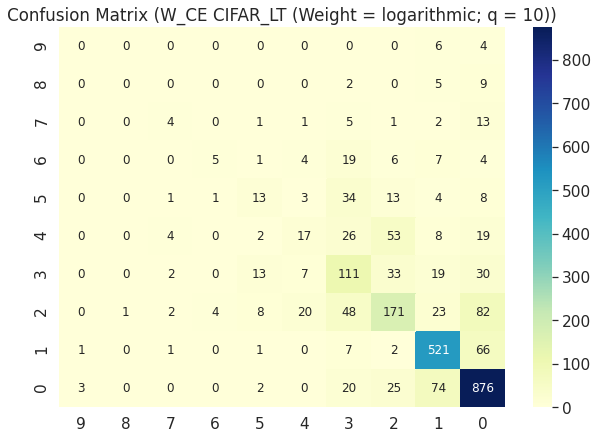

In [ ]:
# Weighted CE (Weight = logarithmic q>frequency) Evaluation
# Remove 0.5 here because the result is infeasible
Q = [1, 2, 5, 10]
weights_frequency = []
for i in count:
  weights_frequency.append(i/sum(count))

for q in Q:
  temp = []
  for i in weights_frequency:
    temp.append(math.log(q/i))
  q_name = str(q).replace(".","_")
  loss_name = "W_CE CIFAR_LT (Weight = logarithmic; q = {})".format(q_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_{}_bs64_lr0.0001_epoch99".format(q_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Logarithmic_Q_{}best_val_loss".format(q_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9) is: 0.30710250201775624
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9) is: 9.11444164545108


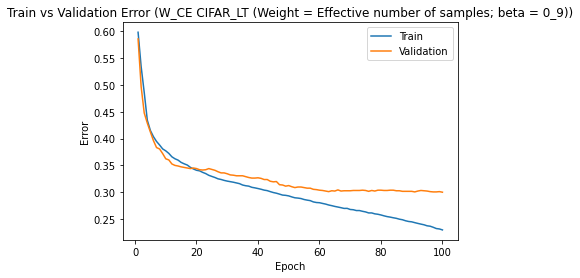

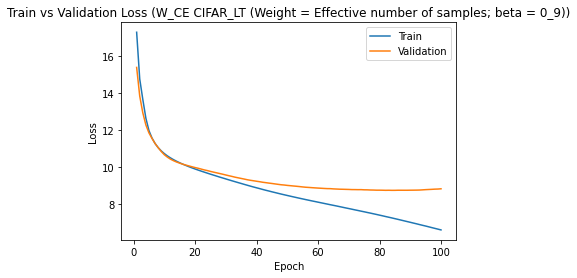

[[901  55  28  14   0   1   0   0   0   1]
 [ 81 504   5   8   0   1   0   0   0   0]
 [ 93  18 180  44  14   6   2   2   0   0]
 [ 34  17  48 101   8   6   0   1   0   0]
 [ 26   5  62  19  15   2   0   0   0   0]
 [ 11   4  13  35   1  12   1   0   0   0]
 [  5   7   9  18   3   1   3   0   0   0]
 [ 13   3   3   7   0   0   0   1   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.83      1000
           1       0.81      0.84      0.82       599
           2       0.52      0.50      0.51       359
           3       0.41      0.47      0.44       215
           4       0.37      0.12      0.18       129
           5       0.41      0.16      0.23        77
           6       0.50      0.07      0.12        46
           7       0.25      0.04      0.06        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


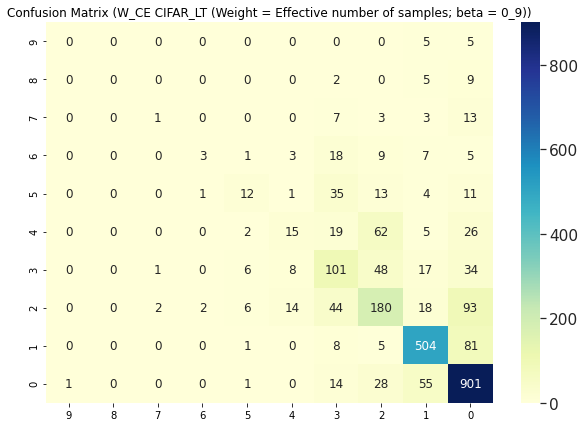

The testing error of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9) is: 0.30710250201775624
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9) is: 9.11444164545108


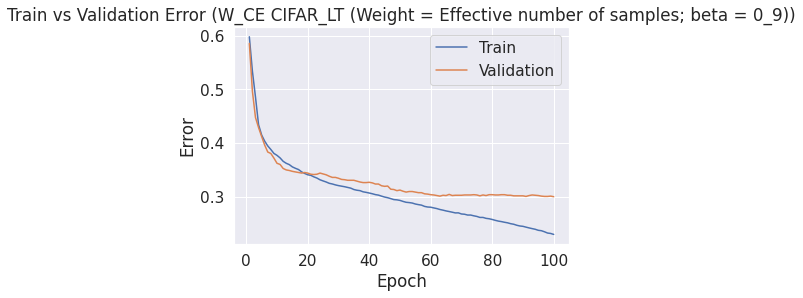

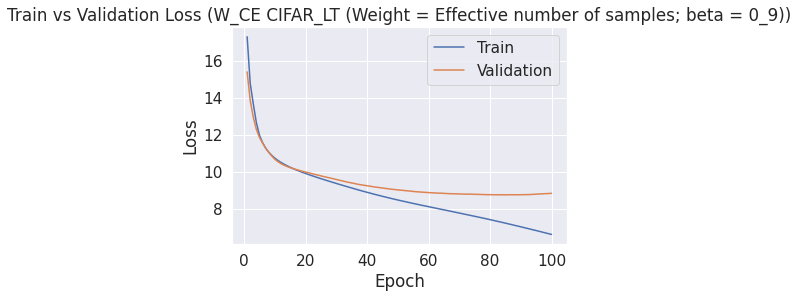

[[901  55  28  14   0   1   0   0   0   1]
 [ 81 504   5   8   0   1   0   0   0   0]
 [ 93  18 180  44  14   6   2   2   0   0]
 [ 34  17  48 101   8   6   0   1   0   0]
 [ 26   5  62  19  15   2   0   0   0   0]
 [ 11   4  13  35   1  12   1   0   0   0]
 [  5   7   9  18   3   1   3   0   0   0]
 [ 13   3   3   7   0   0   0   1   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.83      1000
           1       0.81      0.84      0.82       599
           2       0.52      0.50      0.51       359
           3       0.41      0.47      0.44       215
           4       0.37      0.12      0.18       129
           5       0.41      0.16      0.23        77
           6       0.50      0.07      0.12        46
           7       0.25      0.04      0.06        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


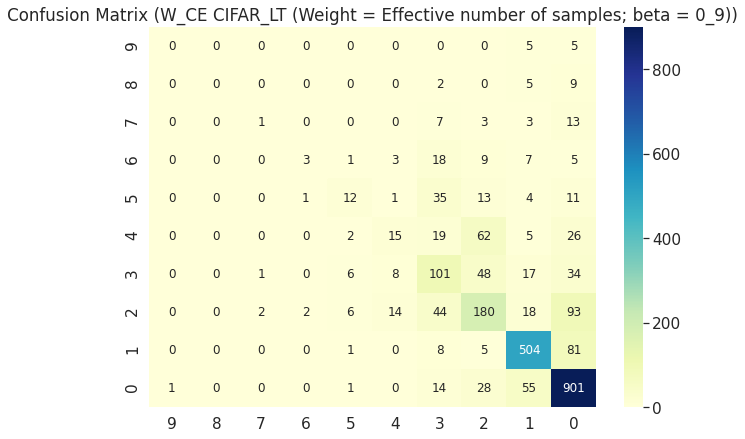

The testing error of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_999) is: 0.31517352703793383
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_999) is: 545.4825038420848


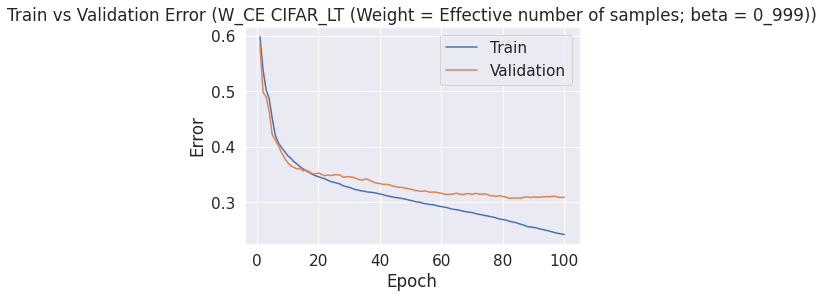

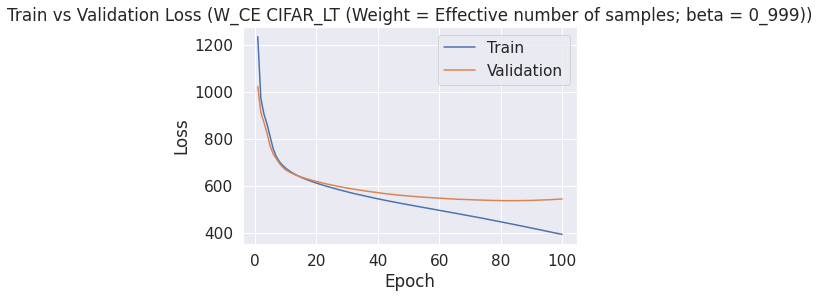

[[920  43  25  12   0   0   0   0   0   0]
 [105 483   6   5   0   0   0   0   0   0]
 [110  19 201  29   0   0   0   0   0   0]
 [ 48  17  60  90   0   0   0   0   0   0]
 [ 36   4  73  13   3   0   0   0   0   0]
 [ 13   6  23  35   0   0   0   0   0   0]
 [  5   8  18  15   0   0   0   0   0   0]
 [ 17   3   2   5   0   0   0   0   0   0]
 [  8   6   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.73      0.92      0.81      1000
           1       0.81      0.81      0.81       599
           2       0.49      0.56      0.52       359
           3       0.44      0.42      0.43       215
           4       1.00      0.02      0.05       129
           5       0.00      0.00      0.00        77
           6       0.00      0.00      0.00        46
           7       0.00      0.00      0.00        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


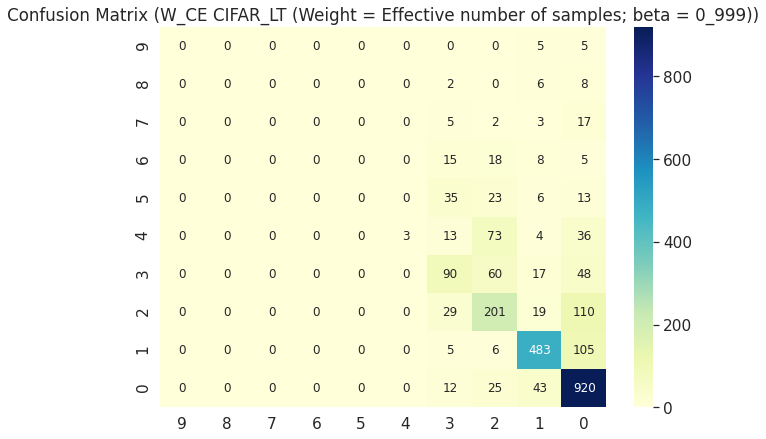

The testing error of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9999) is: 0.3216303470540759
The testing loss of the model trained using W_CE CIFAR_LT (Weight = Effective number of samples; beta = 0_9999) is: 1102.6771169809194


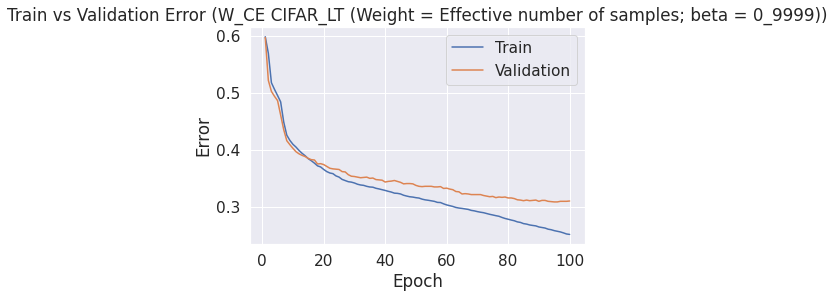

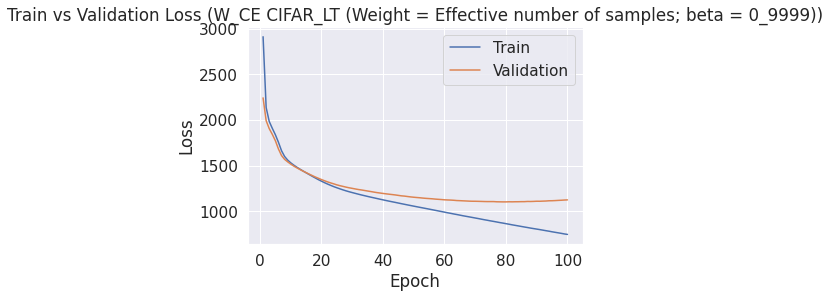

[[937  37  18   8   0   0   0   0   0   0]
 [ 96 498   3   2   0   0   0   0   0   0]
 [148  11 178  22   0   0   0   0   0   0]
 [ 66  21  60  68   0   0   0   0   0   0]
 [ 44   5  70  10   0   0   0   0   0   0]
 [ 22   8  18  29   0   0   0   0   0   0]
 [ 10   8  19   9   0   0   0   0   0   0]
 [ 19   2   2   4   0   0   0   0   0   0]
 [  8   7   0   1   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.69      0.94      0.80      1000
           1       0.83      0.83      0.83       599
           2       0.48      0.50      0.49       359
           3       0.44      0.32      0.37       215
           4       0.00      0.00      0.00       129
           5       0.00      0.00      0.00        77
           6       0.00      0.00      0.00        46
           7       0.00      0.00      0.00        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


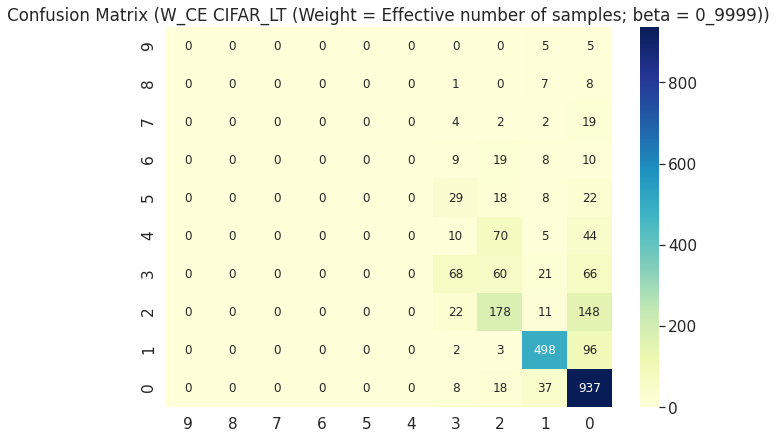

In [ ]:
# Weighted CE (Weight = Effective number of samples) Evaluation
Betas = [0.9,0.9,0.999,0.9999]
for b in Betas:
  temp = []
  for i in count:
    temp.append((1-b**i)/(1-b))
  b_name = str(b).replace(".","_")
  loss_name = "W_CE CIFAR_LT (Weight = Effective number of samples; beta = {})".format(b_name)
  loss_function = Weighted_CrossEntropyLoss_IMP(weights=temp)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_{}_bs64_lr0.0001_epoch99".format(b_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_Weighted_CrossEntropyLoss_IMP_Objective_Class_Beta_{}best_val_loss".format(b_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using FocalLoss CIFAR_LT (gamma = 0) is: 0.3018563357546408
The testing loss of the model trained using FocalLoss CIFAR_LT (gamma = 0) is: 0.9181655679757779


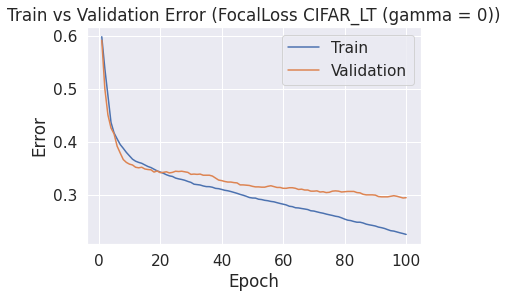

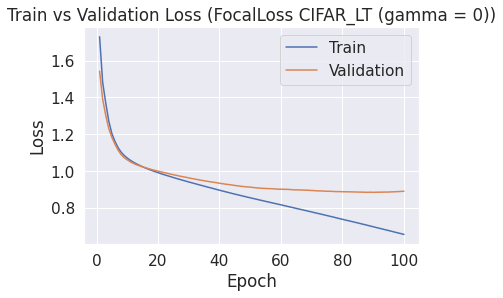

[[902  52  30  15   0   0   1   0   0   0]
 [ 86 501   5   5   0   1   1   0   0   0]
 [ 94  17 183  38  16   6   2   3   0   0]
 [ 35  17  40 103   6  11   1   2   0   0]
 [ 25   4  62  14  23   1   0   0   0   0]
 [ 11   4  14  32   1  12   2   1   0   0]
 [  6   6   8  20   2   0   4   0   0   0]
 [ 13   4   1   5   2   0   0   2   0   0]
 [  8   6   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.83      1000
           1       0.81      0.84      0.82       599
           2       0.53      0.51      0.52       359
           3       0.44      0.48      0.46       215
           4       0.46      0.18      0.26       129
           5       0.39      0.16      0.22        77
           6       0.36      0.09      0.14        46
           7       0.25      0.07      0.11        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


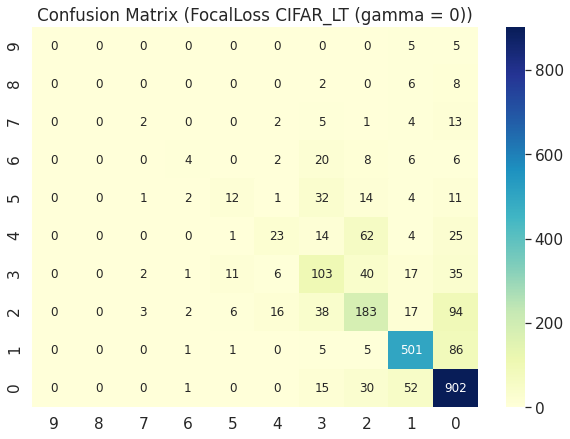

The testing error of the model trained using FocalLoss CIFAR_LT (gamma = 0_5) is: 0.3042776432606941
The testing loss of the model trained using FocalLoss CIFAR_LT (gamma = 0_5) is: 0.7636087693465061


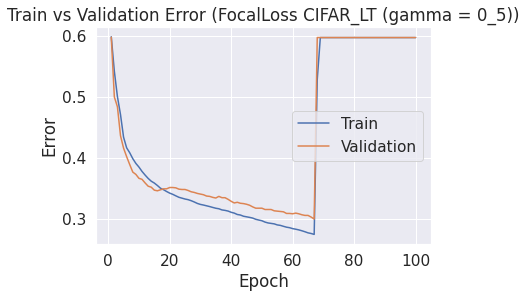

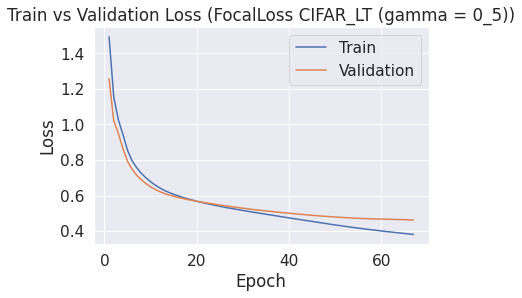

[[920  34  27  19   0   0   0   0   0   0]
 [101 482   7   8   0   1   0   0   0   0]
 [106   9 207  28   4   5   0   0   0   0]
 [ 47   9  62  95   0   2   0   0   0   0]
 [ 25   6  77  14   7   0   0   0   0   0]
 [  9   4  21  34   1   8   0   0   0   0]
 [  5   2  16  18   1   0   4   0   0   0]
 [ 13   3   3   5   0   2   0   1   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.74      0.92      0.82      1000
           1       0.86      0.80      0.83       599
           2       0.49      0.58      0.53       359
           3       0.43      0.44      0.43       215
           4       0.54      0.05      0.10       129
           5       0.44      0.10      0.17        77
           6       1.00      0.09      0.16        46
           7       1.00      0.04      0.07        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


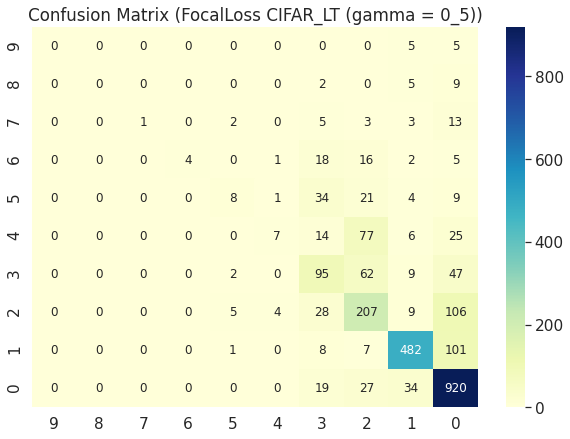

The testing error of the model trained using FocalLoss CIFAR_LT (gamma = 1) is: 0.2966101694915254
The testing loss of the model trained using FocalLoss CIFAR_LT (gamma = 1) is: 0.588316057737057


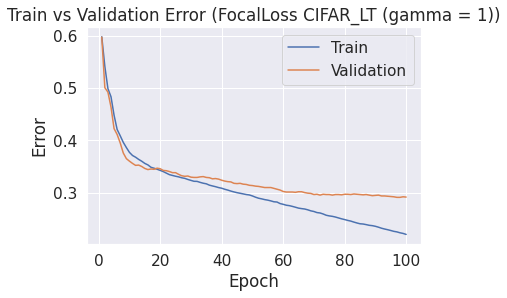

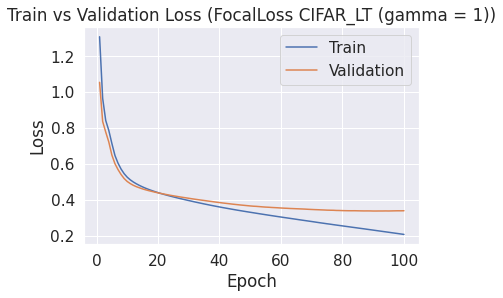

[[918  30  32  20   0   0   0   0   0   0]
 [103 472  12   9   0   2   1   0   0   0]
 [ 85   9 210  36  10   6   2   1   0   0]
 [ 39  10  47 108   4   5   0   2   0   0]
 [ 21   4  68  15  20   0   1   0   0   0]
 [  9   4  15  38   1  10   0   0   0   0]
 [  3   6  11  19   3   0   4   0   0   0]
 [ 14   1   2   6   1   2   0   1   0   0]
 [ 10   4   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.92      0.83      1000
           1       0.87      0.79      0.83       599
           2       0.53      0.58      0.56       359
           3       0.43      0.50      0.46       215
           4       0.51      0.16      0.24       129
           5       0.40      0.13      0.20        77
           6       0.50      0.09      0.15        46
           7       0.25      0.04      0.06        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


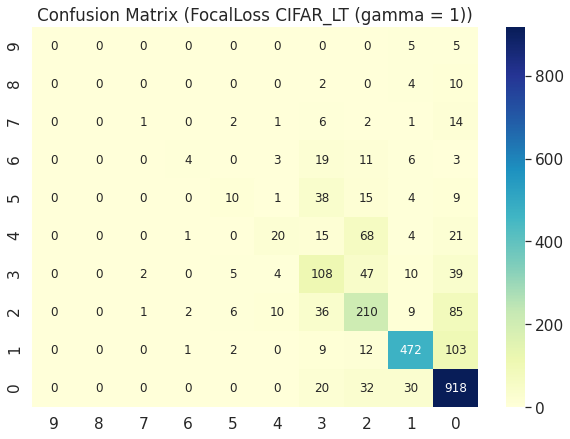

The testing error of the model trained using FocalLoss CIFAR_LT (gamma = 2) is: 0.29055690072639223
The testing loss of the model trained using FocalLoss CIFAR_LT (gamma = 2) is: 0.4448887016266011


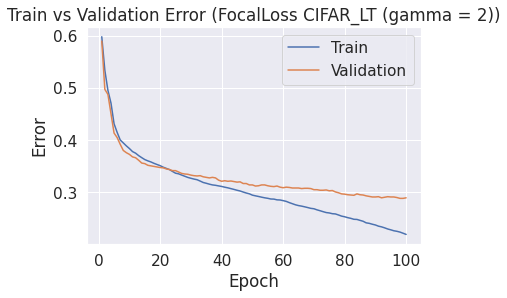

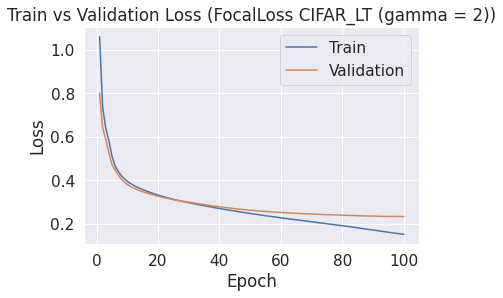

[[927  30  30  11   1   0   1   0   0   0]
 [ 90 490   7  10   0   1   1   0   0   0]
 [ 96  12 188  36  18   8   1   0   0   0]
 [ 38  12  42 107   5   9   0   2   0   0]
 [ 26   5  52  17  28   1   0   0   0   0]
 [  8   3  14  39   1  11   1   0   0   0]
 [  6   5  13  15   1   0   6   0   0   0]
 [ 14   0   2   8   0   2   0   1   0   0]
 [ 10   4   0   2   0   0   0   0   0   0]
 [  6   3   0   1   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.93      0.83      1000
           1       0.87      0.82      0.84       599
           2       0.54      0.52      0.53       359
           3       0.43      0.50      0.46       215
           4       0.52      0.22      0.31       129
           5       0.34      0.14      0.20        77
           6       0.60      0.13      0.21        46
           7       0.33      0.04      0.07        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


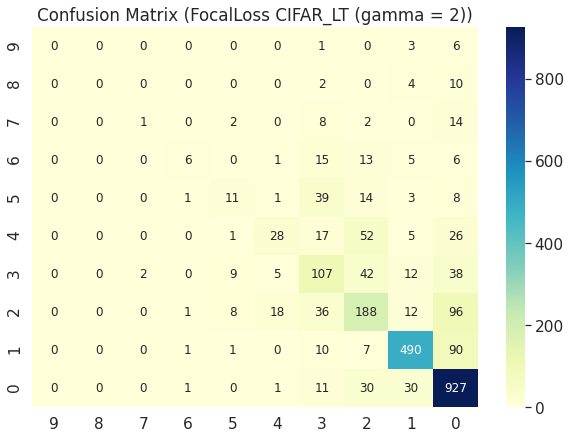

The testing error of the model trained using FocalLoss CIFAR_LT (gamma = 5) is: 0.307909604519774
The testing loss of the model trained using FocalLoss CIFAR_LT (gamma = 5) is: 0.2696068927120322


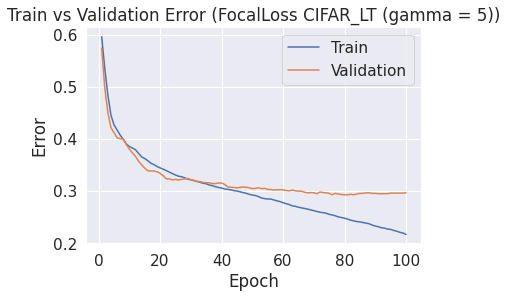

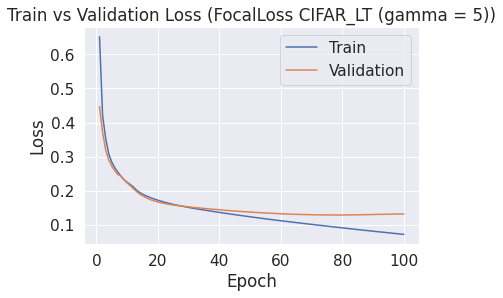

[[894  39  42  18   5   0   2   0   0   0]
 [115 463  10   9   0   1   1   0   0   0]
 [ 85  10 185  42  19  13   5   0   0   0]
 [ 29  10  38 107  11  16   2   2   0   0]
 [ 15   6  49  16  42   0   1   0   0   0]
 [  7   2  11  38   2  15   2   0   0   0]
 [  6   3   6  16   8   1   6   0   0   0]
 [ 10   2   2   7   0   3   0   3   0   0]
 [ 10   4   0   2   0   0   0   0   0   0]
 [  7   3   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.89      0.82      1000
           1       0.85      0.77      0.81       599
           2       0.54      0.52      0.53       359
           3       0.42      0.50      0.46       215
           4       0.48      0.33      0.39       129
           5       0.31      0.19      0.24        77
           6       0.32      0.13      0.18        46
           7       0.60      0.11      0.19        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


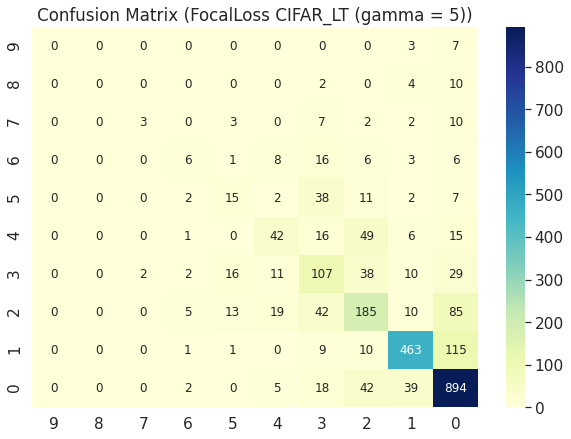

In [ ]:
# FocalLoss Evaluation
gamma_list = [0, 0.5, 1, 2, 5]
for g in gamma_list:
  g_name = str(g).replace(".","_")
  loss_name = "FocalLoss CIFAR_LT (gamma = {})".format(g_name)
  loss_function = FocalLoss_IMP(gamma = g)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_{}_bs64_lr0.0001_epoch99".format(g_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_FocalLoss_IMP_GAMMA_{}best_val_loss".format(g_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using SparseMax CIFAR_LT Loss is: 0.2929782082324455
The testing loss of the model trained using SparseMax CIFAR_LT Loss is: 0.21017235192732933


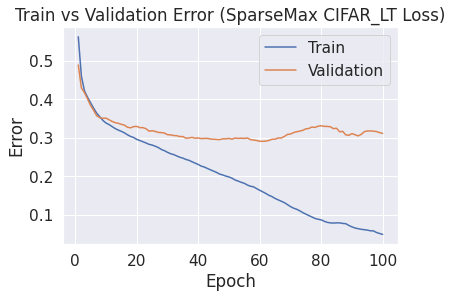

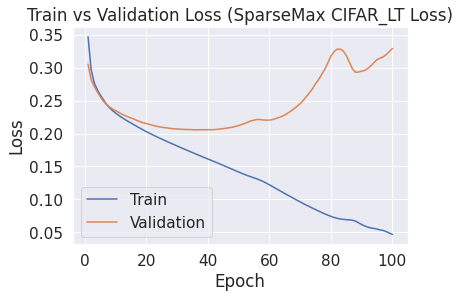

[[928  41  19  12   0   0   0   0   0   0]
 [ 76 513   1   8   0   1   0   0   0   0]
 [121  14 187  29   1   6   1   0   0   0]
 [ 49  14  44 104   1   3   0   0   0   0]
 [ 36   7  60  19   7   0   0   0   0   0]
 [ 14   5  11  35   0  12   0   0   0   0]
 [  9   6   9  20   1   0   1   0   0   0]
 [ 13   3   2   6   0   3   0   0   0   0]
 [ 10   5   0   1   0   0   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.74      0.93      0.82      1000
           1       0.84      0.86      0.85       599
           2       0.56      0.52      0.54       359
           3       0.44      0.48      0.46       215
           4       0.70      0.05      0.10       129
           5       0.48      0.16      0.24        77
           6       0.50      0.02      0.04        46
           7       0.00      0.00      0.00        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


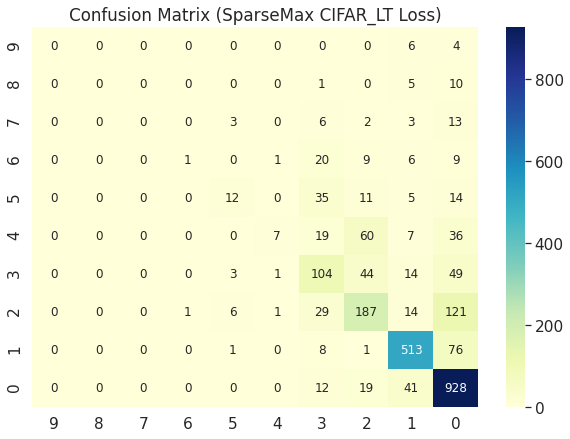

In [ ]:
# SparseMax Loss Evaluation
loss_name = "SparseMax CIFAR_LT Loss"
loss_function = Sparsemax_Loss_IMP()
graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMP_bs64_lr0.0001_epoch99"
model_path = "CIFAR_LT_Loss_Function_Evaluation_SparseMax_IMPbest_val_loss"
Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using LDAM CIFAR_LT (Normalized; C = 0_1) is: 0.30548829701372077
The testing loss of the model trained using LDAM CIFAR_LT (Normalized; C = 0_1) is: 0.9357573756804833


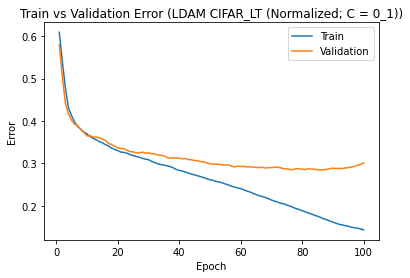

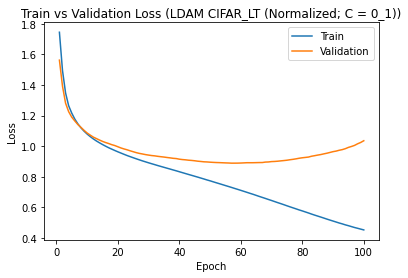

[[905  52  23  16   1   0   3   0   0   0]
 [104 485   3   5   1   1   0   0   0   0]
 [101  13 187  42   8   6   2   0   0   0]
 [ 37  16  41 113   4   4   0   0   0   0]
 [ 40   6  54  16  13   0   0   0   0   0]
 [ 14   5  12  34   2  10   0   0   0   0]
 [  5   5  12  15   1   0   8   0   0   0]
 [ 16   1   2   6   0   2   0   0   0   0]
 [  9   5   0   1   0   1   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.73      0.91      0.81      1000
           1       0.82      0.81      0.81       599
           2       0.56      0.52      0.54       359
           3       0.46      0.53      0.49       215
           4       0.43      0.10      0.16       129
           5       0.42      0.13      0.20        77
           6       0.62      0.17      0.27        46
           7       0.00      0.00      0.00        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


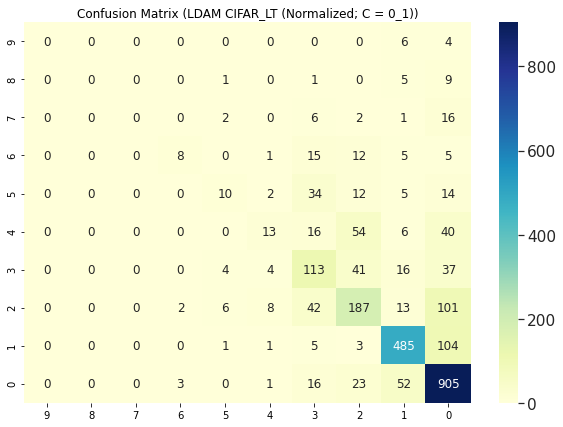

The testing error of the model trained using LDAM CIFAR_LT (Normalized; C = 0_5) is: 0.30024213075060535
The testing loss of the model trained using LDAM CIFAR_LT (Normalized; C = 0_5) is: 0.9893364447813767


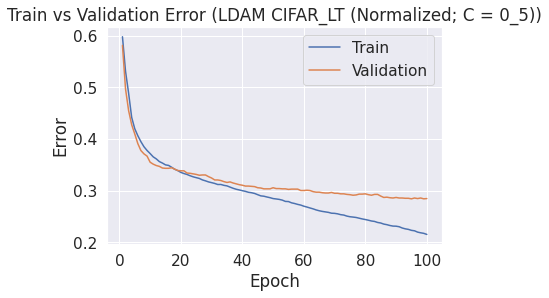

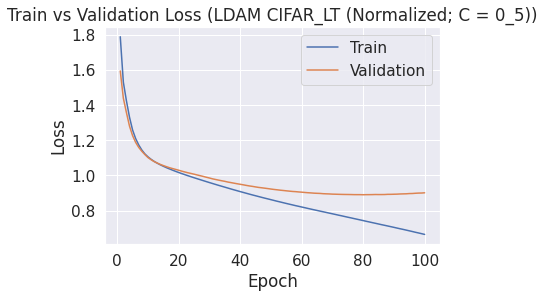

[[898  51  35  14   0   1   1   0   0   0]
 [ 86 501   6   4   0   1   1   0   0   0]
 [ 96  16 195  32  14   3   1   2   0   0]
 [ 33  16  50 100   7   6   1   2   0   0]
 [ 23   7  62  14  22   0   1   0   0   0]
 [  9   4  16  35   2  10   1   0   0   0]
 [  5   6  11  14   3   1   6   0   0   0]
 [ 13   1   2   6   1   2   0   2   0   0]
 [  8   6   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.83      1000
           1       0.82      0.84      0.83       599
           2       0.52      0.54      0.53       359
           3       0.45      0.47      0.46       215
           4       0.45      0.17      0.25       129
           5       0.42      0.13      0.20        77
           6       0.50      0.13      0.21        46
           7       0.33      0.07      0.12        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


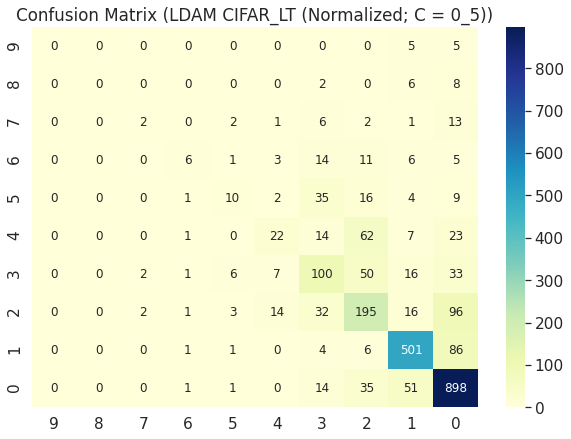

The testing error of the model trained using LDAM CIFAR_LT (Normalized; C = 1) is: 0.307909604519774
The testing loss of the model trained using LDAM CIFAR_LT (Normalized; C = 1) is: 1.1062387931041229


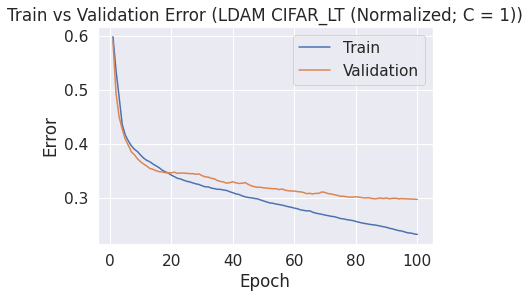

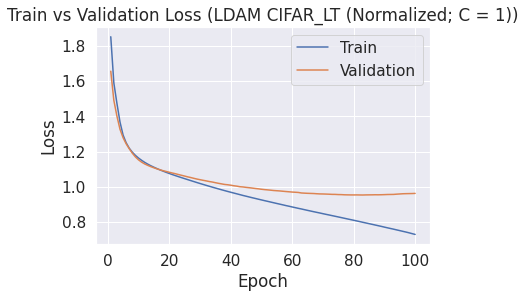

[[905  53  30  11   0   1   0   0   0   0]
 [ 93 495   5   5   0   1   0   0   0   0]
 [ 97  17 186  39  13   4   2   1   0   0]
 [ 37  15  45 102   7   6   1   2   0   0]
 [ 32   4  63  15  13   2   0   0   0   0]
 [ 11   4  20  30   1  10   1   0   0   0]
 [  6   8  11  15   2   1   3   0   0   0]
 [ 15   2   2   6   1   0   0   1   0   0]
 [  8   6   0   2   0   0   0   0   0   0]
 [  6   4   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.75      0.91      0.82      1000
           1       0.81      0.83      0.82       599
           2       0.51      0.52      0.52       359
           3       0.45      0.47      0.46       215
           4       0.35      0.10      0.16       129
           5       0.40      0.13      0.20        77
           6       0.43      0.07      0.11        46
           7       0.25      0.04      0.06        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


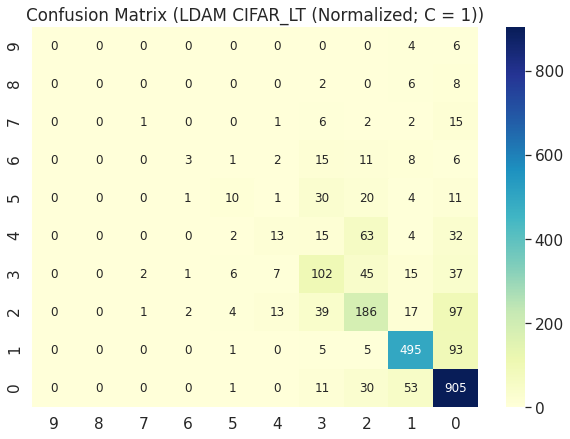

In [ ]:
# LDAM - Normalized Evaluation
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  loss_name = "LDAM CIFAR_LT (Normalized; C = {})".format(c_name)
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=True)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_{}_bs64_lr0.0001_epoch99".format(c_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Normalized_C_{}best_val_loss".format(c_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)

The testing error of the model trained using LDAM CIFAR_LT (Non Normalized; C = 0_1) is: 0.2970137207425343
The testing loss of the model trained using LDAM CIFAR_LT (Non Normalized; C = 0_1) is: 0.9151173115540774


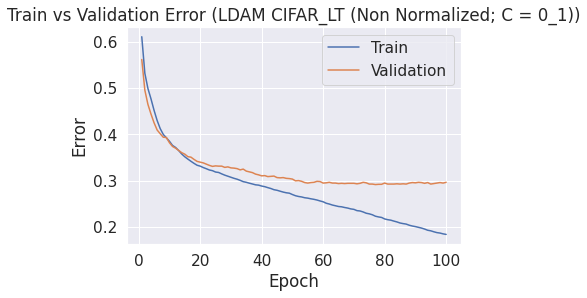

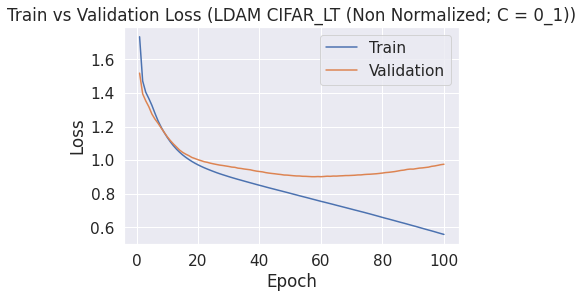

[[902  63  22  10   1   0   2   0   0   0]
 [ 76 512   6   5   0   0   0   0   0   0]
 [ 96  24 193  33   7   6   0   0   0   0]
 [ 43  21  39 105   3   3   0   1   0   0]
 [ 34  10  58  13  14   0   0   0   0   0]
 [ 10   5  12  38   2  10   0   0   0   0]
 [  6   6  12  11   5   1   5   0   0   0]
 [ 10   5   2   6   0   3   0   1   0   0]
 [  8   7   0   1   0   0   0   0   0   0]
 [  4   6   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.82      1000
           1       0.78      0.85      0.81       599
           2       0.56      0.54      0.55       359
           3       0.47      0.49      0.48       215
           4       0.44      0.11      0.17       129
           5       0.43      0.13      0.20        77
           6       0.71      0.11      0.19        46
           7       0.50      0.04      0.07        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


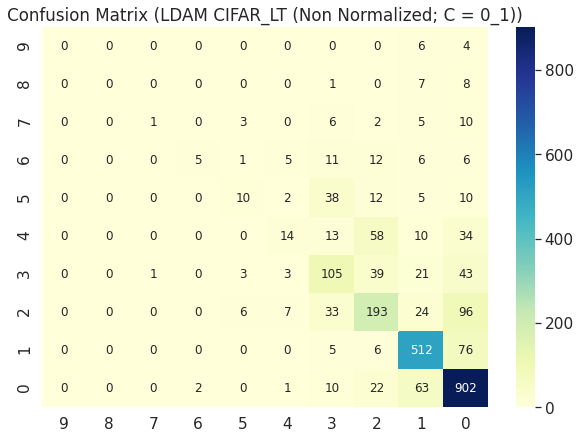

The testing error of the model trained using LDAM CIFAR_LT (Non Normalized; C = 0_5) is: 0.29620661824051653
The testing loss of the model trained using LDAM CIFAR_LT (Non Normalized; C = 0_5) is: 0.9251013409632903


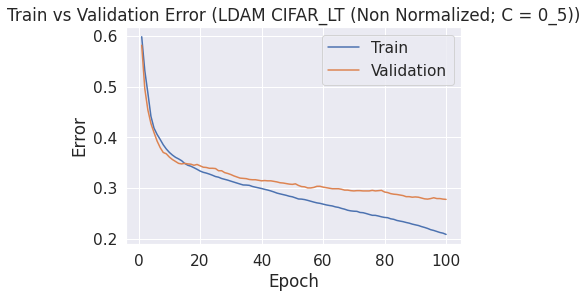

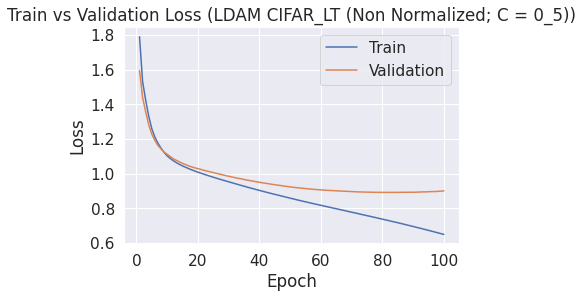

[[900  50  35  13   0   1   1   0   0   0]
 [ 79 509   5   4   0   1   1   0   0   0]
 [101  18 182  31  16   7   4   0   0   0]
 [ 34  14  40 109   7   9   0   2   0   0]
 [ 27   7  60  10  22   2   0   1   0   0]
 [ 10   4  12  33   3  14   1   0   0   0]
 [  6   6  10  15   3   1   5   0   0   0]
 [ 12   2   1   5   2   2   0   3   0   0]
 [  9   5   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.76      0.90      0.82      1000
           1       0.82      0.85      0.84       599
           2       0.53      0.51      0.52       359
           3       0.49      0.51      0.50       215
           4       0.42      0.17      0.24       129
           5       0.38      0.18      0.25        77
           6       0.42      0.11      0.17        46
           7       0.50      0.11      0.18        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


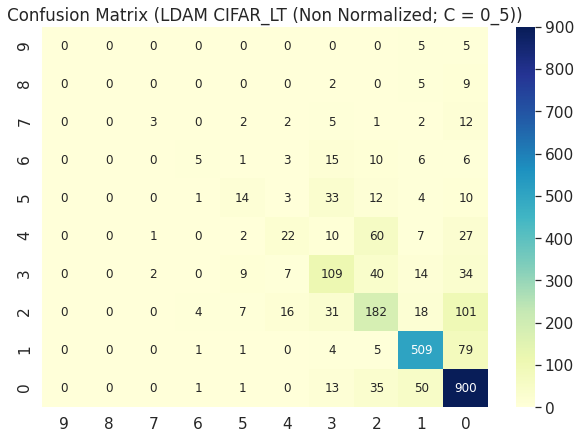

The testing error of the model trained using LDAM CIFAR_LT (Non Normalized; C = 1) is: 0.304681194511703
The testing loss of the model trained using LDAM CIFAR_LT (Non Normalized; C = 1) is: 0.9921933603592408


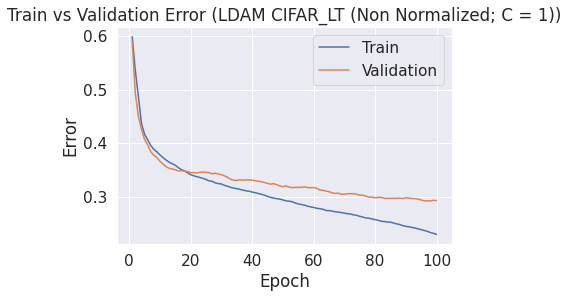

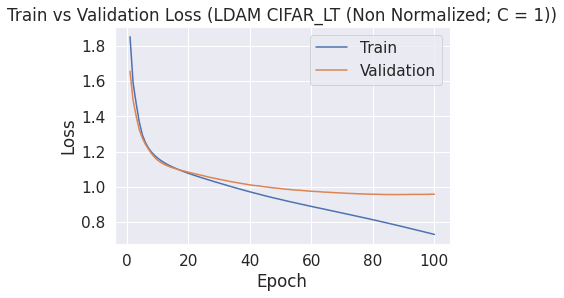

[[907  52  25  14   0   0   1   0   0   1]
 [ 85 503   4   6   0   1   0   0   0   0]
 [102  16 176  43  13   6   2   1   0   0]
 [ 40  12  43 103   7   7   1   2   0   0]
 [ 28   7  63  14  15   1   1   0   0   0]
 [ 10   4  15  31   2  13   1   1   0   0]
 [  6   8   7  17   3   1   4   0   0   0]
 [ 14   3   1   6   1   0   0   2   0   0]
 [  8   6   0   2   0   0   0   0   0   0]
 [  5   5   0   0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           0       0.75      0.91      0.82      1000
           1       0.82      0.84      0.83       599
           2       0.53      0.49      0.51       359
           3       0.44      0.48      0.46       215
           4       0.37      0.12      0.18       129
           5       0.45      0.17      0.25        77
           6       0.40      0.09      0.14        46
           7       0.33      0.07      0.12        27
           8       0.00      0.00      0.00        16
           9       0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


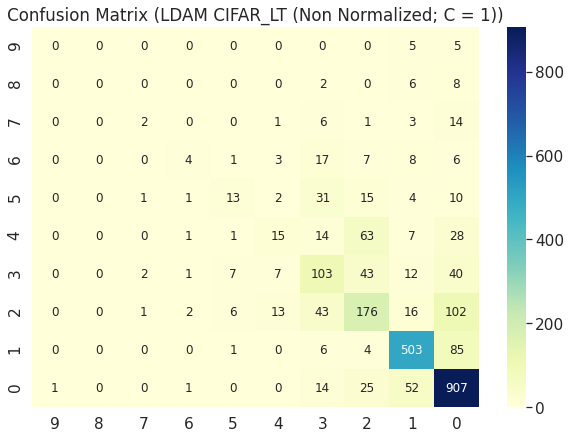

In [ ]:
# LDAM - Non Normalized Evaluation
C_list = [0.1,0.5,1]

for c in C_list:
  c_name = str(c).replace(".","_")
  loss_name = "LDAM CIFAR_LT (Non Normalized; C = {})".format(c_name)
  loss_function = LDAMLoss_IMP(n=count,C=c,normalize=False)
  graph_path = "model_CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_{}_bs64_lr0.0001_epoch99".format(c_name)
  model_path = "CIFAR_LT_Loss_Function_Evaluation_LDAM_IMP_Non_Normalized_C_{}best_val_loss".format(c_name)
  Print_Loss_Function_Evaluation(loss_name,loss_function,test_loader,graph_path,model_path,using_cifar=True)